In [9]:
X_stream = df[features]
y_stream = df['Label_encoded']
dates_stream = df['Date'].reset_index(drop=True)
n_total = len(df)
window_size = 20

# ARF+ADWIN
arf_adwin = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_adwin_pred = []

# ARF+ADWIN+Selective+Force Minor
arf_sel = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_sel_pred = []
adwin_sel = drift.ADWIN()
y_true_window_sel = deque(maxlen=window_size)
y_pred_window_sel = deque(maxlen=window_size)
selective_mode = True  # Flag for selective update
cooldown = 30  # Optional: cooldown after drift

# Simpan untuk F1-score & plotting
rf_pred = []
arf_adwin_pred = []
arf_sel_pred = []
all_true = []
adwin_drift_point = []  # For visualization

for i, (x, y) in tqdm(enumerate(stream.iter_pandas(X_stream, y_stream)), total=n_total, desc='Streaming Models'):
    # --- Static RF ---
    x_df = pd.DataFrame([x])
    y_pred_rf = rf_model.predict(x_df)[0]
    rf_pred.append(y_pred_rf)

    # --- ARF+ADWIN (Standard) ---
    y_pred_adwin = arf_adwin.predict_one(x)
    arf_adwin_pred.append(int(y_pred_adwin) if y_pred_adwin is not None else 0)
    arf_adwin.learn_one(x, y)

    # --- ARF+ADWIN+Selective+Force Minor ---
    y_pred_sel = arf_sel.predict_one(x)
    arf_sel_pred.append(int(y_pred_sel) if y_pred_sel is not None else 0)
    y_true_window_sel.append(y)
    y_pred_window_sel.append(y_pred_sel if y_pred_sel is not None else 0)
    all_true.append(int(y))

    # --- Update Selective (rolling F1 window) ---
    f1_before = None
    f1_after = None
    import copy
    if len(y_true_window_sel) == window_size:
        metric = metrics.F1()
        for yt, yp in zip(y_true_window_sel, y_pred_window_sel):
            metric.update(yt, yp)
        f1_before = metric.get()

        arf_temp = copy.deepcopy(arf_sel)
        arf_temp.learn_one(x, y)
        y_pred_temp = arf_temp.predict_one(x)
        temp_pred_window = deque(list(y_pred_window_sel), maxlen=window_size)
        temp_pred_window[-1] = y_pred_temp if y_pred_temp is not None else 0
        metric_temp = metrics.F1()
        for yt, yp in zip(y_true_window_sel, temp_pred_window):
            metric_temp.update(yt, yp)
        f1_after = metric_temp.get()

    # --- Drift Detection ---
    error = int(y_pred_sel != y) if y_pred_sel is not None else 1
    adwin_sel.update(error)
    if adwin_sel.drift_detected:
        selective_mode = False
        drift_count = cooldown  # Non-s elective for 'cooldown' steps
        adwin_drift_point.append(i)
    if not selective_mode:
        arf_sel.learn_one(x, y)
        drift_count -= 1
        if drift_count <= 0:
            selective_mode = True
    else:
        # Hybrid update
        if y != 0:
            arf_sel.learn_one(x, y)
        elif f1_before is None or f1_after is None or f1_after >= f1_before:
            arf_sel.learn_one(x, y)
    # else: skip update


Streaming Models:   0%|          | 0/8267 [00:00<?, ?it/s]

Streaming Models:   1%|▏         | 109/8267 [00:02<03:01, 45.02it/s]


KeyboardInterrupt: 

In [ ]:
!pip install imblearn


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [2]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from river import forest, drift, stream, metrics
from collections import deque
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE

# Load & prepare data (sudah Anda lakukan)
df = pd.read_csv('C:\\Users\\geose\\Downloads\\ml\\df.csv')
df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
features = ['VA', 'EVA', 'VB', 'EVB', 'LF', 'E', 'MP', 'EMP', 'ETOT', 'kumulatif']
df[features] = df[features].fillna(0)
df['Label_encoded'] = df['Label'].map({'Non': 0, 'Efusif': 1, 'Eksplosif': 2})

# Cutoff for static training
cutoff = pd.to_datetime("1999-12-31")
X_train = df[df['Date'] <= cutoff][features]
y_train = df[df['Date'] <= cutoff]['Label_encoded']

# 1. Train Static RF
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# 2. Train RF + SMOTE (tanpa mengganggu streaming loop)
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

rf_smote_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_smote_model.fit(X_train_smote, y_train_smote)


RandomForestClassifier(random_state=42)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from collections import deque, Counter
from tqdm import tqdm
import random

from river import forest, metrics, stream, drift
X_stream = df[features]                  # start from index 0
y_stream = df['Label_encoded']
dates_stream = df['Date'].reset_index(drop=True)
n_total = len(df)   

# Init ARF
arf_sel = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_adwin = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
adwin_sel = drift.ADWIN()

arf_sel_pred, arf_adwin_pred = [], []
rf_pred, rf_smote_pred, all_true = [], [], []
minority_buffer = deque(maxlen=30)
y_window = deque(maxlen=100)

def closest_pair(buffer):
    X = [list(x.values()) for x in buffer]
    dists = [((i, j), np.linalg.norm(np.array(X[i]) - np.array(X[j])))
             for i in range(len(X)) for j in range(i + 1, len(X))]
    if not dists:
        return buffer[0], buffer[0]
    (i, j), _ = min(dists, key=lambda x: x[1])
    return buffer[i], buffer[j]

# Start streaming loop for each instance in the data stream
for i, (x, y) in tqdm(enumerate(stream.iter_pandas(X_stream, y_stream)), total=n_total):

    # Convert instance x to a DataFrame to allow static RF prediction
    x_df = pd.DataFrame([x])

    # === STATIC BASELINE PREDICTIONS ===
    # Predict using a static Random Forest trained up to cutoff (1999)
    rf_pred.append(rf_model.predict(x_df)[0])

    # Predict using a static RF model trained with SMOTE-balanced data
    rf_smote_pred.append(rf_smote_model.predict(x_df)[0])

    # === ADAPTIVE RANDOM FOREST WITH ADWIN ===
    # Predict class using ARF with ADWIN drift detector (no oversampling)
    y_pred_adwin = arf_adwin.predict_one(x)
    y_pred_adwin = int(y_pred_adwin) if y_pred_adwin is not None else 0
    arf_adwin_pred.append(y_pred_adwin)

    # Update ARF+ADWIN model with the true label
    arf_adwin.learn_one(x, y)

    # === ARF IV.A: CONFIDENCE-AWARE + ONLINE SMOTE ===
    # Predict class using ARF IV.A (selective oversampling + drift response)
    y_pred_sel = arf_sel.predict_one(x)
    y_pred_sel = int(y_pred_sel) if y_pred_sel is not None else 0
    arf_sel_pred.append(y_pred_sel)
    all_true.append(y)

    # Maintain a sliding window of true labels to identify the minority class dynamically
    y_window.append(y)
    if len(y_window) < y_window.maxlen:
        # Allow initial learning before confidence-aware logic activates
        arf_sel.learn_one(x, y)
        continue

    # Determine the current minority class from recent labels in the window
    y_counts = Counter(y_window)
    minority_class = min(y_counts, key=y_counts.get)

    # Train ARF IV.A model on the actual input instance
    arf_sel.learn_one(x, y)

    # === CONFIDENCE-AWARE SYNTHETIC OVERSAMPLING ===
    # Retrieve the class probability distribution (confidence scores)
    proba = arf_sel.predict_proba_one(x)
    conf = proba.get(y, 0)  # Confidence in the correct class

    # Only proceed if the instance belongs to the minority class AND the model lacks confidence
    if y == minority_class and conf < 0.6 and i % 10 == 0:

        # Add the instance to a memory buffer for the minority class
        minority_buffer.append(x)

        # Generate a synthetic sample only when at least two buffer elements are available
        if len(minority_buffer) >= 2:
            # Select the closest pair based on Euclidean distance
            x1, x2 = closest_pair(minority_buffer)

            # Interpolate between x1 and x2 to create a synthetic instance, with minor noise
            synthetic_sample = {
                k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01)
                for k in x1
            }

            # Inject the synthetic sample into the ARF IV.A learner
            arf_sel.learn_one(synthetic_sample, y)

    # === DRIFT-AWARE LIGHT RETRAINING ===
    # Update drift detector based on prediction error
    error = int(y_pred_sel != y)
    if adwin_sel.update(error) and adwin_sel.drift_detected:
        # Upon drift detection, retrain model lightly using synthetic minority samples
        for s in random.sample(list(minority_buffer), min(5, len(minority_buffer))):
            arf_sel.learn_one(s, minority_class)

100%|██████████| 8267/8267 [01:58<00:00, 70.03it/s]


In [3]:
from collections import deque, Counter
import random
from river import tree, forest, drift, stream
from tqdm import tqdm
import pandas as pd
import numpy as np

from river import forest, metrics, stream, drift
X_stream = df[features]                  # start from index 0
y_stream = df['Label_encoded']
dates_stream = df['Date'].reset_index(drop=True)
n_total = len(df)   

# === Inisialisasi model ===
arf_adwin = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
arf_sel = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
adwin_sel = drift.ADWIN()

ht_adwin = tree.HoeffdingTreeClassifier()
ht_sel = tree.HoeffdingTreeClassifier()
adwin_ht = drift.ADWIN()
adwin_ht_iv = drift.ADWIN()

# === Buffer dan Window ===
minority_buffer = deque(maxlen=30)
minority_buffer_ht = deque(maxlen=30)
y_window = deque(maxlen=100)
y_window_ht = deque(maxlen=100)

# === Hasil prediksi ===
arf_adwin_pred, arf_sel_pred = [], []
ht_adwin_pred, ht_sel_pred = [], []
rf_pred, rf_smote_pred, all_true = [], [], []
def closest_pair(buffer):
    X = [list(x.values()) for x in buffer]
    dists = [((i, j), np.linalg.norm(np.array(X[i]) - np.array(X[j])))
             for i in range(len(X)) for j in range(i + 1, len(X))]
    if not dists:
        return buffer[0], buffer[0]
    (i, j), _ = min(dists, key=lambda x: x[1])
    return buffer[i], buffer[j]

# === Loop streaming ===
for i, (x, y) in tqdm(enumerate(stream.iter_pandas(X_stream, y_stream)), total=n_total):

    # Convert to DataFrame for static RF
    x_df = pd.DataFrame([x])
    rf_pred.append(rf_model.predict(x_df)[0])
    rf_smote_pred.append(rf_smote_model.predict(x_df)[0])

    # === ARF + ADWIN ===
    y_pred_adwin = arf_adwin.predict_one(x)
    y_pred_adwin = int(y_pred_adwin) if y_pred_adwin is not None else 0
    arf_adwin_pred.append(y_pred_adwin)
    arf_adwin.learn_one(x, y)

    # === ARF + IV.A ===
    y_pred_sel = arf_sel.predict_one(x)
    y_pred_sel = int(y_pred_sel) if y_pred_sel is not None else 0
    arf_sel_pred.append(y_pred_sel)
    all_true.append(y)

    y_window.append(y)
    if len(y_window) < y_window.maxlen:
        arf_sel.learn_one(x, y)
    else:
        minority_class = min(Counter(y_window), key=Counter(y_window).get)
        arf_sel.learn_one(x, y)
        proba = arf_sel.predict_proba_one(x)
        conf = proba.get(y, 0)
        if y == minority_class and conf < 0.8 and i % 10 == 0:
            minority_buffer.append(x)
            if len(minority_buffer) >= 2:
                x1, x2 = closest_pair(minority_buffer)
                synthetic_sample = {k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01) for k in x1}
                arf_sel.learn_one(synthetic_sample, y)
        if adwin_sel.update(int(y_pred_sel != y)) and adwin_sel.drift_detected:
            for s in random.sample(list(minority_buffer), min(5, len(minority_buffer))):
                arf_sel.learn_one(s, minority_class)

    # === HT + ADWIN ===
    y_pred_ht = ht_adwin.predict_one(x)
    y_pred_ht = int(y_pred_ht) if y_pred_ht is not None else 0
    ht_adwin_pred.append(y_pred_ht)
    ht_adwin.learn_one(x, y)
    if adwin_ht.update(int(y_pred_ht != y)) and adwin_ht.drift_detected:
        ht_adwin = tree.HoeffdingTreeClassifier()

    # === HT + IV.A ===
    y_pred_ht_iv = ht_sel.predict_one(x)
    y_pred_ht_iv = int(y_pred_ht_iv) if y_pred_ht_iv is not None else 0
    ht_sel_pred.append(y_pred_ht_iv)

    y_window_ht.append(y)
    if len(y_window_ht) < y_window_ht.maxlen:
        ht_sel.learn_one(x, y)
    else:
        minority_class_ht = min(Counter(y_window_ht), key=Counter(y_window_ht).get)
        ht_sel.learn_one(x, y)
        proba_ht = ht_sel.predict_proba_one(x)
        conf_ht = proba_ht.get(y, 0)
        if y == minority_class_ht and conf_ht < 0.8 and i % 10 == 0:
            minority_buffer_ht.append(x)
            if len(minority_buffer_ht) >= 2:
                x1, x2 = closest_pair(minority_buffer_ht)
                synthetic_sample_ht = {k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01) for k in x1}
                ht_sel.learn_one(synthetic_sample_ht, y)
        if adwin_ht_iv.update(int(y_pred_ht_iv != y)) and adwin_ht_iv.drift_detected:
            for s in random.sample(list(minority_buffer_ht), min(5, len(minority_buffer_ht))):
                ht_sel.learn_one(s, minority_class_ht)


100%|██████████| 8267/8267 [01:45<00:00, 78.46it/s]


In [ ]:
import river
print(river.__version__)

import sklearn
print(sklearn.__version__)


0.19.0
1.3.2


In [4]:
import pandas as pd
from sklearn.metrics import classification_report
import numpy as np

# This code assumes that the following variables are already available in your notebook's environment:
# 'dates_stream', 'all_true', 'rf_pred', 'rf_smote_pred',
# 'arf_adwin_pred', 'arf_sel_pred', 'ht_adwin_pred', and 'ht_sel_pred'

# 1. Create a DataFrame with your data
data = {
    'Date': dates_stream,
    'y_true': all_true,
    'Static RF': rf_pred,
    'RF + SMOTE': rf_smote_pred,
    'ARF + ADWIN': arf_adwin_pred,
    'ARF IV.A': arf_sel_pred,
    'HT + ADWIN': ht_adwin_pred,
    'HT IV.A': ht_sel_pred
}
results_df = pd.DataFrame(data)

# 2. Convert the 'Date' column to datetime objects and set it as the DataFrame index
results_df['Date'] = pd.to_datetime(results_df['Date'])
results_df.set_index('Date', inplace=True)

# 3. Define a function to calculate the F1-score for each class
def calculate_f1_per_class(group):
    if len(group) == 0:
        return None
    
    unique_labels = sorted(np.unique(all_true))
    model_names = ['Static RF', 'RF + SMOTE', 'ARF + ADWIN', 'ARF IV.A', 'HT + ADWIN', 'HT IV.A']
    all_scores = {}

    for model in model_names:
        report = classification_report(
            group['y_true'], 
            group[model], 
            output_dict=True, 
            labels=unique_labels, 
            zero_division=0
        )
        for label in unique_labels:
            class_key = str(label)
            column_name = f"{model}_F1_Class_{class_key}"
            all_scores[column_name] = report[class_key]['f1-score']
            
    return pd.Series(all_scores)

# 4. Resample the data into 3-month periods and apply the calculation
quarterly_f1_per_class = results_df.resample('3M').apply(calculate_f1_per_class)

# 5. Clean up the final DataFrame and display it
final_table = quarterly_f1_per_class.round(3).dropna(how='all')
print("F1-Score For Every 3 Months (Per Class)")
print(final_table)

# 6. Save the DataFrame to a CSV file
final_table.to_csv('f1_scores_per_class_quarterly.csv')

print("\nSuccessfully saved the table to '0.6f1_scores_per_class_quarterly.csv'")

F1-Score For Every 3 Months (Per Class)
            Static RF_F1_Class_0  Static RF_F1_Class_1  Static RF_F1_Class_2  \
Date                                                                           
1991-01-31                 1.000                   0.0                   0.0   
1991-04-30                 1.000                   0.0                   0.0   
1991-07-31                 1.000                   0.0                   0.0   
1991-10-31                 1.000                   0.0                   0.0   
1992-01-31                 1.000                   1.0                   0.0   
...                          ...                   ...                   ...   
2012-10-31                 0.972                   0.0                   0.0   
2013-01-31                 0.983                   0.0                   0.0   
2013-04-30                 1.000                   0.0                   0.0   
2013-07-31                 0.955                   0.0                   0.0   


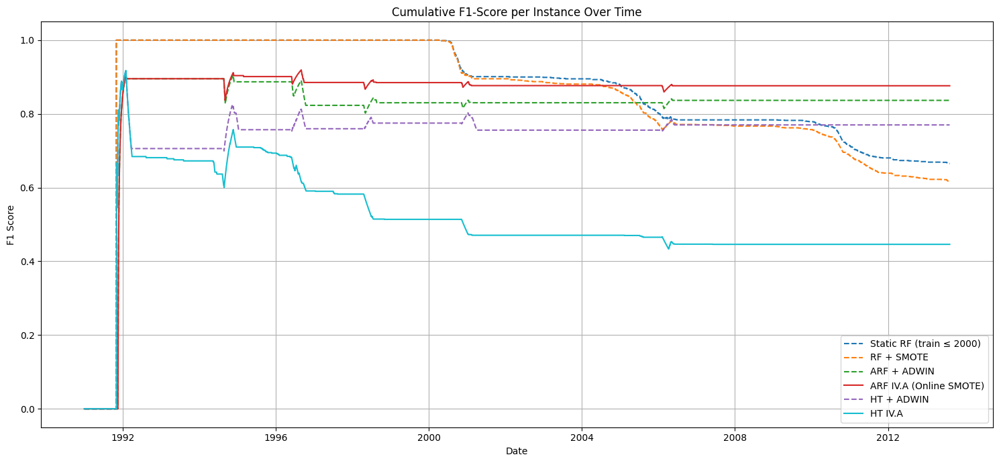

In [5]:
def cumulative_f1(y_true_list, y_pred_list):
    f1_scores = []
    f1_metric = metrics.F1()
    for yt, yp in zip(y_true_list, y_pred_list):
        f1_metric.update(yt, yp)
        f1_scores.append(f1_metric.get())
    return f1_scores

# Hitung semua cumulative F1
cum_f1_rf = cumulative_f1(all_true, rf_pred)
cum_f1_rf_smote = cumulative_f1(all_true, rf_smote_pred)
cum_f1_arf_adwin = cumulative_f1(all_true, arf_adwin_pred)
cum_f1_arf_iva = cumulative_f1(all_true, arf_sel_pred)
cum_f1_ht_adwin = cumulative_f1(all_true, ht_adwin_pred)
cum_f1_ht_iva = cumulative_f1(all_true, ht_sel_pred)

plt.figure(figsize=(15, 7))
# Definisikan warna untuk tiap model
color_rf = '#1f77b4'           # blue
color_rf_smote = '#ff7f0e'     # orange
color_arf_adwin = '#2ca02c'    # green
color_arf_iva = '#d62728'      # red
color_ht_adwin = '#9467bd'     # purple
color_ht_iva = '#17becf'       # cyan
# Memplot garis untuk setiap model.
# Sumbu X adalah tanggal (dates_stream) dan sumbu Y adalah F1-score kumulatif.
plt.plot(dates_stream, cum_f1_rf, label='Static RF (train ≤ 2000)', linestyle='--', color=color_rf)           # Model Random Forest statis
plt.plot(dates_stream, cum_f1_rf_smote, label='RF + SMOTE', linestyle='--', color=color_rf_smote)            # Model RF dengan SMOTE
plt.plot(dates_stream, cum_f1_arf_adwin, label='ARF + ADWIN', linestyle='--', color=color_arf_adwin)         # Model ARF dengan detektor drift ADWIN
plt.plot(dates_stream, cum_f1_arf_iva, label='ARF IV.A (Online SMOTE)', linestyle='-', color=color_arf_iva)  # Model ARF dengan oversampling online (garis solid)
plt.plot(dates_stream, cum_f1_ht_adwin, label='HT + ADWIN', linestyle='--', color=color_ht_adwin)            # Model Hoeffding Tree dengan ADWIN
plt.plot(dates_stream, cum_f1_ht_iva, label='HT IV.A', linestyle='-', color=color_ht_iva)                    # Model HT dengan oversampling online (garis solid)


plt.legend()
plt.grid(True)
plt.title("Cumulative F1-Score per Instance Over Time")
plt.xlabel("Date")
plt.ylabel("F1 Score")
plt.tight_layout()
plt.show()

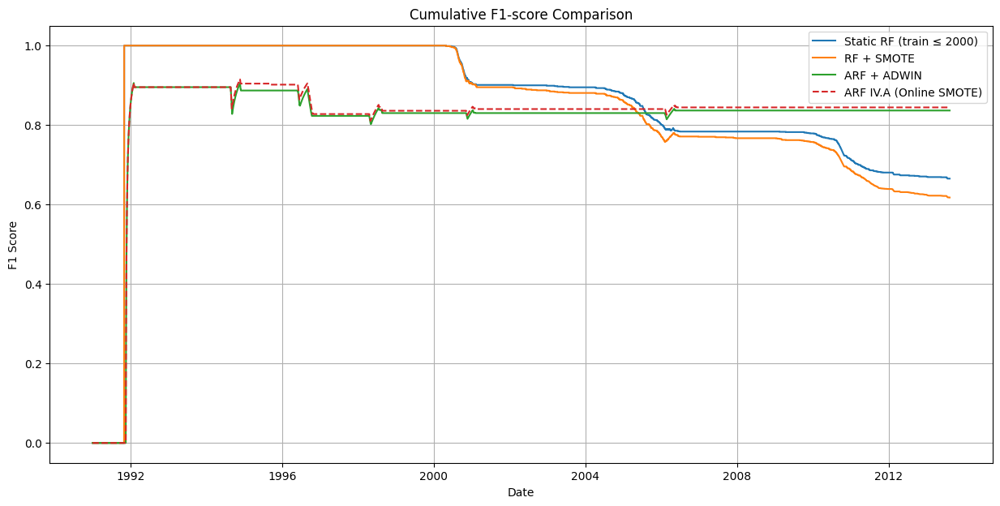

In [ ]:
def cumulative_f1(y_true_list, y_pred_list):
    f1_scores = []
    metric = metrics.F1()
    for yt, yp in zip(y_true_list, y_pred_list):
        metric.update(yt, yp)
        f1_scores.append(metric.get())
    return f1_scores

f1_rf = cumulative_f1(all_true, rf_pred)
f1_adwin = cumulative_f1(all_true, arf_adwin_pred)
f1_smote = cumulative_f1(all_true, arf_sel_pred)

plt.figure(figsize=(15, 7))
plt.plot(dates_stream, cum_f1_rf, label='Static RF (train ≤ 2000)')
plt.plot(dates_stream, cum_f1_rf_smote, label='RF + SMOTE')
plt.plot(dates_stream, cum_f1_arf_adwin, label='ARF + ADWIN')
plt.plot(dates_stream, cum_f1_arf_iva, label='ARF IV.A (Online SMOTE)', linestyle='--')

plt.legend()
plt.title("Cumulative F1-score Comparison")
plt.xlabel("Date")
plt.ylabel("F1 Score")
plt.grid(True)
plt.show()


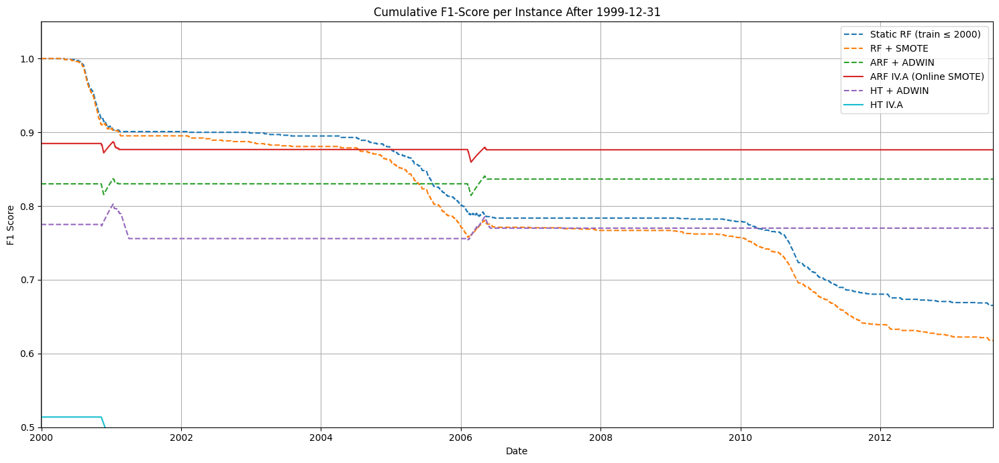

In [6]:
import datetime

# Definisikan tanggal batas bawah
threshold_date = datetime.datetime.strptime('1999-12-31', '%Y-%m-%d')

# Temukan index pertama yang memenuhi syarat
start_index = next(i for i, date in enumerate(dates_stream) if date >= threshold_date)

# Potong semua data dari index tersebut
dates_cut = dates_stream[start_index:]
cum_f1_rf_cut = cum_f1_rf[start_index:]
cum_f1_rf_smote_cut = cum_f1_rf_smote[start_index:]
cum_f1_arf_adwin_cut = cum_f1_arf_adwin[start_index:]
cum_f1_arf_iva_cut = cum_f1_arf_iva[start_index:]
cum_f1_ht_adwin_cut = cum_f1_ht_adwin[start_index:]
cum_f1_ht_iva_cut = cum_f1_ht_iva[start_index:]

# Plot
plt.figure(figsize=(15, 7))

plt.plot(dates_cut, cum_f1_rf_cut, label='Static RF (train ≤ 2000)', linestyle='--', color=color_rf)
plt.plot(dates_cut, cum_f1_rf_smote_cut, label='RF + SMOTE', linestyle='--', color=color_rf_smote)
plt.plot(dates_cut, cum_f1_arf_adwin_cut, label='ARF + ADWIN', linestyle='--', color=color_arf_adwin)
plt.plot(dates_cut, cum_f1_arf_iva_cut, label='ARF IV.A (Online SMOTE)', linestyle='-', color=color_arf_iva)
plt.plot(dates_cut, cum_f1_ht_adwin_cut, label='HT + ADWIN', linestyle='--', color=color_ht_adwin)
plt.plot(dates_cut, cum_f1_ht_iva_cut, label='HT IV.A', linestyle='-', color=color_ht_iva)

plt.legend()
plt.grid(True)
plt.title("Cumulative F1-Score per Instance After 1999-12-31")
plt.xlabel("Date")
plt.ylabel("F1 Score")
plt.xlim([threshold_date, max(dates_stream)])
plt.ylim(0.5, 1.05)
plt.tight_layout()
plt.show()


Rolling F1 (window=100): 100%|██████████| 8167/8167 [00:09<00:00, 890.78it/s]


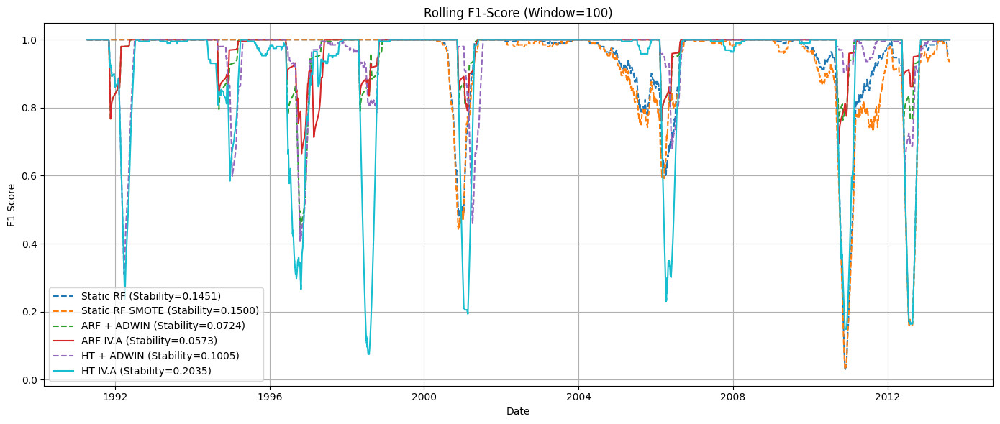

In [7]:
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm  # Tambahkan tqdm

# Fungsi rolling F1-score dengan tqdm
def rolling_f1(y_true, y_pred, window=100):
    scores = [None] * window  # padding awal
    for i in tqdm(range(window, len(y_true)), desc=f"Rolling F1 (window={window})"):
        score = f1_score(y_true[i-window:i], y_pred[i-window:i], average='weighted', zero_division=0)
        scores.append(score)
    return scores

# Hitung Rolling F1-score untuk setiap model dengan menggunakan jendela pergeseran (rolling window) sepanjang 100 data
# Fungsi rolling_f1 akan menghitung skor F1 setiap 100 data terbaru, seiring waktu berjalan (online evaluation)

roll_f1_rf = rolling_f1(all_true, rf_pred, window=100)              # Rolling F1 untuk model Random Forest tanpa SMOTE
roll_f1_rf_smote = rolling_f1(all_true, rf_smote_pred, window=100)  # Rolling F1 untuk Random Forest dengan SMOTE
roll_f1_arf_adwin = rolling_f1(all_true, arf_adwin_pred, window=100) # ARF dengan deteksi concept drift menggunakan ADWIN
roll_f1_arf_iva = rolling_f1(all_true, arf_sel_pred, window=100)     # ARF versi IVA yang menggunakan strategi seleksi adaptif
roll_f1_ht_adwin = rolling_f1(all_true, ht_adwin_pred, window=100)   # Hoeffding Tree dengan ADWIN
roll_f1_ht_iva = rolling_f1(all_true, ht_sel_pred, window=100)       # Hoeffding Tree versi IVA dengan strategi pemilihan adaptif

# Hitung stabilitas model berdasarkan standar deviasi dari skor F1 yang dihitung secara rolling
# Semakin kecil standar deviasi, semakin stabil performa model dari waktu ke waktu
# Digunakan np.nanstd untuk menghindari nilai None di awal window yang tidak valid

stability_rf = np.nanstd([x for x in roll_f1_rf if x is not None])                  # Stabilitas RF tanpa SMOTE
stability_rf_smote = np.nanstd([x for x in roll_f1_rf_smote if x is not None])      # Stabilitas RF dengan SMOTE
stability_arf_adwin = np.nanstd([x for x in roll_f1_arf_adwin if x is not None])    # Stabilitas ARF + ADWIN
stability_arf_iva = np.nanstd([x for x in roll_f1_arf_iva if x is not None])        # Stabilitas ARF + IVA
stability_ht_adwin = np.nanstd([x for x in roll_f1_ht_adwin if x is not None])      # Stabilitas HT + ADWIN
stability_ht_iva = np.nanstd([x for x in roll_f1_ht_iva if x is not None])          # Stabilitas HT + IVA

# Mengatur ukuran figure untuk plot.
plt.figure(figsize=(14, 6))

# Membuat plot untuk memvisualisasikan F1-score bergulir (rolling F1-score) dari waktu ke waktu.
# Setiap garis merepresentasikan satu model, dengan warna dan gaya garis yang berbeda.
# Label pada setiap garis juga menyertakan skor stabilitas (Stability) dari model tersebut.
plt.plot(dates_stream, roll_f1_rf, label=f'Static RF (Stability={stability_rf:.4f})', linestyle='--', color=color_rf)
plt.plot(dates_stream, roll_f1_rf_smote, label=f'Static RF SMOTE (Stability={stability_rf_smote:.4f})', linestyle='--', color=color_rf_smote)
plt.plot(dates_stream, roll_f1_arf_adwin, label=f'ARF + ADWIN (Stability={stability_arf_adwin:.4f})', linestyle='--', color=color_arf_adwin)
plt.plot(dates_stream, roll_f1_arf_iva, label=f'ARF IV.A (Stability={stability_arf_iva:.4f})', linestyle='-', color=color_arf_iva) # Garis solid untuk model usulan
plt.plot(dates_stream, roll_f1_ht_adwin, label=f'HT + ADWIN (Stability={stability_ht_adwin:.4f})', linestyle='--', color=color_ht_adwin)
plt.plot(dates_stream, roll_f1_ht_iva, label=f'HT IV.A (Stability={stability_ht_iva:.4f})', linestyle='-', color=color_ht_iva) # Garis solid untuk model usulan

# === Pengaturan Layout dan Tampilan Plot ===
# Memberikan judul pada plot.
plt.title('Rolling F1-Score (Window=100)')
# Memberikan label untuk sumbu X.
plt.xlabel('Date')
# Memberikan label untuk sumbu Y.
plt.ylabel('F1 Score')
# Menampilkan legenda untuk mengidentifikasi setiap garis model.
plt.legend()
# Menambahkan grid untuk mempermudah pembacaan nilai pada plot.
plt.grid(True)
# Menyesuaikan layout secara otomatis agar tidak ada teks yang tumpang tindih.
plt.tight_layout()
# Menampilkan hasil akhir plot.
plt.show()


In [ ]:
from scipy.stats import wilcoxon
import numpy as np

# --- utilities ---
def to_float_array(seq):
    """Convert list with None to float array with NaNs."""
    return np.array([np.nan if x is None else x for x in seq], dtype=float)

def wilcoxon_compare(a, b, name_a, name_b, alternative='greater'):
    """
    Paired Wilcoxon (signed-rank) test after removing NaNs.
    alternative: 'greater' tests median(a - b) > 0
                 use 'two-sided' if you prefer non-directional.
    """
    a = to_float_array(a)
    b = to_float_array(b)
    mask = ~np.isnan(a) & ~np.isnan(b)
    n = int(mask.sum())
    if n < 10:
        print(f"[WARN] Too few paired points for {name_a} vs {name_b}: n={n}")
        return None, None, n
    stat, p = wilcoxon(a[mask], b[mask], zero_method='wilcox', alternative=alternative)
    print(f"Wilcoxon ({alternative}) — {name_a} > {name_b}: W={stat:.0f}, p={p:.4g}, n={n}")
    return stat, p, n

# --- run comparisons: ARF IV.A vs baselines ---
name_arf_iva = "ARF IV.A"
pairs = [
    (roll_f1_arf_iva, roll_f1_arf_adwin, "ARF + ADWIN"),
    (roll_f1_arf_iva, roll_f1_ht_adwin, "HT + ADWIN"),
    (roll_f1_arf_iva, roll_f1_ht_iva,   "HT IV.A"),
    (roll_f1_arf_iva, roll_f1_rf,       "Static RF"),
    (roll_f1_arf_iva, roll_f1_rf_smote, "Static RF + SMOTE"),
]

for a, b, name_b in pairs:
    wilcoxon_compare(a, b, name_arf_iva, name_b, alternative='greater')

# --- (optional) also test cumulative curves if you want ---
# stat_cum, p_cum, n_cum = wilcoxon_compare(cum_f1_arf_iva, cum_f1_arf_adwin, "ARF IV.A (cum.)", "ARF + ADWIN (cum.)")


In [ ]:
from scipy.stats import wilcoxon
import numpy as np

# --- utilities ---
def to_float_array(seq):
    """Convert list with None to float array with NaNs."""
    return np.array([np.nan if x is None else x for x in seq], dtype=float)

def wilcoxon_compare(a, b, name_a, name_b, alternative='greater'):
    """
    Paired Wilcoxon (signed-rank) test after removing NaNs.
    alternative: 'greater' tests median(a - b) > 0
                 use 'two-sided' if you prefer non-directional.
    """
    a = to_float_array(a)
    b = to_float_array(b)
    mask = ~np.isnan(a) & ~np.isnan(b)
    n = int(mask.sum())
    if n < 10:
        print(f"[WARN] Too few paired points for {name_a} vs {name_b}: n={n}")
        return None, None, n
    stat, p = wilcoxon(a[mask], b[mask], zero_method='wilcox', alternative=alternative)
    print(f"Wilcoxon ({alternative}) — {name_a} > {name_b}: W={stat:.0f}, p={p:.4g}, n={n}")
    return stat, p, n

# --- run comparisons: ARF IV.A vs baselines ---
name_arf_iva = "ARF IV.A"
pairs = [
    (roll_f1_arf_iva, roll_f1_arf_adwin, "ARF + ADWIN"),
    (roll_f1_arf_iva, roll_f1_ht_adwin, "HT + ADWIN"),
    (roll_f1_arf_iva, roll_f1_ht_iva,   "HT IV.A"),
    (roll_f1_arf_iva, roll_f1_rf,       "Static RF"),
    (roll_f1_arf_iva, roll_f1_rf_smote, "Static RF + SMOTE"),
]

for a, b, name_b in pairs:
    wilcoxon_compare(a, b, name_arf_iva, name_b, alternative='greater')

# --- (optional) also test cumulative curves if you want ---
# stat_cum, p_cum, n_cum = wilcoxon_compare(cum_f1_arf_iva, cum_f1_arf_adwin, "ARF IV.A (cum.)", "ARF + ADWIN (cum.)")


Wilcoxon (greater) — ARF IV.A > ARF + ADWIN: W=674581, p=2.551e-06, n=8167
Wilcoxon (greater) — ARF IV.A > HT + ADWIN: W=2049856, p=1.219e-10, n=8167
Wilcoxon (greater) — ARF IV.A > HT IV.A: W=5814540, p=0, n=8167
Wilcoxon (greater) — ARF IV.A > Static RF: W=6351828, p=1.294e-91, n=8167
Wilcoxon (greater) — ARF IV.A > Static RF + SMOTE: W=9198609, p=2.286e-174, n=8167


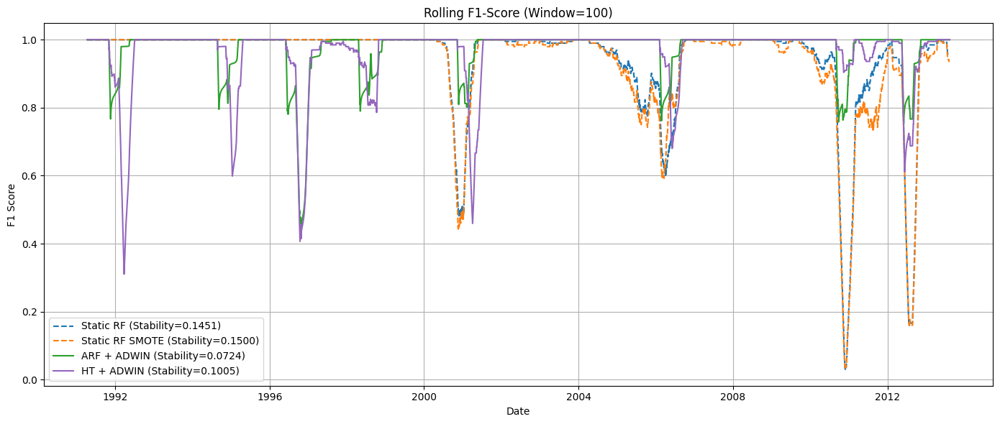

In [ ]:
# Mengatur ukuran figure untuk plot.
plt.figure(figsize=(14, 6))

plt.plot(dates_stream, roll_f1_rf, label=f'Static RF (Stability={stability_rf:.4f})', linestyle='--', color=color_rf)
plt.plot(dates_stream, roll_f1_rf_smote, label=f'Static RF SMOTE (Stability={stability_rf_smote:.4f})', linestyle='--', color=color_rf_smote)
plt.plot(dates_stream, roll_f1_arf_adwin, label=f'ARF + ADWIN (Stability={stability_arf_adwin:.4f})', linestyle='-', color=color_arf_adwin)
# plt.plot(dates_stream, roll_f1_arf_iva, label=f'ARF IV.A (Stability={stability_arf_iva:.4f})', linestyle='-', color=color_arf_iva) # Garis solid untuk model usulan
plt.plot(dates_stream, roll_f1_ht_adwin, label=f'HT + ADWIN (Stability={stability_ht_adwin:.4f})', linestyle='-', color=color_ht_adwin)
# plt.plot(dates_stream, roll_f1_ht_iva, label=f'HT IV.A (Stability={stability_ht_iva:.4f})', linestyle='-', color=color_ht_iva) # Garis solid untuk model usulan

# === Pengaturan Layout dan Tampilan Plot ===
# Memberikan judul pada plot.
plt.title('Rolling F1-Score (Window=100)')
# Memberikan label untuk sumbu X.
plt.xlabel('Date')
# Memberikan label untuk sumbu Y.
plt.ylabel('F1 Score')
# Menampilkan legenda untuk mengidentifikasi setiap garis model.
plt.legend()
# Menambahkan grid untuk mempermudah pembacaan nilai pada plot.
plt.grid(True)
# Menyesuaikan layout secara otomatis agar tidak ada teks yang tumpang tindih.
plt.tight_layout()
# Menampilkan hasil akhir plot.
plt.show()

Rolling F1 (window=100): 100%|████████████████████████████████████████████████████| 4881/4881 [00:06<00:00, 724.18it/s]


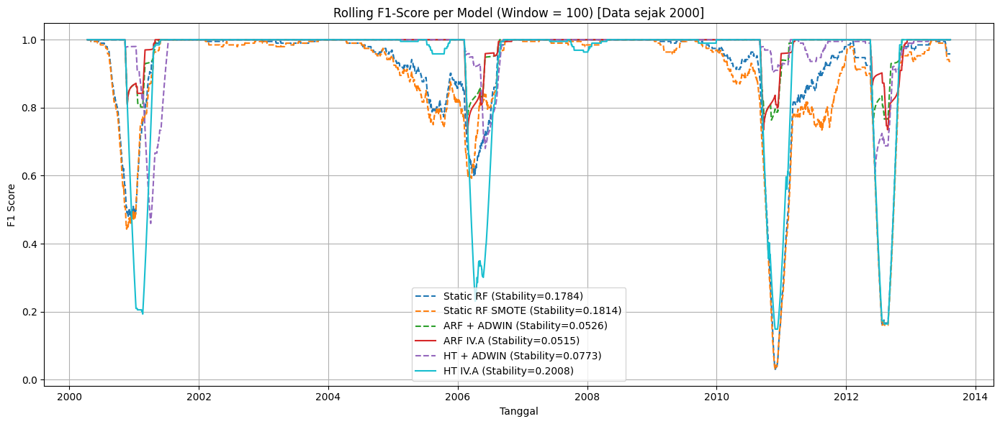

In [ ]:
from sklearn.metrics import f1_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm  # Progress bar

# ==== STEP 1: Siapkan DataFrame dan Filter dari Tahun 2000 ====
df_eval = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_IV.A': arf_sel_pred,
    'HT_ADWIN': ht_adwin_pred,
    'HT_IV.A': ht_sel_pred
})

# Filter hanya data dari tahun 2000 ke atas
df_eval = df_eval[df_eval['Date'].dt.year >= 2000].reset_index(drop=True)

# Update variabel untuk evaluasi
dates_stream = df_eval['Date']
all_true = df_eval['True']
rf_pred = df_eval['RF']
rf_smote_pred = df_eval['RF_SMOTE']
arf_adwin_pred = df_eval['ARF_ADWIN']
arf_sel_pred = df_eval['ARF_IV.A']
ht_adwin_pred = df_eval['HT_ADWIN']
ht_sel_pred = df_eval['HT_IV.A']

# ==== STEP 2: Definisikan Fungsi Rolling F1 ====
def rolling_f1(y_true, y_pred, window=180):
    scores = [None] * window  # padding awal
    for i in tqdm(range(window, len(y_true)), desc=f"Rolling F1 (window={window})"):
        score = f1_score(y_true[i-window:i], y_pred[i-window:i], average='weighted', zero_division=0)
        scores.append(score)
    return scores

# ==== STEP 3: Hitung Rolling F1 per Model ====
roll_f1_rf = rolling_f1(all_true, rf_pred, window=100)
roll_f1_rf_smote = rolling_f1(all_true, rf_smote_pred, window=100)
roll_f1_arf_adwin = rolling_f1(all_true, arf_adwin_pred, window=100)
roll_f1_arf_iva = rolling_f1(all_true, arf_sel_pred, window=100)
roll_f1_ht_adwin = rolling_f1(all_true, ht_adwin_pred, window=100)
roll_f1_ht_iva = rolling_f1(all_true, ht_sel_pred, window=100)

# ==== STEP 4: Hitung Stabilitas (Standar Deviasi Rolling F1) ====
stability_rf = np.nanstd([x for x in roll_f1_rf if x is not None])
stability_rf_smote = np.nanstd([x for x in roll_f1_rf_smote if x is not None])
stability_arf_adwin = np.nanstd([x for x in roll_f1_arf_adwin if x is not None])
stability_arf_iva = np.nanstd([x for x in roll_f1_arf_iva if x is not None])
stability_ht_adwin = np.nanstd([x for x in roll_f1_ht_adwin if x is not None])
stability_ht_iva = np.nanstd([x for x in roll_f1_ht_iva if x is not None])

# ==== STEP 5: Plot Rolling F1 Score ====
# Tentukan warna untuk masing-masing model (ganti sesuai preferensi)
# Definisikan warna yang kontras dan tidak menggunakan brown
color_rf = '#1f77b4'           # blue
color_rf_smote = '#ff7f0e'     # orange
color_arf_adwin = '#2ca02c'    # green
color_arf_iva = '#d62728'      # red (ARF IV.A)
color_ht_adwin = '#9467bd'     # purple
color_ht_iva = '#17becf'       # cyan/teal 

plt.figure(figsize=(14, 6))
plt.plot(dates_stream, roll_f1_rf, label=f'Static RF (Stability={stability_rf:.4f})', linestyle='--', color=color_rf)
plt.plot(dates_stream, roll_f1_rf_smote, label=f'Static RF SMOTE (Stability={stability_rf_smote:.4f})', linestyle='--', color=color_rf_smote)
plt.plot(dates_stream, roll_f1_arf_adwin, label=f'ARF + ADWIN (Stability={stability_arf_adwin:.4f})', linestyle='--', color=color_arf_adwin)
plt.plot(dates_stream, roll_f1_arf_iva, label=f'ARF IV.A (Stability={stability_arf_iva:.4f})', linestyle='-', color=color_arf_iva)
plt.plot(dates_stream, roll_f1_ht_adwin, label=f'HT + ADWIN (Stability={stability_ht_adwin:.4f})', linestyle='--', color=color_ht_adwin)
plt.plot(dates_stream, roll_f1_ht_iva, label=f'HT IV.A (Stability={stability_ht_iva:.4f})', linestyle='-', color=color_ht_iva)

plt.title('Rolling F1-Score per Model (Window = 100) [Data sejak 2000]')
plt.xlabel('Tanggal')
plt.ylabel('F1 Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [5]:
import pandas as pd
from sklearn.metrics import classification_report
import numpy as np # Import numpy for np.nan if you prefer

# Siapkan dataframe evaluasi (asumsi variabel-variabel ini sudah ada)
eval_df = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_IV.A': arf_sel_pred,
    'HT_ADWIN': ht_adwin_pred,
    'HT_IV.A': ht_sel_pred
})

# Tambahkan kolom periodik triwulan
eval_df['Period'] = eval_df['Date'].dt.to_period('Q')

# Ambil semua period unik setelah tahun 2000
periods = sorted(eval_df[eval_df['Date'].dt.year >= 2000]['Period'].unique())

# Daftar model untuk diiterasi
models = ['RF', 'RF_SMOTE', 'ARF_ADWIN', 'ARF_IV.A', 'HT_ADWIN', 'HT_IV.A']
labels = ['Non', 'Efusif', 'Eksplosif']

# Siapkan list untuk menampung hasil
all_f1_scores = []

# Loop tiap periode
for period in periods:
    quarter_data = eval_df[eval_df['Period'] == period]

    if quarter_data.empty:
        continue

    # Loop tiap model
    for model in models:
        # Hasilkan classification report dalam bentuk dictionary
        report = classification_report(
            quarter_data['True'],
            quarter_data[model],
            labels=[0, 1, 2],
            output_dict=True,
            zero_division=0
        )

        period_scores = {'Period': period, 'Model': model}

        # Ambil F1-score untuk setiap kelas
        for i, label in enumerate(labels):
            class_key = str(i)
            
            # --- THIS IS THE FIX ---
            # Cek apakah kelas ada di dalam report sebelum mengaksesnya
            if class_key in report:
                period_scores[f'F1_{label}'] = report[class_key]['f1-score']
            else:
                # Jika tidak ada, F1-score dianggap 0 untuk periode ini
                period_scores[f'F1_{label}'] = 0.0
        
        # Tambahkan ke list hasil
        all_f1_scores.append(period_scores)

# Konversi list hasil menjadi DataFrame untuk tampilan yang rapi
f1_df = pd.DataFrame(all_f1_scores)

# Tampilkan tabel F1-score
print("F1-Score per Class for Every 3 Months")
print(f1_df.round(3))

# Jika Anda ingin menyimpannya ke CSV
f1_df.to_csv('quarterly_f1_scores.csv', index=False)

F1-Score per Class for Every 3 Months
     Period      Model  F1_Non  F1_Efusif  F1_Eksplosif
0    2000Q1         RF   1.000        0.0           0.0
1    2000Q1   RF_SMOTE   1.000        0.0           0.0
2    2000Q1  ARF_ADWIN   1.000        0.0           0.0
3    2000Q1   ARF_IV.A   1.000        0.0           0.0
4    2000Q1   HT_ADWIN   1.000        0.0           0.0
..      ...        ...     ...        ...           ...
325  2013Q3   RF_SMOTE   0.868        0.0           0.0
326  2013Q3  ARF_ADWIN   1.000        0.0           0.0
327  2013Q3   ARF_IV.A   1.000        0.0           0.0
328  2013Q3   HT_ADWIN   1.000        0.0           0.0
329  2013Q3    HT_IV.A   1.000        0.0           0.0

[330 rows x 5 columns]


PermissionError: [Errno 13] Permission denied: 'quarterly_f1_scores.csv'

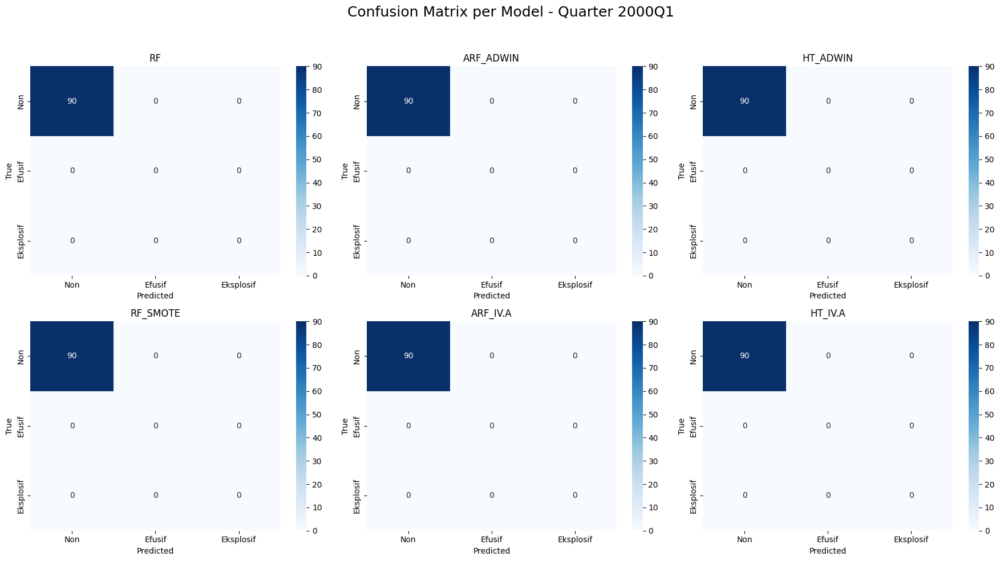

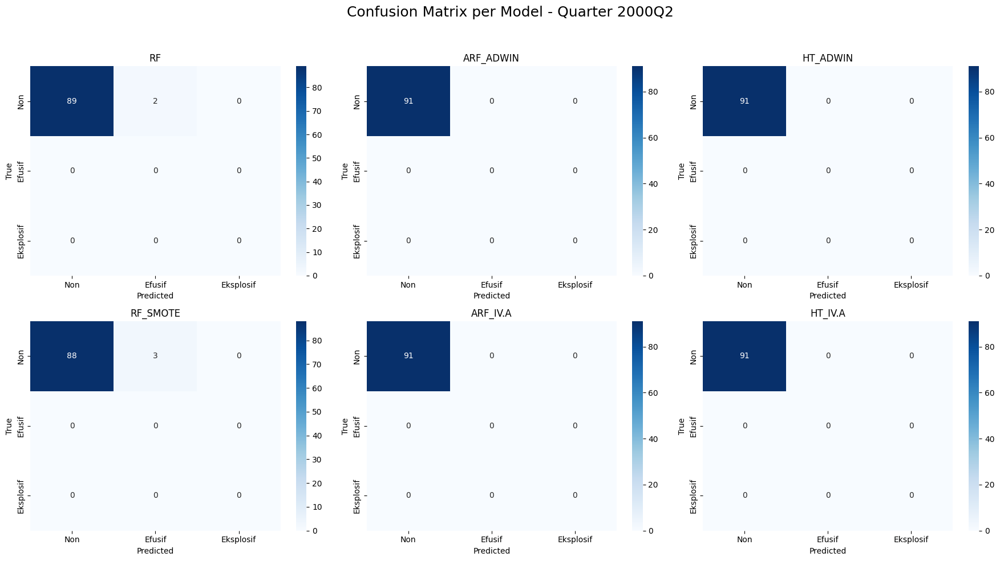

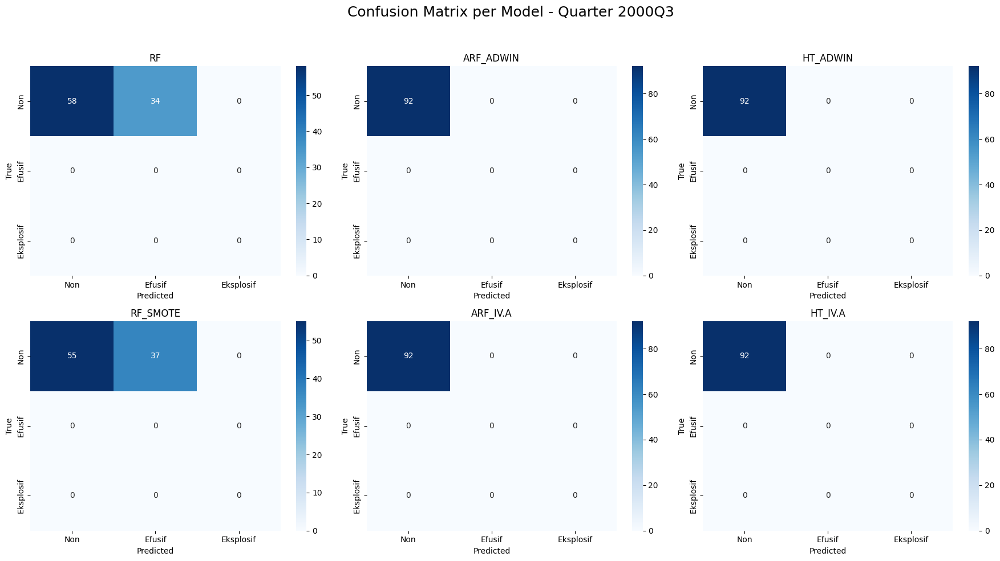

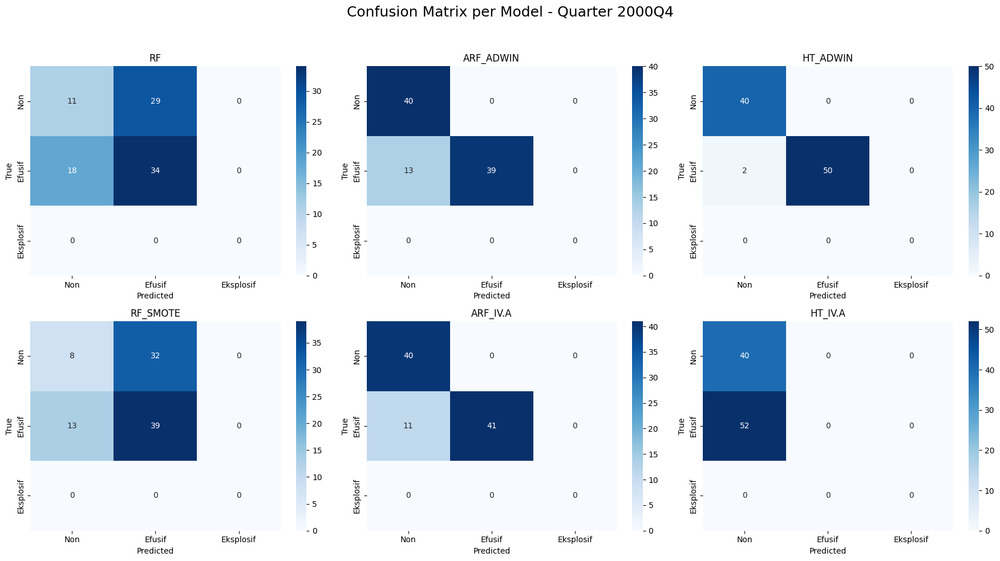

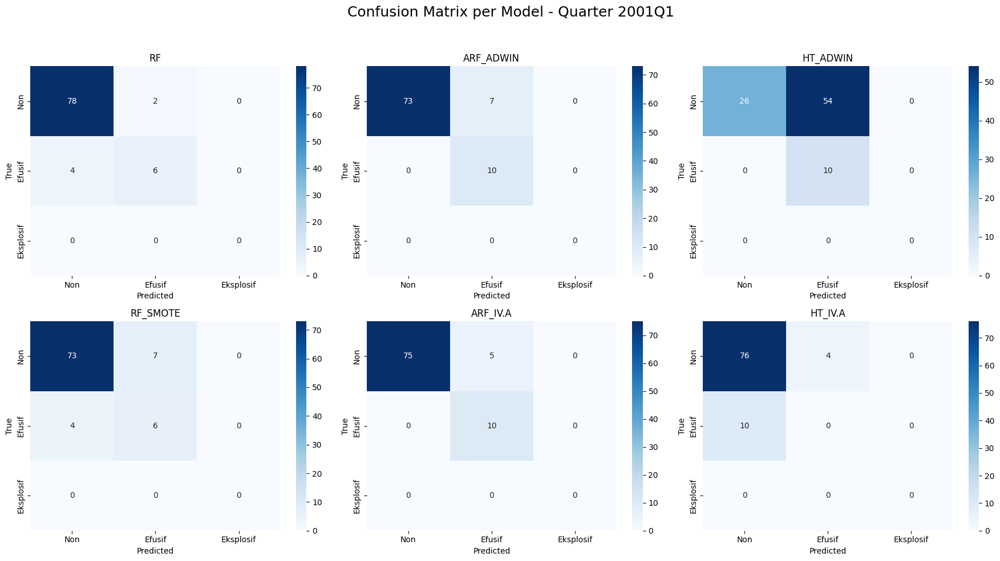

...

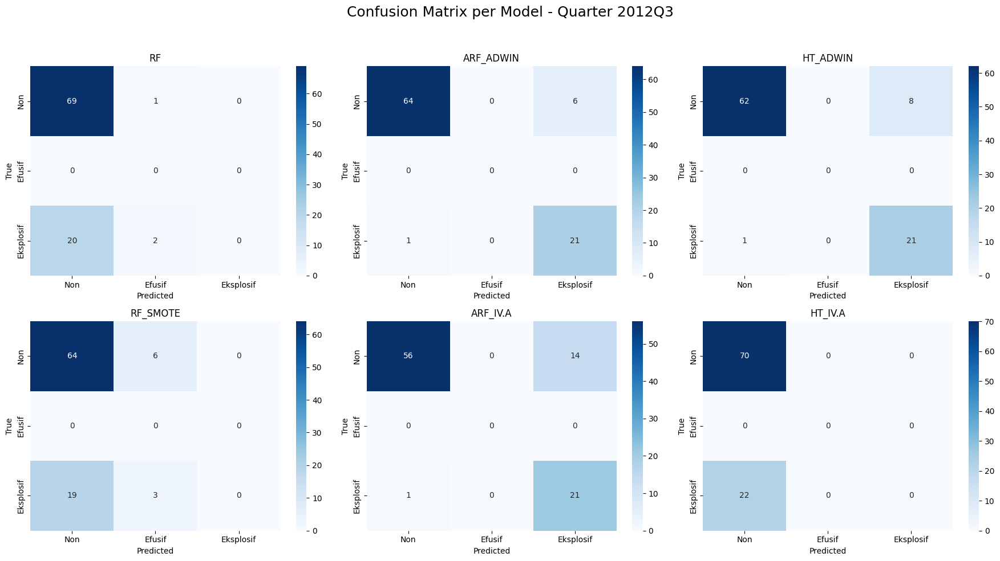

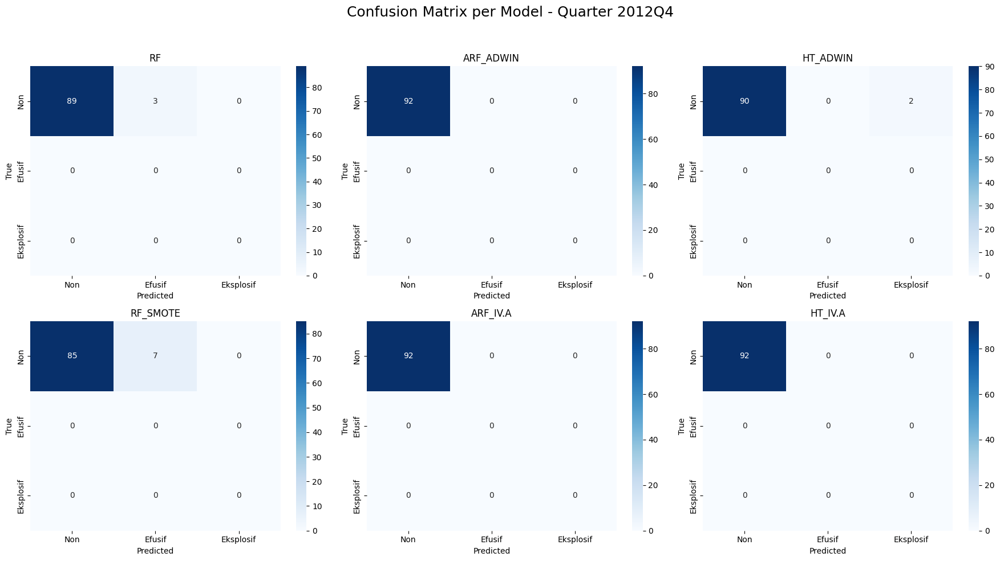

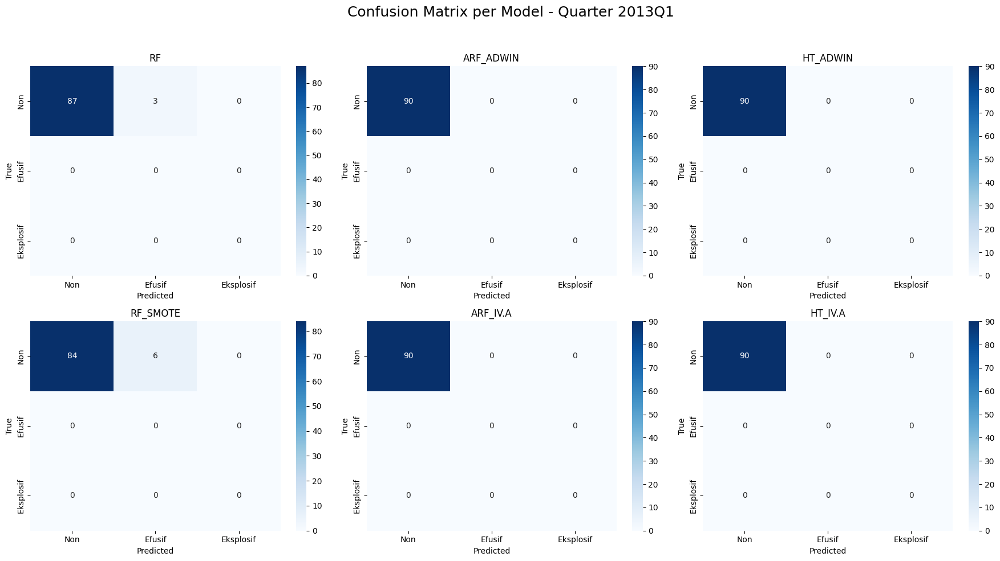

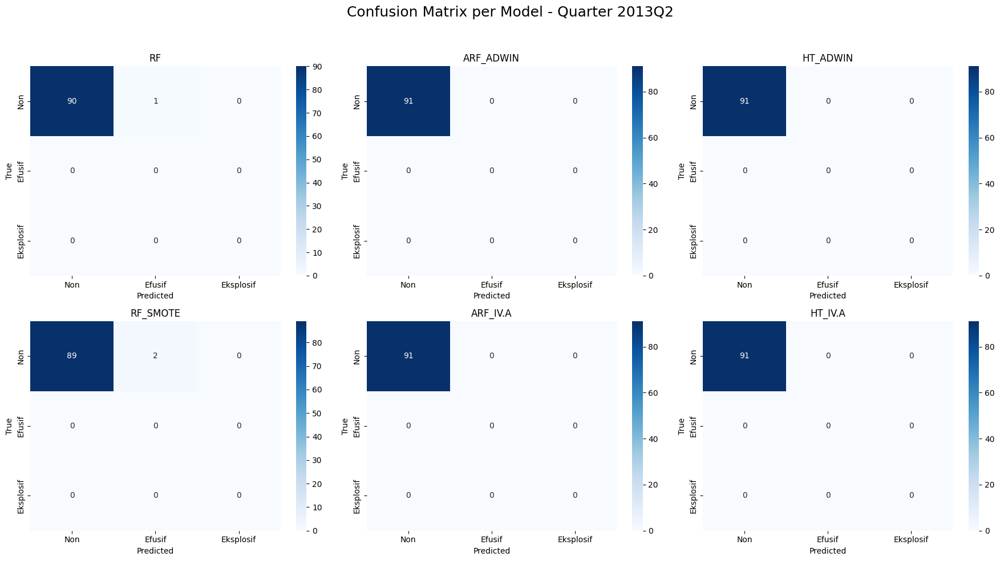

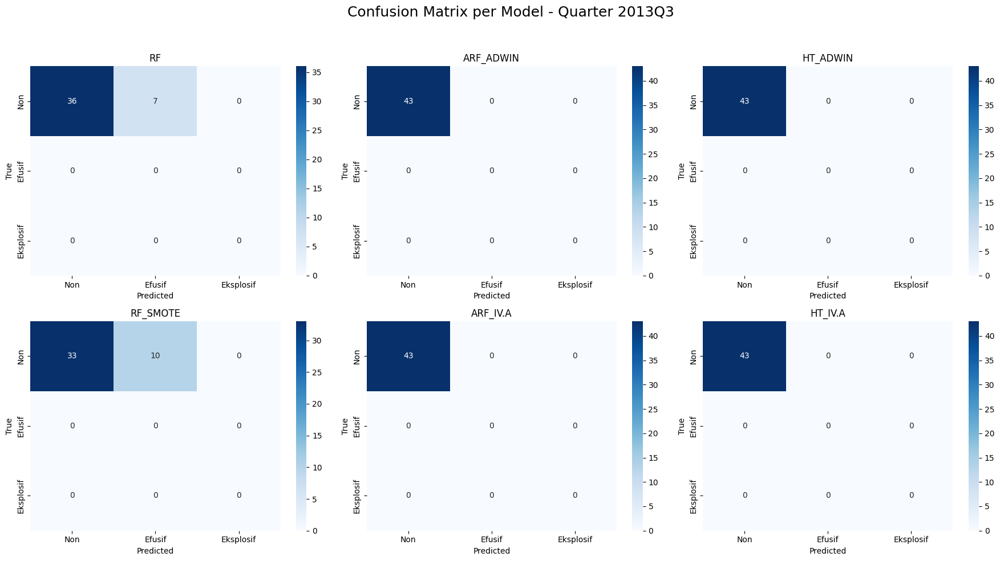

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Siapkan dataframe evaluasi
eval_df = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_IV.A': arf_sel_pred,
    'HT_ADWIN': ht_adwin_pred,
    'HT_IV.A': ht_sel_pred
})

# Tambahkan kolom periodik triwulan
eval_df['Period'] = eval_df['Date'].dt.to_period('Q')

# Ambil semua period unik setelah tahun 2000
periods = sorted(eval_df[eval_df['Date'].dt.year >= 2000]['Period'].unique())

# Atur layout model vertikal: atas & bawah per pasangan
models = [
    ['RF', 'RF_SMOTE'],
    ['ARF_ADWIN', 'ARF_IV.A'],
    ['HT_ADWIN', 'HT_IV.A']
]
labels = ['Non', 'Efusif', 'Eksplosif']

# Loop tiap periode
for period in periods:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # Grid 2x3
    quarter_data = eval_df[eval_df['Period'] == period]

    for col in range(3):
        for row in range(2):
            model = models[col][row]
            ax = axes[row, col]
            cm = confusion_matrix(quarter_data['True'], quarter_data[model], labels=[0, 1, 2])
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                        xticklabels=labels, yticklabels=labels)
            ax.set_title(model)
            ax.set_xlabel('Predicted')
            ax.set_ylabel('True')

    plt.suptitle(f'Confusion Matrix per Model - Quarter {period}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


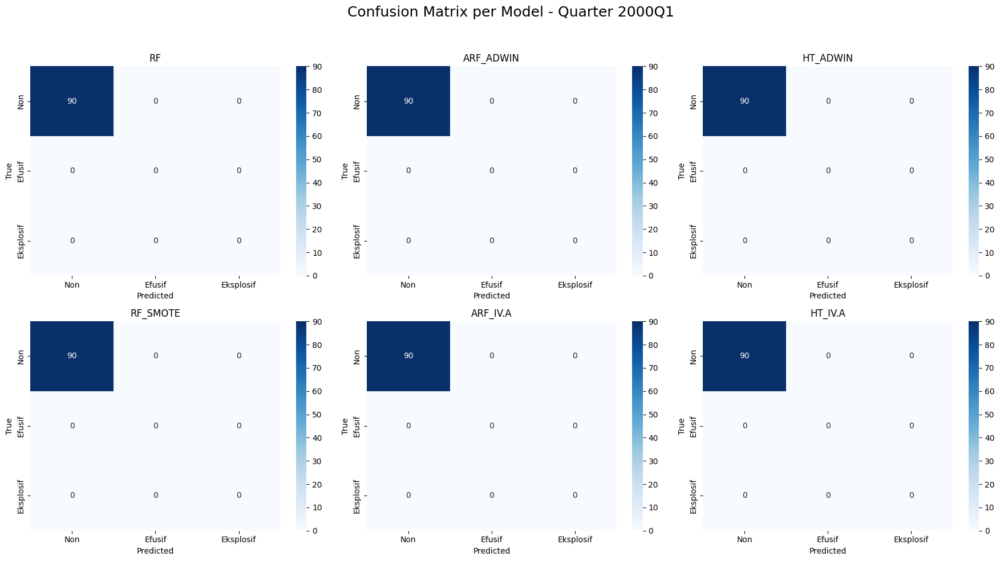

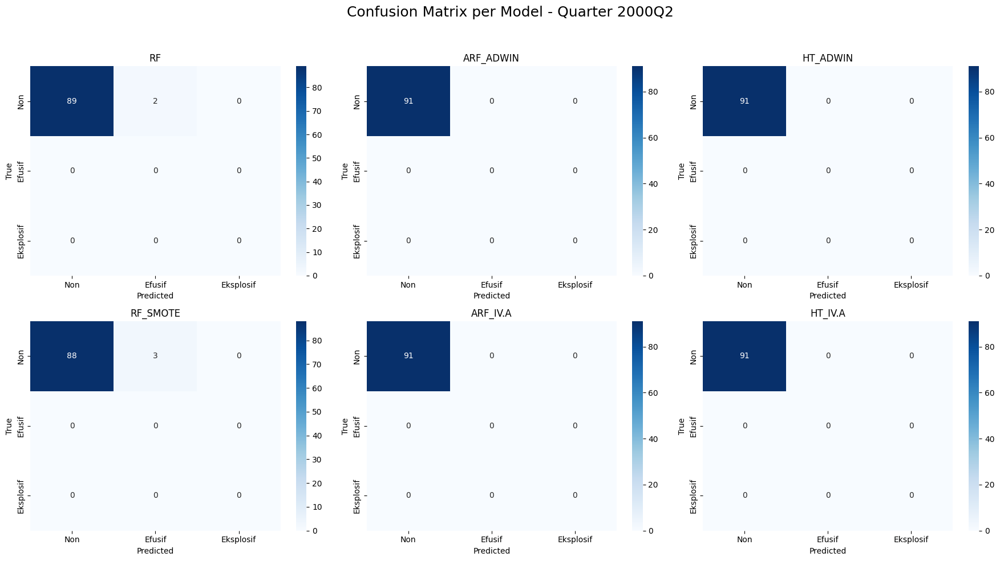

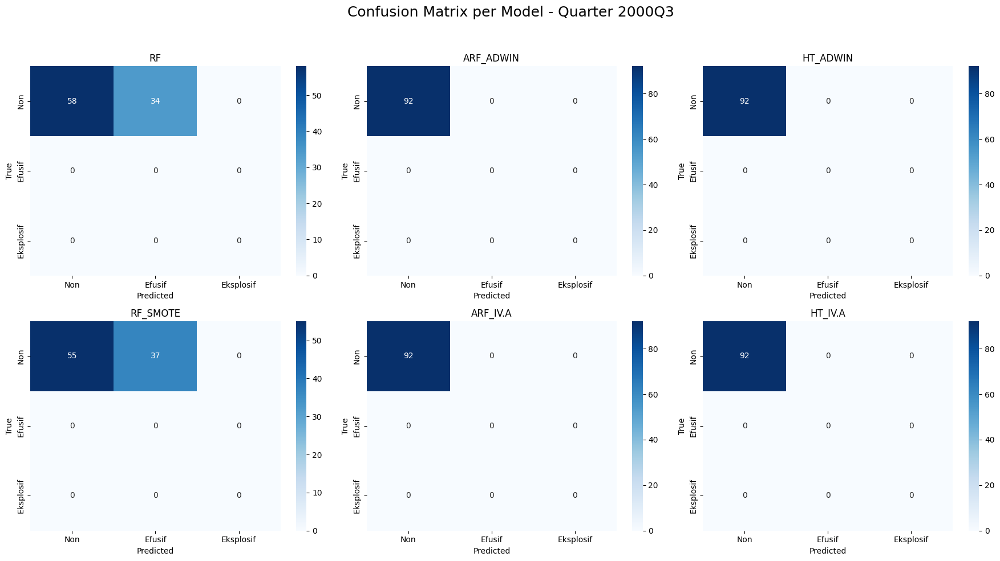

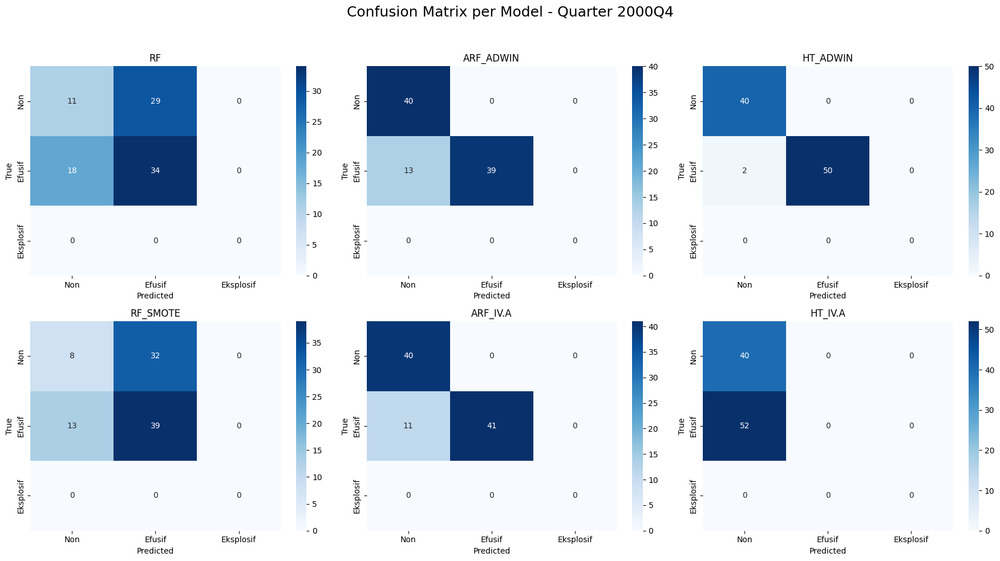

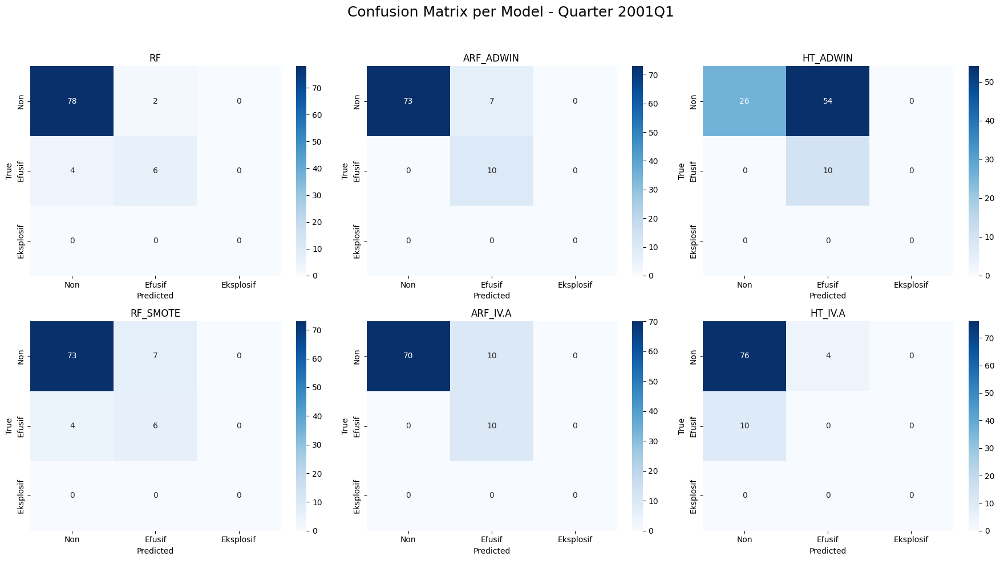

...

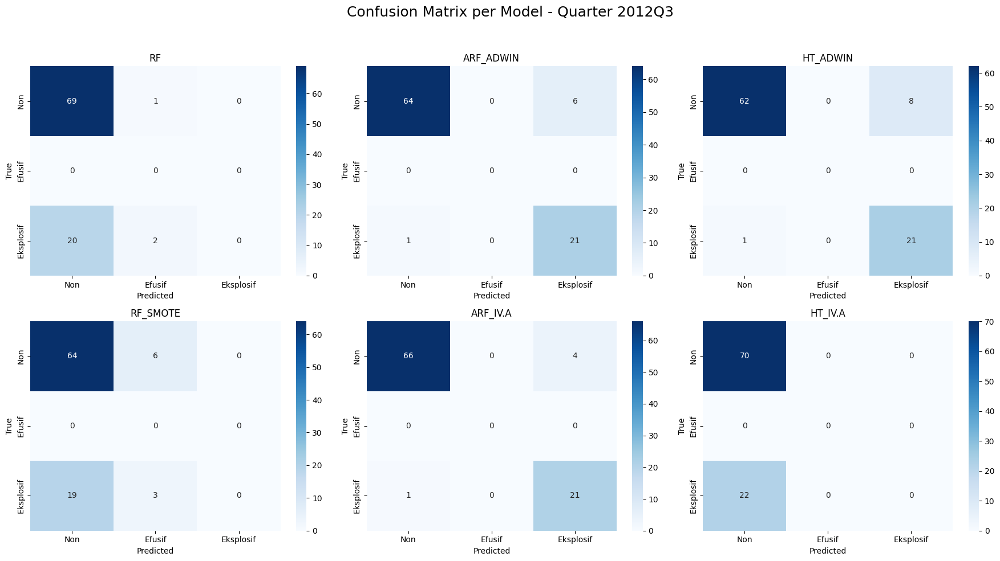

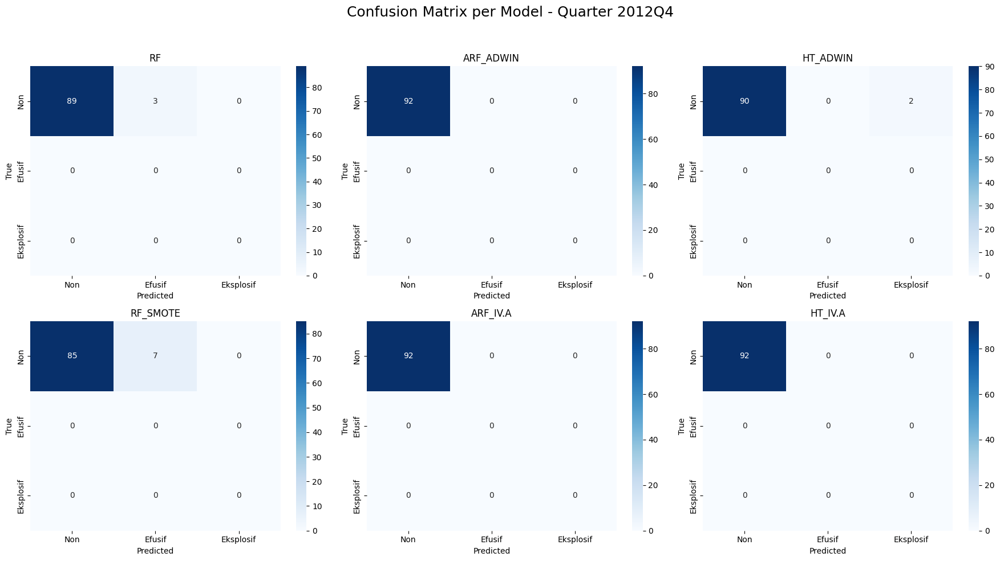

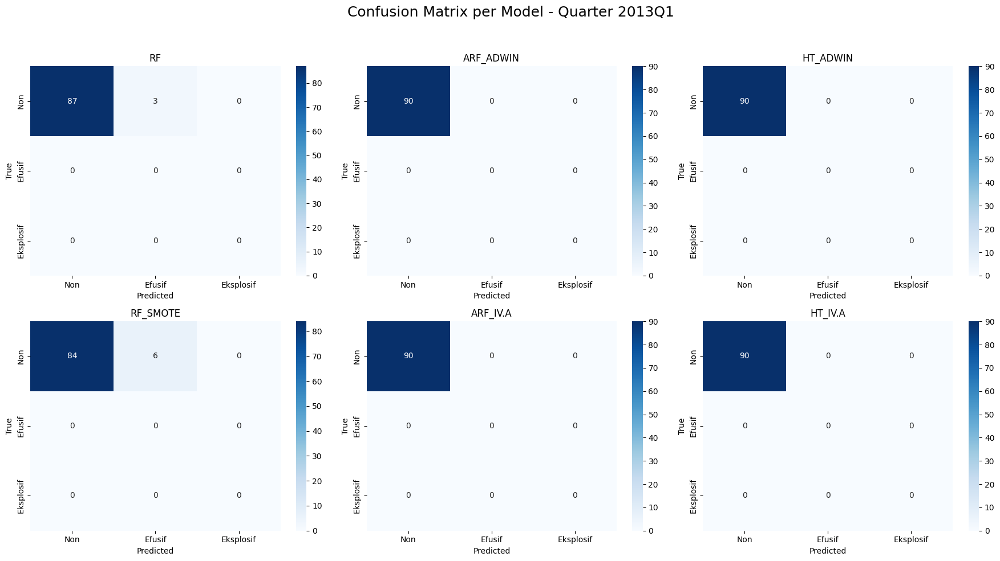

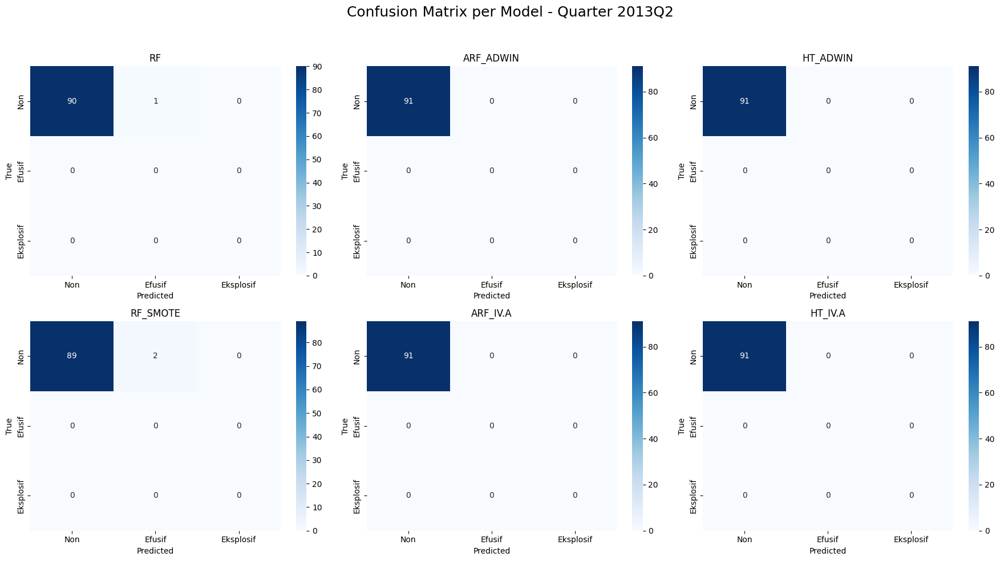

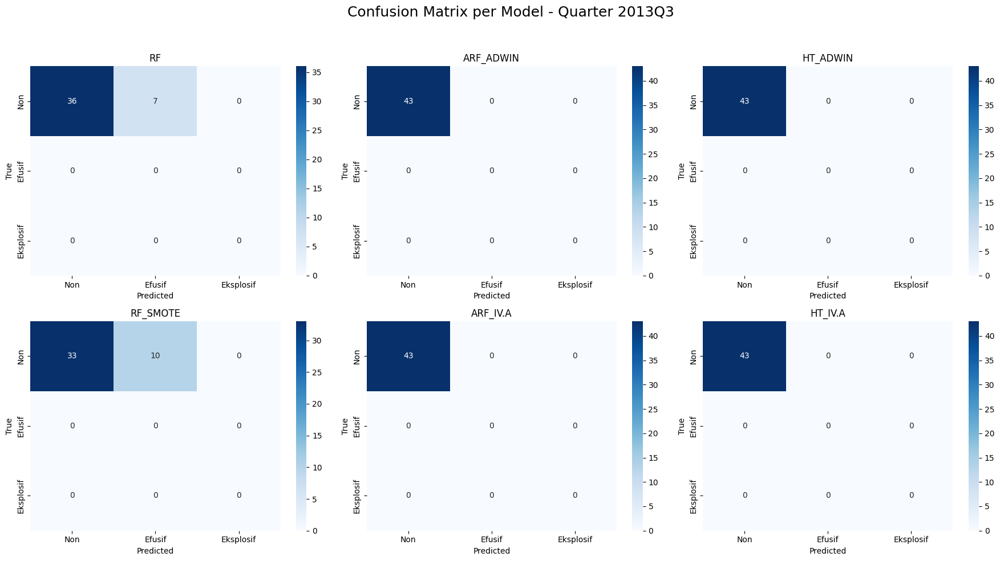

Plots saved to: 0.6 confusion_matrices_quarterly/
F1 scores saved to: 0.6 quarterly_f1_scores.csv

F1 Scores Summary:
     Period      Model  F1_Non  F1_Efusif  F1_Eksplosif  F1_Macro  F1_Weighted
0    2000Q1         RF  1.0000        0.0           0.0    0.3333       1.0000
1    2000Q1   RF_SMOTE  1.0000        0.0           0.0    0.3333       1.0000
2    2000Q1  ARF_ADWIN  1.0000        0.0           0.0    0.3333       1.0000
3    2000Q1   ARF_IV.A  1.0000        0.0           0.0    0.3333       1.0000
4    2000Q1   HT_ADWIN  1.0000        0.0           0.0    0.3333       1.0000
..      ...        ...     ...        ...           ...       ...          ...
325  2013Q3   RF_SMOTE  0.8684        0.0           0.0    0.2895       0.8684
326  2013Q3  ARF_ADWIN  1.0000        0.0           0.0    0.3333       1.0000
327  2013Q3   ARF_IV.A  1.0000        0.0           0.0    0.3333       1.0000
328  2013Q3   HT_ADWIN  1.0000        0.0           0.0    0.3333       1.0000
329  2013Q3  

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import os

# Create output directory
output_dir = '0.6 confusion_matrices_quarterly'
os.makedirs(output_dir, exist_ok=True)

# Siapkan dataframe evaluasi
eval_df = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_IV.A': arf_sel_pred,
    'HT_ADWIN': ht_adwin_pred,
    'HT_IV.A': ht_sel_pred
})

# Tambahkan kolom periodik triwulan
eval_df['Period'] = eval_df['Date'].dt.to_period('Q')

# Ambil semua period unik setelah tahun 2000
periods = sorted(eval_df[eval_df['Date'].dt.year >= 2000]['Period'].unique())

# Atur layout model vertikal: atas & bawah per pasangan
models = [
    ['RF', 'RF_SMOTE'],
    ['ARF_ADWIN', 'ARF_IV.A'],
    ['HT_ADWIN', 'HT_IV.A']
]
labels = ['Non', 'Efusif', 'Eksplosif']

# Store F1 scores
f1_results = []

# Loop tiap periode
for period in periods:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # Grid 2x3
    quarter_data = eval_df[eval_df['Period'] == period]

    for col in range(3):
        for row in range(2):
            model = models[col][row]
            ax = axes[row, col]
            cm = confusion_matrix(quarter_data['True'], quarter_data[model], labels=[0, 1, 2])
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                        xticklabels=labels, yticklabels=labels)
            ax.set_title(model)
            ax.set_xlabel('Predicted')
            ax.set_ylabel('True')
            
            # Calculate F1-scores
            report = classification_report(
                quarter_data['True'], 
                quarter_data[model], 
                labels=[0, 1, 2], 
                output_dict=True, 
                zero_division=0
            )
            
            # Store F1 scores for this model and period
            f1_entry = {
                'Period': str(period),
                'Model': model,
                'F1_Non': report['0']['f1-score'] if '0' in report else 0.0,
                'F1_Efusif': report['1']['f1-score'] if '1' in report else 0.0,
                'F1_Eksplosif': report['2']['f1-score'] if '2' in report else 0.0,
                'F1_Macro': report['macro avg']['f1-score'],
                'F1_Weighted': report['weighted avg']['f1-score']
            }
            f1_results.append(f1_entry)

    plt.suptitle(f'Confusion Matrix per Model - Quarter {period}', fontsize=18)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Save the plot
    plt.savefig(f'{output_dir}/confusion_matrix_{period}.png', dpi=300, bbox_inches='tight')
    plt.show()

# Save F1 scores to CSV
import pandas as pd
f1_df = pd.DataFrame(f1_results)
f1_df.to_csv('0.6 quarterly_f1_scores.csv', index=False)

print(f"Plots saved to: {output_dir}/")
print("F1 scores saved to: 0.6 quarterly_f1_scores.csv")
print("\nF1 Scores Summary:")
print(f1_df.round(4))

In [5]:
import pandas as pd
f1_df = pd.DataFrame(f1_results)
f1_df.to_csv('quarterly_f1_scores.csv', index=False)


🔬 Testing Confidence Threshold Impact on ARF IV.A and HT IV.A


Testing thresholds:   0%|          | 0/7 [00:00<?, ?it/s]


📊 Testing confidence threshold: 0.30


Testing thresholds:  14%|█▍        | 1/7 [00:11<01:07, 11.29s/it]

ARF IV.A - F1: 0.9758, Synthetic: 9
HT IV.A  - F1: 0.8986, Synthetic: 47

📊 Testing confidence threshold: 0.40


Testing thresholds:  29%|██▊       | 2/7 [00:22<00:56, 11.31s/it]

ARF IV.A - F1: 0.9769, Synthetic: 12
HT IV.A  - F1: 0.9091, Synthetic: 42

📊 Testing confidence threshold: 0.50


Testing thresholds:  43%|████▎     | 3/7 [00:33<00:45, 11.32s/it]

ARF IV.A - F1: 0.9755, Synthetic: 17
HT IV.A  - F1: 0.9095, Synthetic: 42

📊 Testing confidence threshold: 0.60


Testing thresholds:  57%|█████▋    | 4/7 [00:45<00:34, 11.35s/it]

ARF IV.A - F1: 0.9724, Synthetic: 26
HT IV.A  - F1: 0.9092, Synthetic: 44

📊 Testing confidence threshold: 0.70


Testing thresholds:  71%|███████▏  | 5/7 [00:56<00:22, 11.41s/it]

ARF IV.A - F1: 0.9740, Synthetic: 34
HT IV.A  - F1: 0.9091, Synthetic: 50

📊 Testing confidence threshold: 0.80


Testing thresholds:  86%|████████▌ | 6/7 [01:08<00:11, 11.53s/it]

ARF IV.A - F1: 0.9770, Synthetic: 60
HT IV.A  - F1: 0.9097, Synthetic: 79

📊 Testing confidence threshold: 0.90


Testing thresholds: 100%|██████████| 7/7 [01:20<00:00, 11.55s/it]

ARF IV.A - F1: 0.9721, Synthetic: 104
HT IV.A  - F1: 0.9095, Synthetic: 212


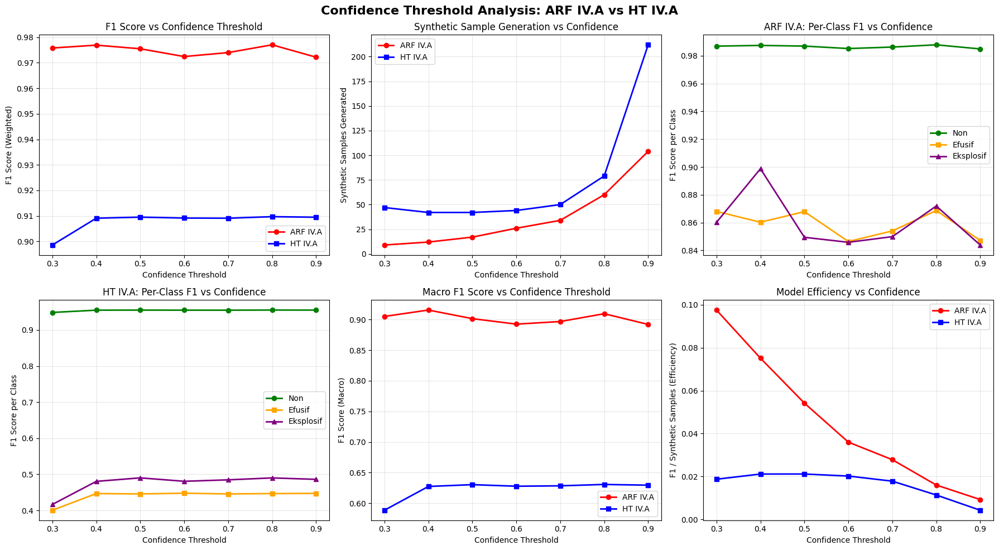


📊 CONFIDENCE THRESHOLD ANALYSIS SUMMARY

🎯 OPTIMAL SETTINGS:
ARF IV.A - Threshold: 0.80, F1: 0.9770, Synthetic: 60
HT IV.A  - Threshold: 0.80, F1: 0.9097, Synthetic: 79

📈 DETAILED COMPARISON TABLE:
                     F1_Macro         F1_Weighted         Synthetic_Samples  \
Model                ARF_IV.A HT_IV.A    ARF_IV.A HT_IV.A          ARF_IV.A   
Confidence_Threshold                                                          
0.3                    0.9051  0.5885      0.9758  0.8986                 9   
0.4                    0.9155  0.6273      0.9769  0.9091                12   
0.5                    0.9014  0.6303      0.9755  0.9095                17   
0.6                    0.8925  0.6277      0.9724  0.9092                26   
0.7                    0.8967  0.6284      0.9740  0.9091                34   
0.8                    0.9095  0.6306      0.9770  0.9097                60   
0.9                    0.8920  0.6294      0.9721  0.9095               104   

         

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, classification_report
from collections import deque, Counter
import random
from tqdm import tqdm
import pandas as pd

# Test different confidence thresholds
confidence_thresholds = np.arange(0.3, 1.0, 0.1)  # From 0.3 to 0.90
arf_results = []
ht_results = []

print("🔬 Testing Confidence Threshold Impact on ARF IV.A and HT IV.A")
print("=" * 60)

for conf_threshold in tqdm(confidence_thresholds, desc="Testing thresholds"):
    print(f"\n📊 Testing confidence threshold: {conf_threshold:.2f}")
    
    # === ARF IV.A with different confidence threshold ===
    arf_test = forest.ARFClassifier(n_models=10, drift_detector=drift.ADWIN(), seed=42)
    adwin_test = drift.ADWIN()
    arf_pred_test = []
    minority_buffer_test = deque(maxlen=30)
    y_window_test = deque(maxlen=100)
    synthetic_count_arf = 0
    
    # === HT IV.A with different confidence threshold ===
    ht_test = tree.HoeffdingTreeClassifier()
    adwin_ht_test = drift.ADWIN()
    ht_pred_test = []
    minority_buffer_ht_test = deque(maxlen=30)
    y_window_ht_test = deque(maxlen=100)
    synthetic_count_ht = 0
    
    # Streaming evaluation
    for i, (x, y) in enumerate(stream.iter_pandas(X_stream, y_stream)):
        
        # === ARF IV.A Testing ===
        y_pred_arf = arf_test.predict_one(x)
        y_pred_arf = int(y_pred_arf) if y_pred_arf is not None else 0
        arf_pred_test.append(y_pred_arf)
        
        y_window_test.append(y)
        if len(y_window_test) < y_window_test.maxlen:
            arf_test.learn_one(x, y)
        else:
            minority_class = min(Counter(y_window_test), key=Counter(y_window_test).get)
            arf_test.learn_one(x, y)
            
            # Use different confidence threshold here
            proba = arf_test.predict_proba_one(x)
            conf = proba.get(y, 0)
            
            if y == minority_class and conf < conf_threshold and i % 10 == 0:
                minority_buffer_test.append(x)
                if len(minority_buffer_test) >= 2:
                    x1, x2 = closest_pair(minority_buffer_test)
                    synthetic_sample = {k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01) for k in x1}
                    arf_test.learn_one(synthetic_sample, y)
                    synthetic_count_arf += 1
                    
            if adwin_test.update(int(y_pred_arf != y)) and adwin_test.drift_detected:
                for s in random.sample(list(minority_buffer_test), min(5, len(minority_buffer_test))):
                    arf_test.learn_one(s, minority_class)
        
        # === HT IV.A Testing ===
        y_pred_ht = ht_test.predict_one(x)
        y_pred_ht = int(y_pred_ht) if y_pred_ht is not None else 0
        ht_pred_test.append(y_pred_ht)
        
        y_window_ht_test.append(y)
        if len(y_window_ht_test) < y_window_ht_test.maxlen:
            ht_test.learn_one(x, y)
        else:
            minority_class_ht = min(Counter(y_window_ht_test), key=Counter(y_window_ht_test).get)
            ht_test.learn_one(x, y)
            
            # Use different confidence threshold here
            proba_ht = ht_test.predict_proba_one(x)
            conf_ht = proba_ht.get(y, 0)
            
            if y == minority_class_ht and conf_ht < conf_threshold and i % 10 == 0:
                minority_buffer_ht_test.append(x)
                if len(minority_buffer_ht_test) >= 2:
                    x1, x2 = closest_pair(minority_buffer_ht_test)
                    synthetic_sample_ht = {k: (x1[k] + x2[k]) / 2 + random.gauss(0, 0.01) for k in x1}
                    ht_test.learn_one(synthetic_sample_ht, y)
                    synthetic_count_ht += 1
                    
            if adwin_ht_test.update(int(y_pred_ht != y)) and adwin_ht_test.drift_detected:
                for s in random.sample(list(minority_buffer_ht_test), min(5, len(minority_buffer_ht_test))):
                    ht_test.learn_one(s, minority_class_ht)
    
    # Calculate metrics for ARF IV.A
    arf_f1_weighted = f1_score(all_true, arf_pred_test, average='weighted', zero_division=0)
    arf_report = classification_report(all_true, arf_pred_test, labels=[0, 1, 2], output_dict=True, zero_division=0)
    
    arf_results.append({
        'Confidence_Threshold': conf_threshold,
        'F1_Weighted': arf_f1_weighted,
        'F1_Non': arf_report['0']['f1-score'],
        'F1_Efusif': arf_report['1']['f1-score'],
        'F1_Eksplosif': arf_report['2']['f1-score'],
        'F1_Macro': arf_report['macro avg']['f1-score'],
        'Synthetic_Samples': synthetic_count_arf,
        'Model': 'ARF_IV.A'
    })
    
    # Calculate metrics for HT IV.A
    ht_f1_weighted = f1_score(all_true, ht_pred_test, average='weighted', zero_division=0)
    ht_report = classification_report(all_true, ht_pred_test, labels=[0, 1, 2], output_dict=True, zero_division=0)
    
    ht_results.append({
        'Confidence_Threshold': conf_threshold,
        'F1_Weighted': ht_f1_weighted,
        'F1_Non': ht_report['0']['f1-score'],
        'F1_Efusif': ht_report['1']['f1-score'],
        'F1_Eksplosif': ht_report['2']['f1-score'],
        'F1_Macro': ht_report['macro avg']['f1-score'],
        'Synthetic_Samples': synthetic_count_ht,
        'Model': 'HT_IV.A'
    })
    
    print(f"ARF IV.A - F1: {arf_f1_weighted:.4f}, Synthetic: {synthetic_count_arf}")
    print(f"HT IV.A  - F1: {ht_f1_weighted:.4f}, Synthetic: {synthetic_count_ht}")

# Convert to DataFrames
df_arf = pd.DataFrame(arf_results)
df_ht = pd.DataFrame(ht_results)
df_combined = pd.concat([df_arf, df_ht], ignore_index=True)

# === VISUALIZATION ===
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# 1. F1 Score vs Confidence Threshold
ax1 = axes[0, 0]
ax1.plot(df_arf['Confidence_Threshold'], df_arf['F1_Weighted'], 'r-o', label='ARF IV.A', linewidth=2, markersize=6)
ax1.plot(df_ht['Confidence_Threshold'], df_ht['F1_Weighted'], 'b-s', label='HT IV.A', linewidth=2, markersize=6)
ax1.set_xlabel('Confidence Threshold')
ax1.set_ylabel('F1 Score (Weighted)')
ax1.set_title('F1 Score vs Confidence Threshold')
ax1.grid(True, alpha=0.3)
ax1.legend()

# 2. Synthetic Samples Generated
ax2 = axes[0, 1]
ax2.plot(df_arf['Confidence_Threshold'], df_arf['Synthetic_Samples'], 'r-o', label='ARF IV.A', linewidth=2, markersize=6)
ax2.plot(df_ht['Confidence_Threshold'], df_ht['Synthetic_Samples'], 'b-s', label='HT IV.A', linewidth=2, markersize=6)
ax2.set_xlabel('Confidence Threshold')
ax2.set_ylabel('Synthetic Samples Generated')
ax2.set_title('Synthetic Sample Generation vs Confidence')
ax2.grid(True, alpha=0.3)
ax2.legend()

# 3. Per-Class F1 for ARF IV.A
ax3 = axes[0, 2]
ax3.plot(df_arf['Confidence_Threshold'], df_arf['F1_Non'], 'g-o', label='Non', linewidth=2)
ax3.plot(df_arf['Confidence_Threshold'], df_arf['F1_Efusif'], 'orange', marker='s', label='Efusif', linewidth=2)
ax3.plot(df_arf['Confidence_Threshold'], df_arf['F1_Eksplosif'], 'purple', marker='^', label='Eksplosif', linewidth=2)
ax3.set_xlabel('Confidence Threshold')
ax3.set_ylabel('F1 Score per Class')
ax3.set_title('ARF IV.A: Per-Class F1 vs Confidence')
ax3.grid(True, alpha=0.3)
ax3.legend()

# 4. Per-Class F1 for HT IV.A
ax4 = axes[1, 0]
ax4.plot(df_ht['Confidence_Threshold'], df_ht['F1_Non'], 'g-o', label='Non', linewidth=2)
ax4.plot(df_ht['Confidence_Threshold'], df_ht['F1_Efusif'], 'orange', marker='s', label='Efusif', linewidth=2)
ax4.plot(df_ht['Confidence_Threshold'], df_ht['F1_Eksplosif'], 'purple', marker='^', label='Eksplosif', linewidth=2)
ax4.set_xlabel('Confidence Threshold')
ax4.set_ylabel('F1 Score per Class')
ax4.set_title('HT IV.A: Per-Class F1 vs Confidence')
ax4.grid(True, alpha=0.3)
ax4.legend()

# 5. Comparison of Macro F1
ax5 = axes[1, 1]
ax5.plot(df_arf['Confidence_Threshold'], df_arf['F1_Macro'], 'r-o', label='ARF IV.A', linewidth=2, markersize=6)
ax5.plot(df_ht['Confidence_Threshold'], df_ht['F1_Macro'], 'b-s', label='HT IV.A', linewidth=2, markersize=6)
ax5.set_xlabel('Confidence Threshold')
ax5.set_ylabel('F1 Score (Macro)')
ax5.set_title('Macro F1 Score vs Confidence Threshold')
ax5.grid(True, alpha=0.3)
ax5.legend()

# 6. Efficiency: F1 per Synthetic Sample
ax6 = axes[1, 2]
arf_efficiency = df_arf['F1_Weighted'] / (df_arf['Synthetic_Samples'] + 1)  # +1 to avoid division by zero
ht_efficiency = df_ht['F1_Weighted'] / (df_ht['Synthetic_Samples'] + 1)
ax6.plot(df_arf['Confidence_Threshold'], arf_efficiency, 'r-o', label='ARF IV.A', linewidth=2, markersize=6)
ax6.plot(df_ht['Confidence_Threshold'], ht_efficiency, 'b-s', label='HT IV.A', linewidth=2, markersize=6)
ax6.set_xlabel('Confidence Threshold')
ax6.set_ylabel('F1 / Synthetic Samples (Efficiency)')
ax6.set_title('Model Efficiency vs Confidence')
ax6.grid(True, alpha=0.3)
ax6.legend()

plt.suptitle('Confidence Threshold Analysis: ARF IV.A vs HT IV.A', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# === SUMMARY TABLES ===
print("\n📊 CONFIDENCE THRESHOLD ANALYSIS SUMMARY")
print("=" * 70)

# Find optimal thresholds
arf_optimal_idx = df_arf['F1_Weighted'].idxmax()
ht_optimal_idx = df_ht['F1_Weighted'].idxmax()

arf_optimal = df_arf.iloc[arf_optimal_idx]
ht_optimal = df_ht.iloc[ht_optimal_idx]

print(f"\n🎯 OPTIMAL SETTINGS:")
print(f"ARF IV.A - Threshold: {arf_optimal['Confidence_Threshold']:.2f}, F1: {arf_optimal['F1_Weighted']:.4f}, Synthetic: {arf_optimal['Synthetic_Samples']}")
print(f"HT IV.A  - Threshold: {ht_optimal['Confidence_Threshold']:.2f}, F1: {ht_optimal['F1_Weighted']:.4f}, Synthetic: {ht_optimal['Synthetic_Samples']}")

# Detailed comparison table
print(f"\n📈 DETAILED COMPARISON TABLE:")
comparison_table = df_combined.pivot_table(
    index='Confidence_Threshold', 
    columns='Model', 
    values=['F1_Weighted', 'F1_Macro', 'Synthetic_Samples']
).round(4)

print(comparison_table)

# Save results
df_combined.to_csv('confidence_threshold_analysis.csv', index=False)
print(f"\n💾 Results saved to: confidence_threshold_analysis.csv")

# === STATISTICAL ANALYSIS ===
print(f"\n📊 STATISTICAL INSIGHTS:")
print("-" * 40)

# Best performance ranges
arf_top_5 = df_arf.nlargest(5, 'F1_Weighted')
ht_top_5 = df_ht.nlargest(5, 'F1_Weighted')

print(f"\n🏆 TOP 5 CONFIDENCE THRESHOLDS:")
print("ARF IV.A:")
for _, row in arf_top_5.iterrows():
    print(f"  {row['Confidence_Threshold']:.2f}: F1={row['F1_Weighted']:.4f}, Synthetic={row['Synthetic_Samples']}")

print("HT IV.A:")
for _, row in ht_top_5.iterrows():
    print(f"  {row['Confidence_Threshold']:.2f}: F1={row['F1_Weighted']:.4f}, Synthetic={row['Synthetic_Samples']}")

# Correlation analysis
arf_corr_f1_synth = df_arf['F1_Weighted'].corr(df_arf['Synthetic_Samples'])
ht_corr_f1_synth = df_ht['F1_Weighted'].corr(df_ht['Synthetic_Samples'])

print(f"\n🔗 CORRELATION (F1 vs Synthetic Samples):")
print(f"ARF IV.A: {arf_corr_f1_synth:.4f}")
print(f"HT IV.A:  {ht_corr_f1_synth:.4f}")

print(f"\n✅ Analysis complete! Key findings:")
print(f"   🎯 Optimal ARF IV.A threshold: {arf_optimal['Confidence_Threshold']:.2f}")
print(f"   🎯 Optimal HT IV.A threshold: {ht_optimal['Confidence_Threshold']:.2f}")
print(f"   📈 Best ARF IV.A F1: {arf_optimal['F1_Weighted']:.4f}")
print(f"   📈 Best HT IV.A F1: {ht_optimal['F1_Weighted']:.4f}")

📊 Generating confusion matrices for 55 quarters...
💾 Saving plots to folder: confusion_matrices_quarterly


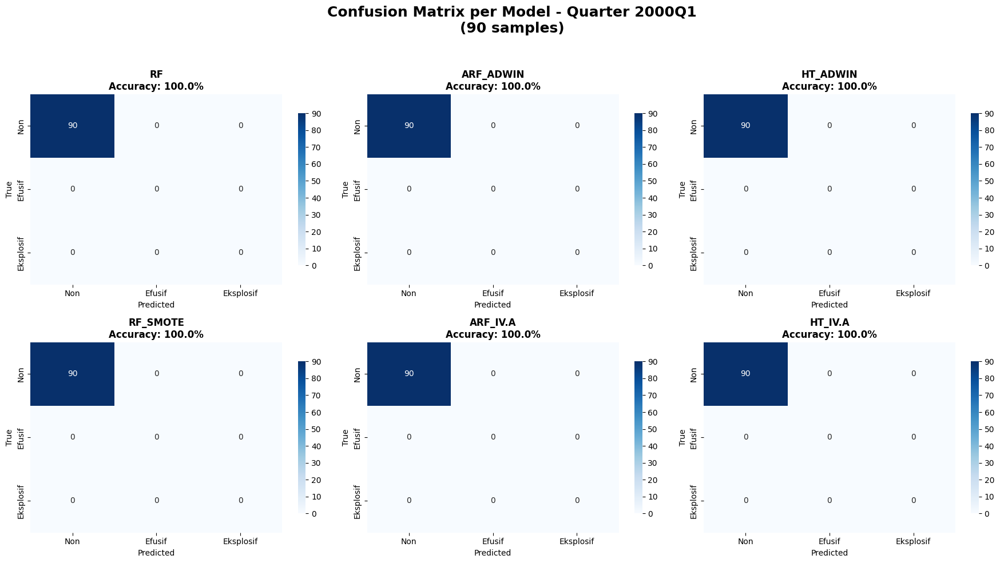

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2000Q1.png


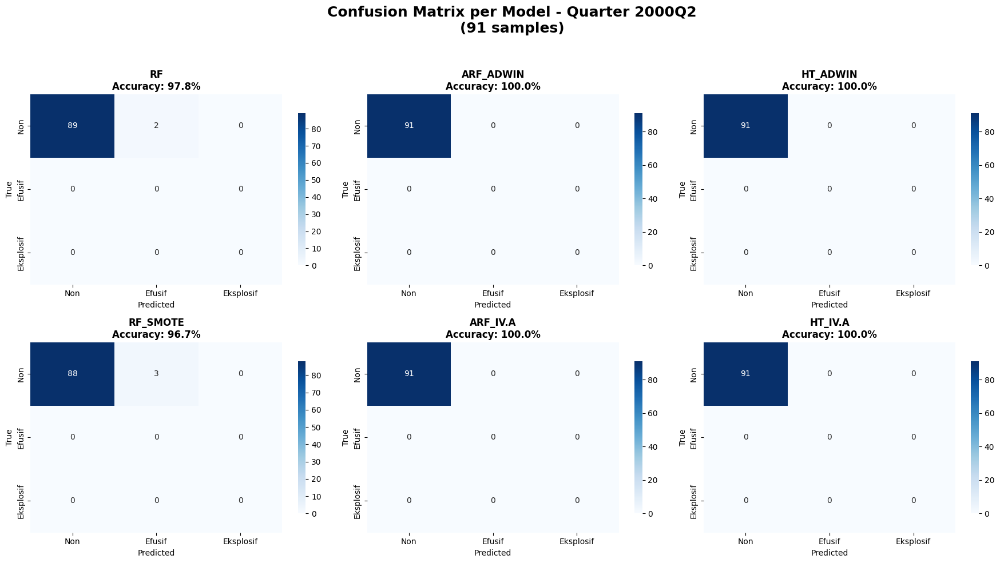

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2000Q2.png


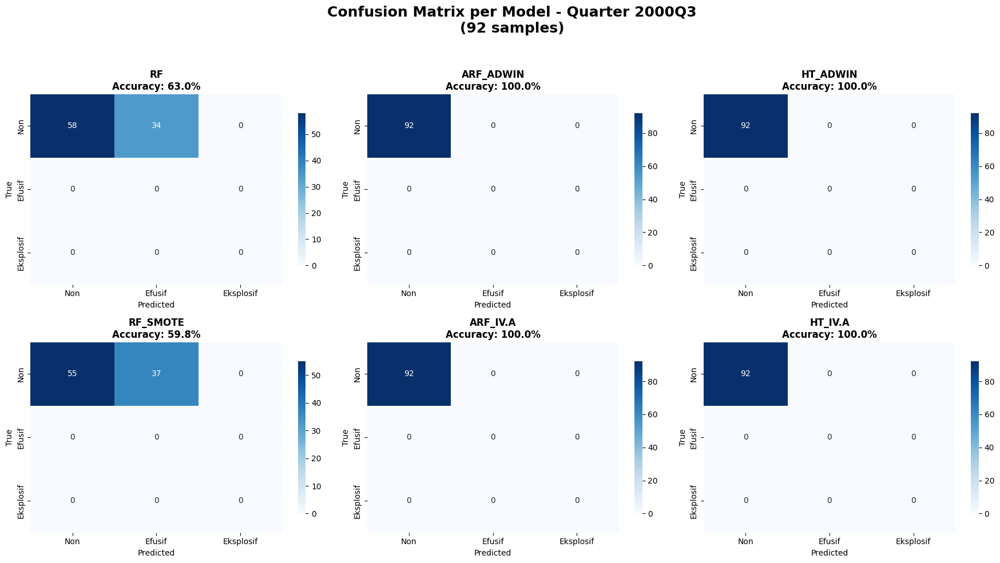

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2000Q3.png


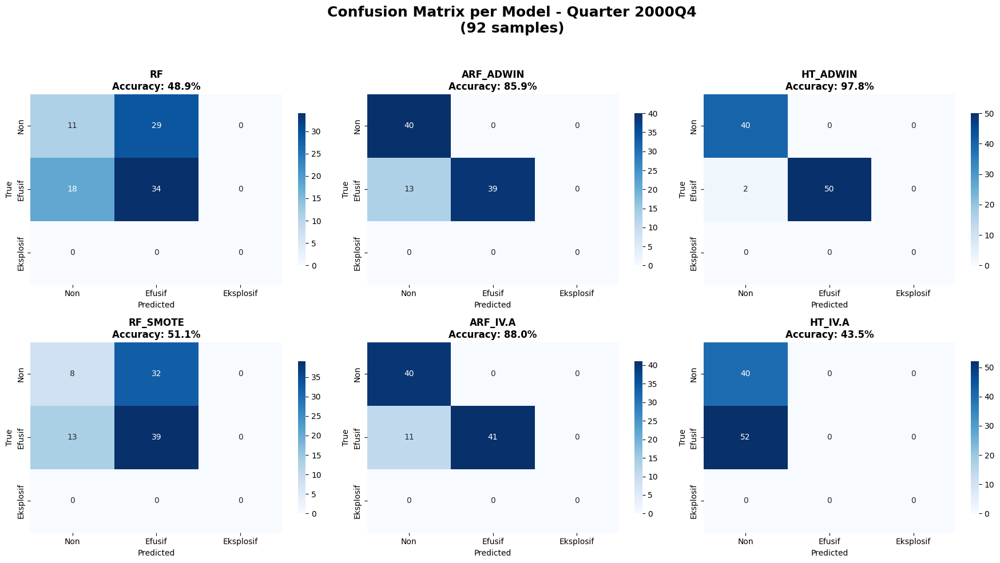

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2000Q4.png


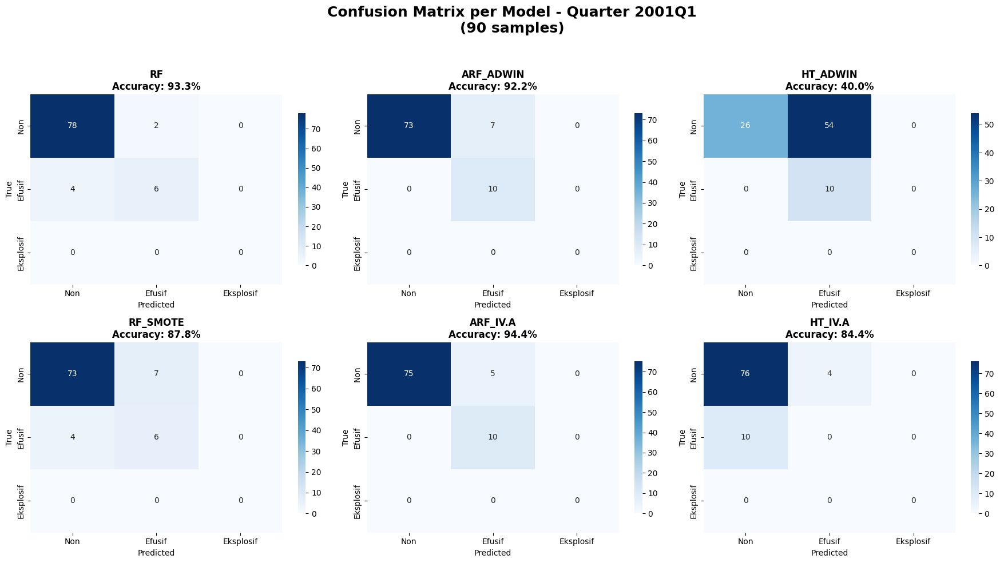

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2001Q1.png


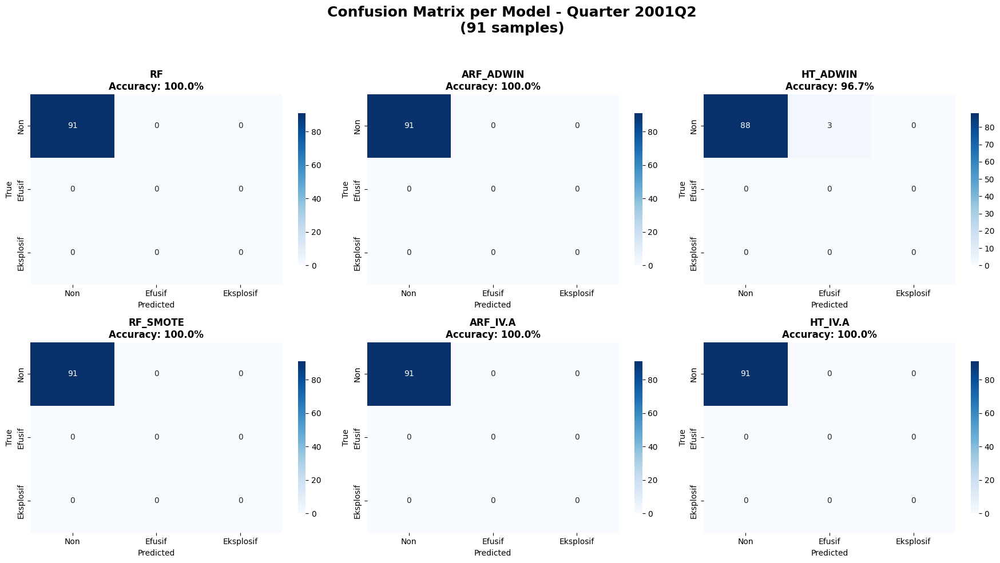

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2001Q2.png


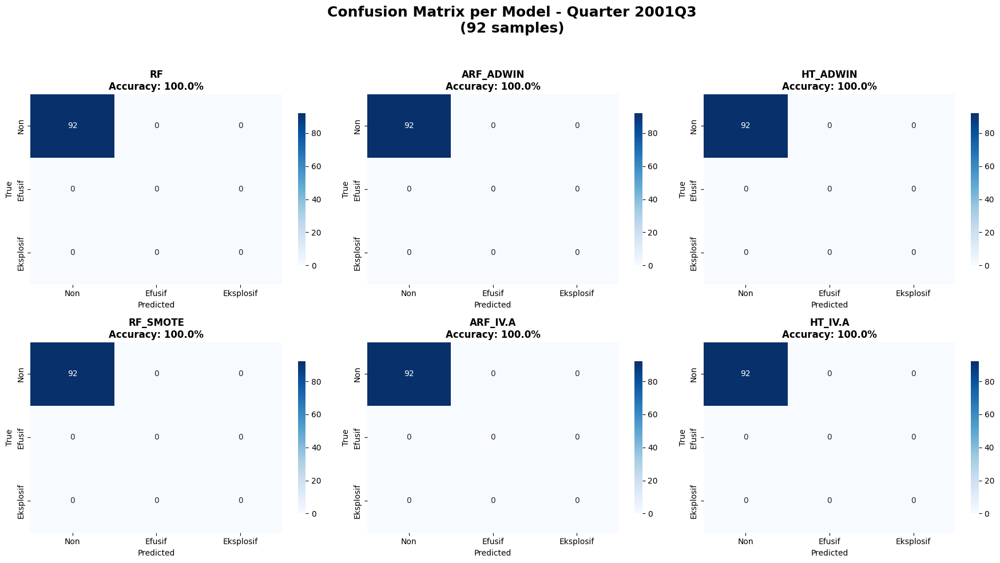

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2001Q3.png


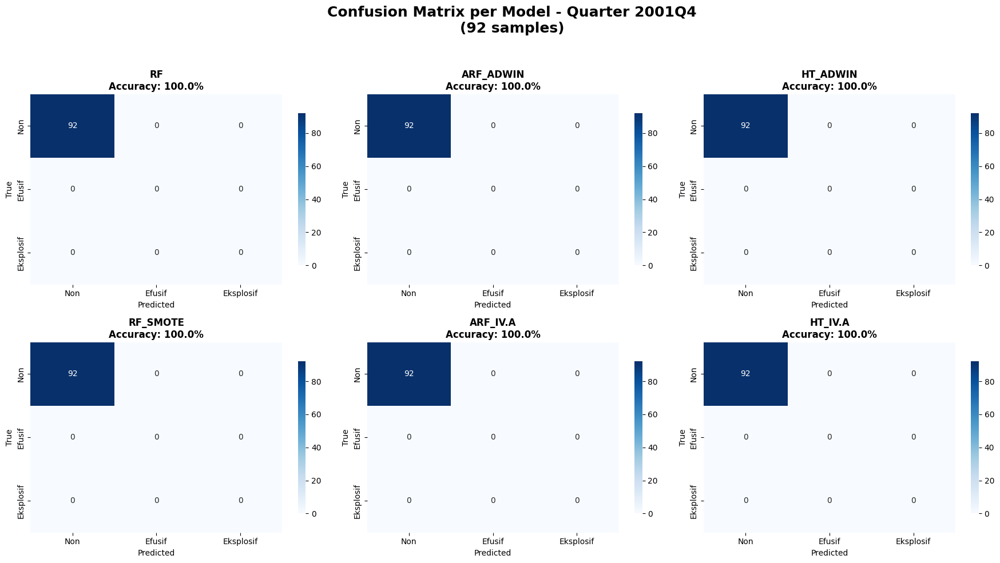

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2001Q4.png


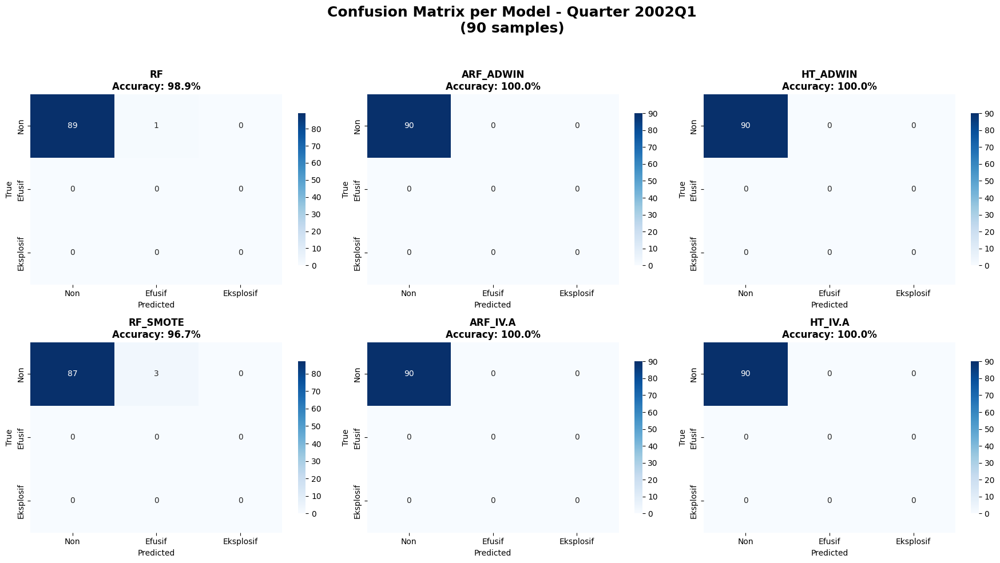

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2002Q1.png


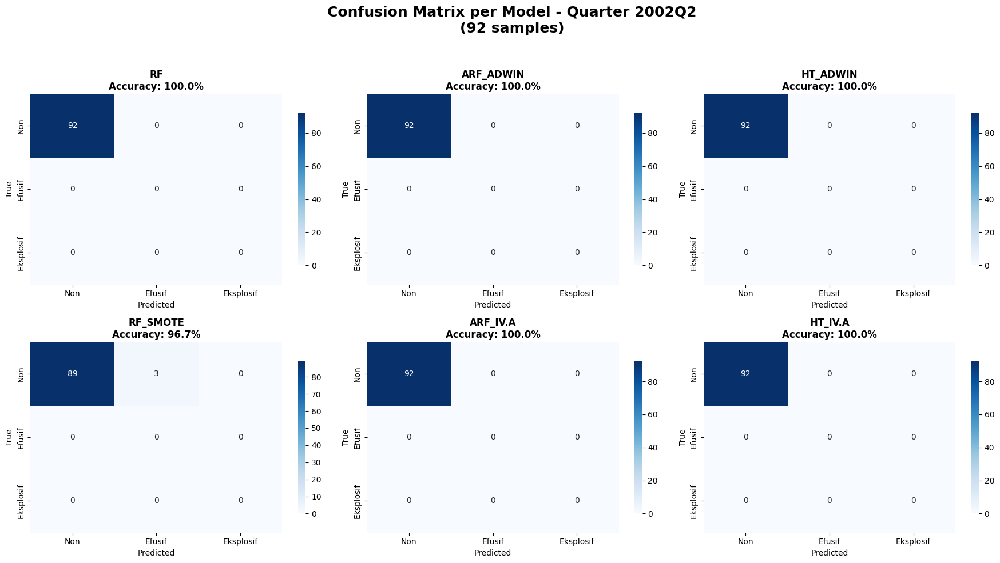

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2002Q2.png


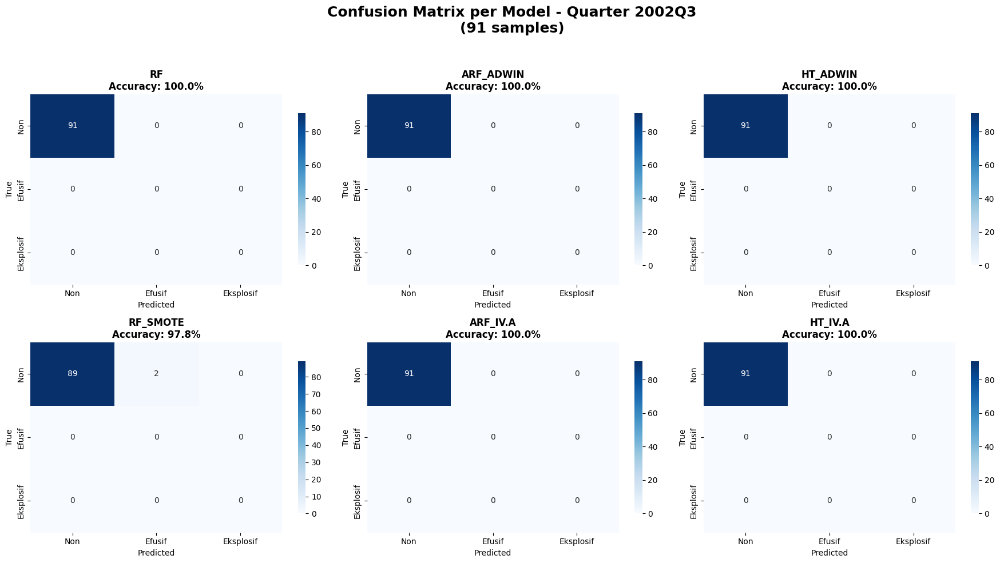

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2002Q3.png


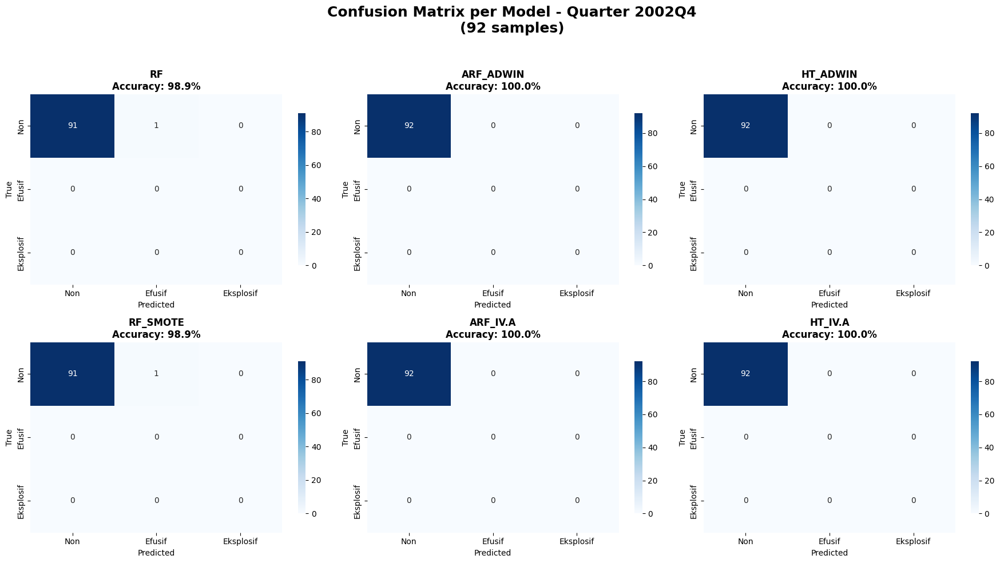

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2002Q4.png


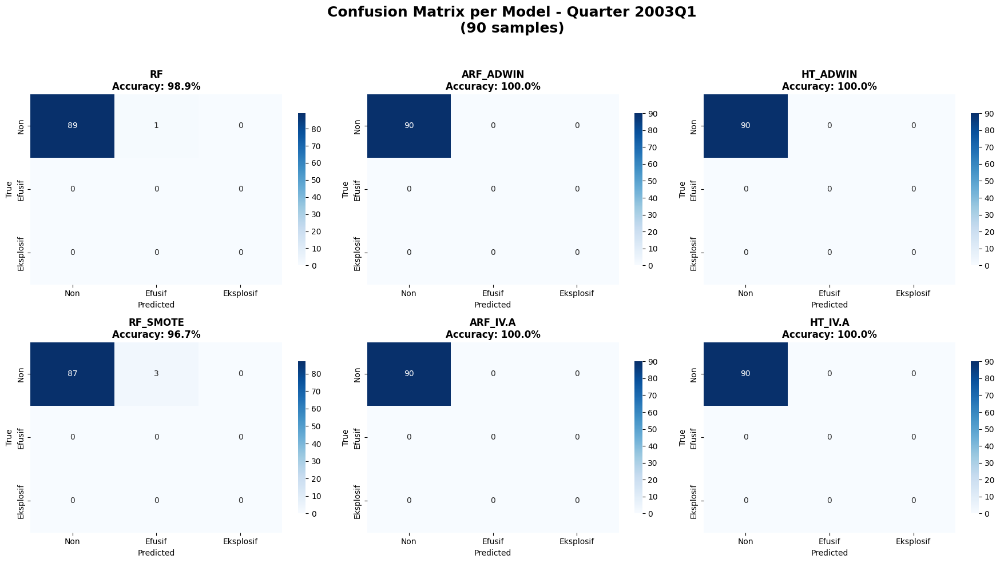

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2003Q1.png


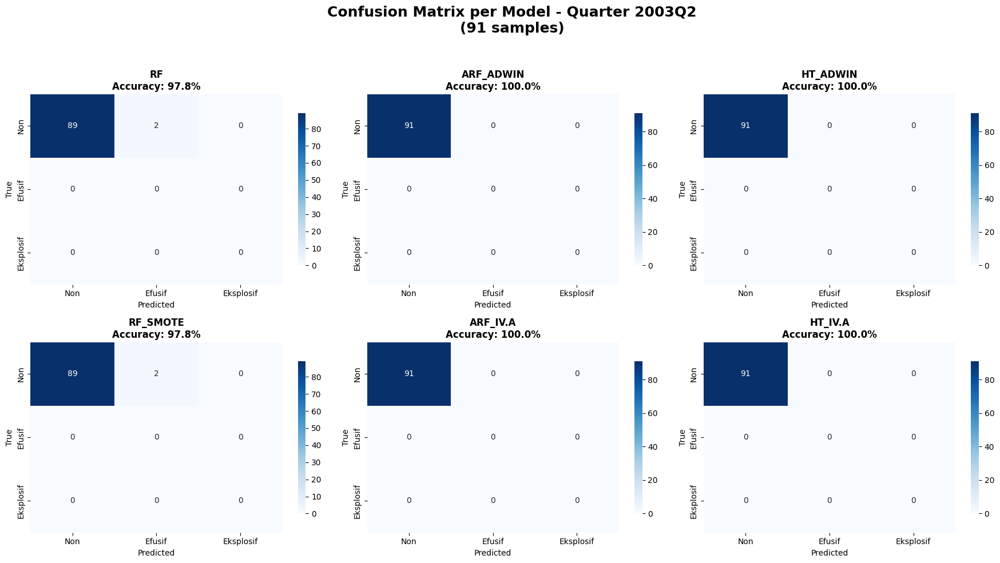

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2003Q2.png


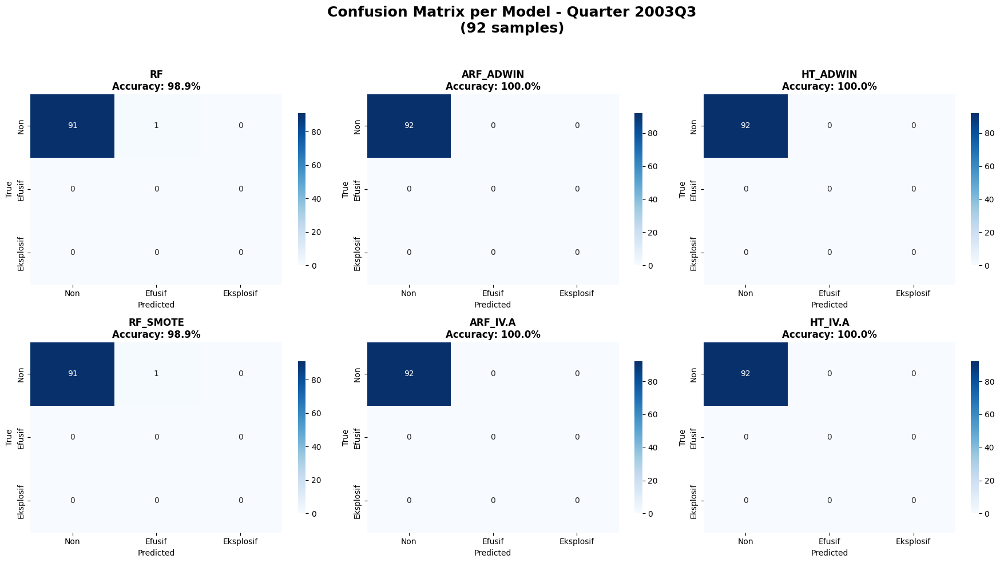

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2003Q3.png


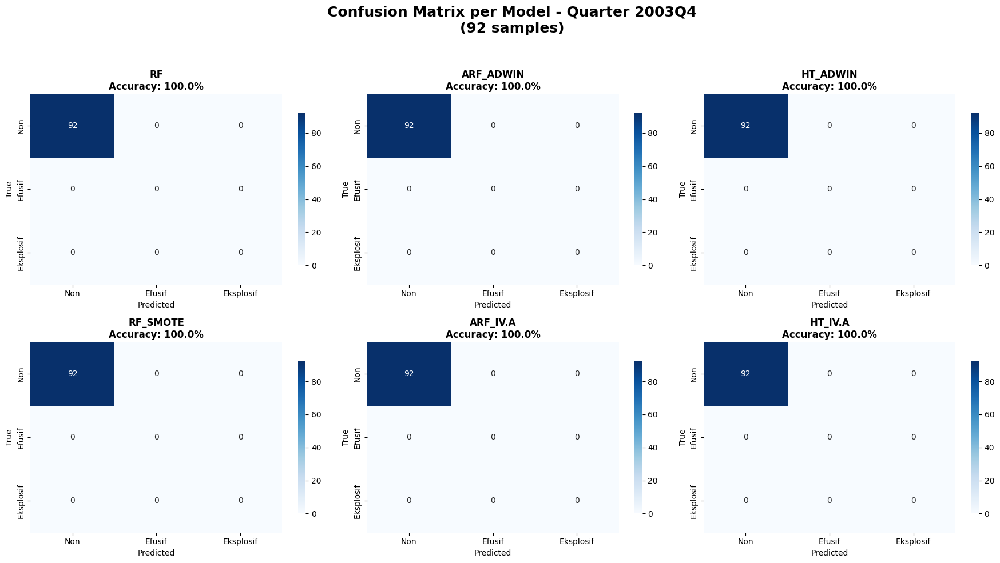

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2003Q4.png


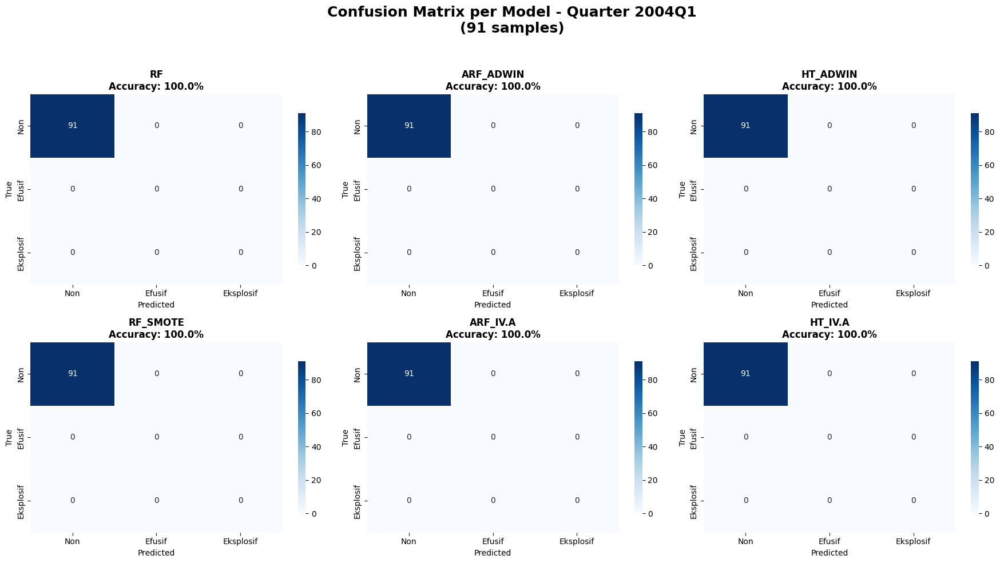

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2004Q1.png


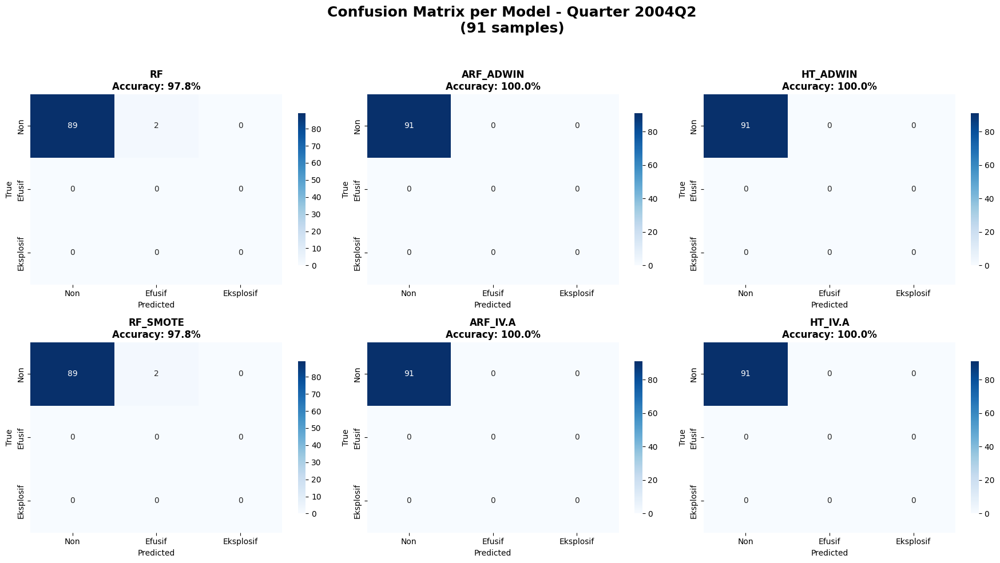

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2004Q2.png


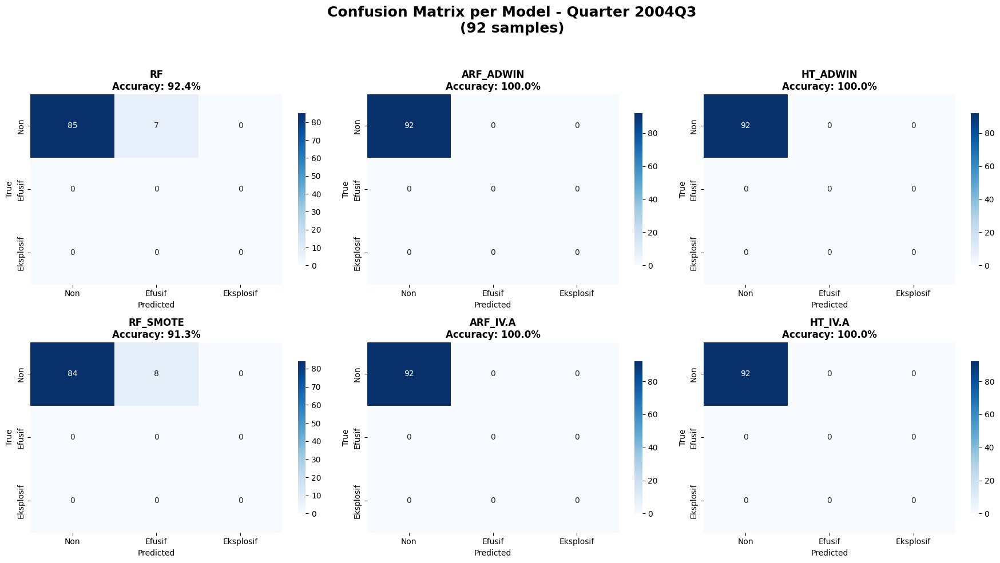

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2004Q3.png


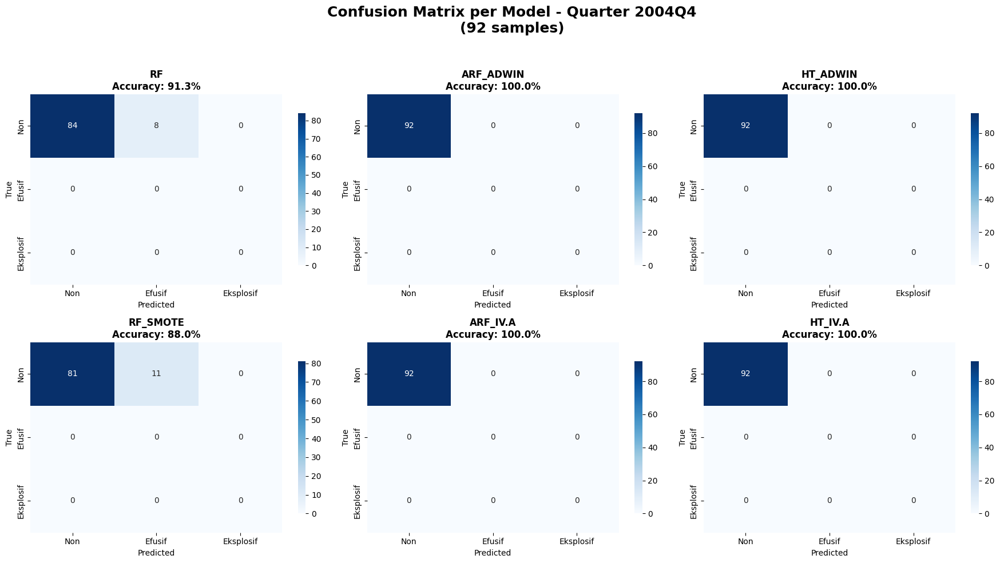

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2004Q4.png


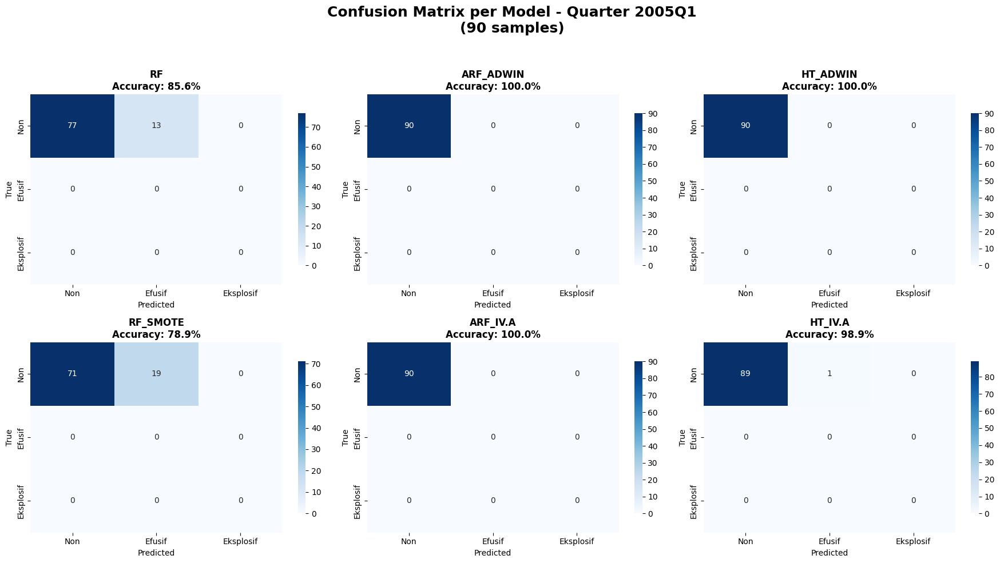

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2005Q1.png


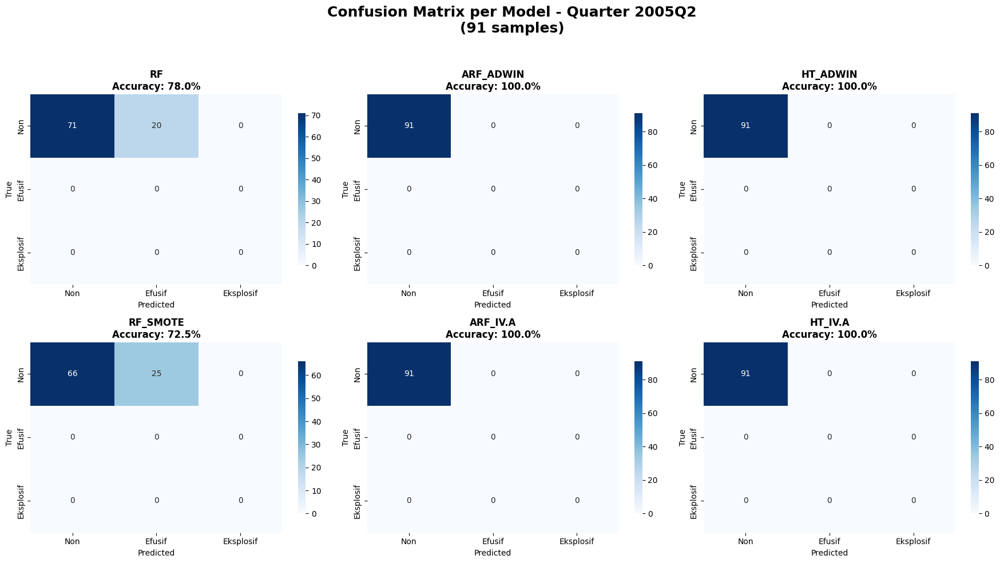

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2005Q2.png


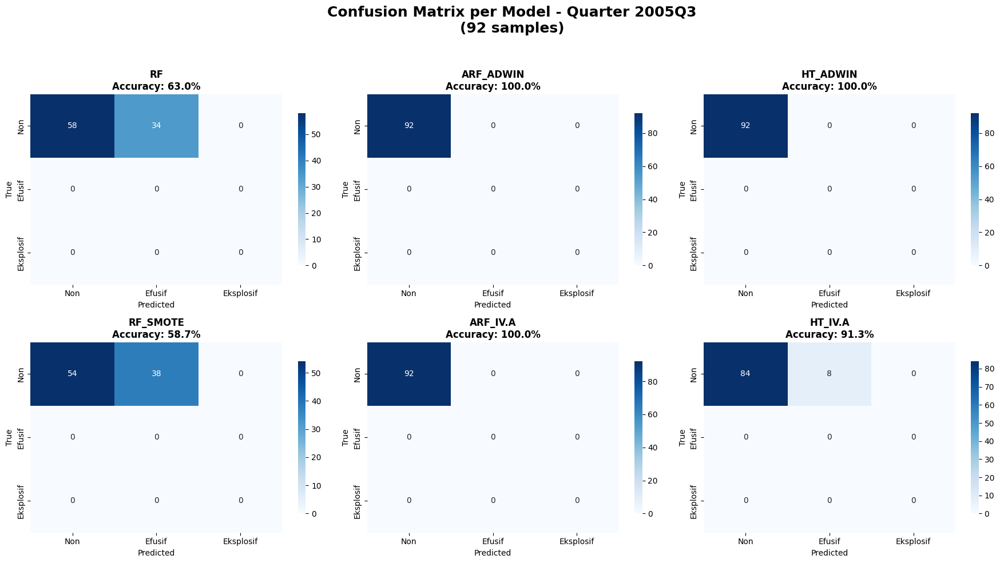

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2005Q3.png


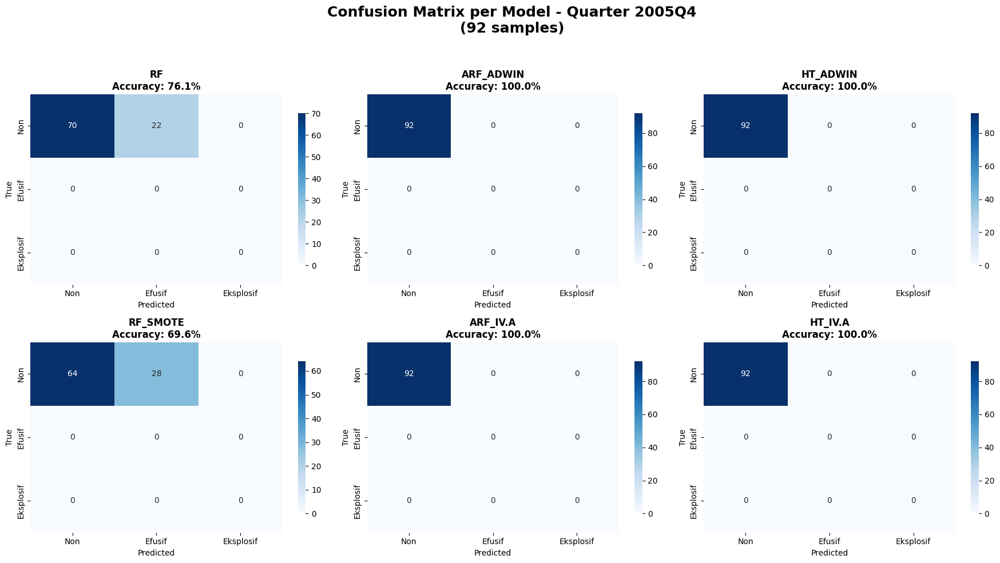

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2005Q4.png


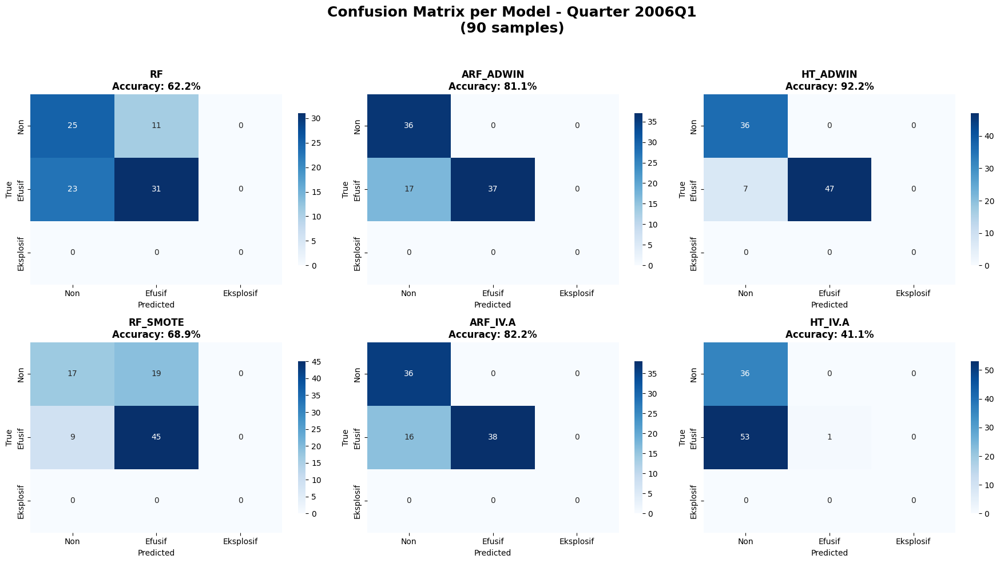

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2006Q1.png


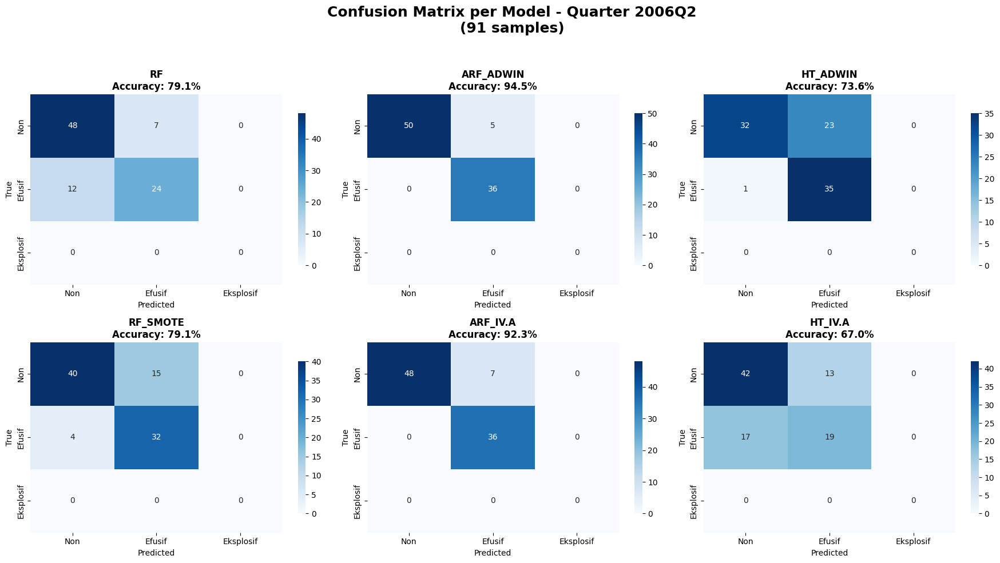

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2006Q2.png


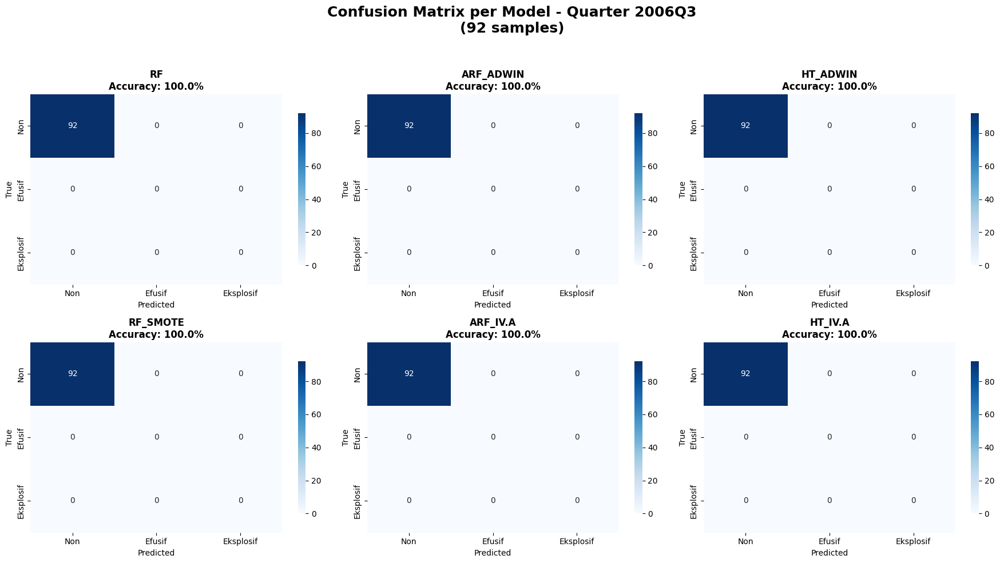

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2006Q3.png


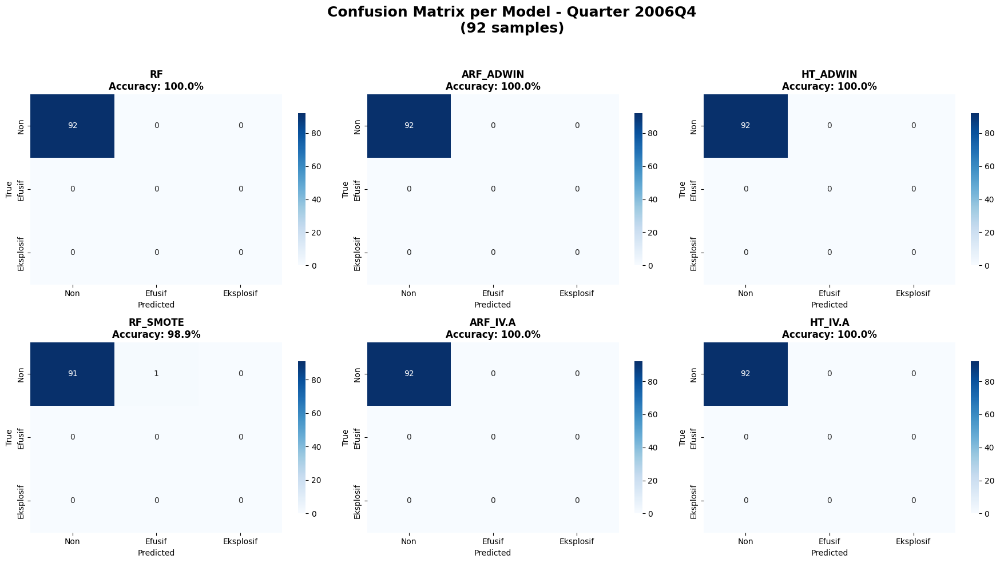

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2006Q4.png


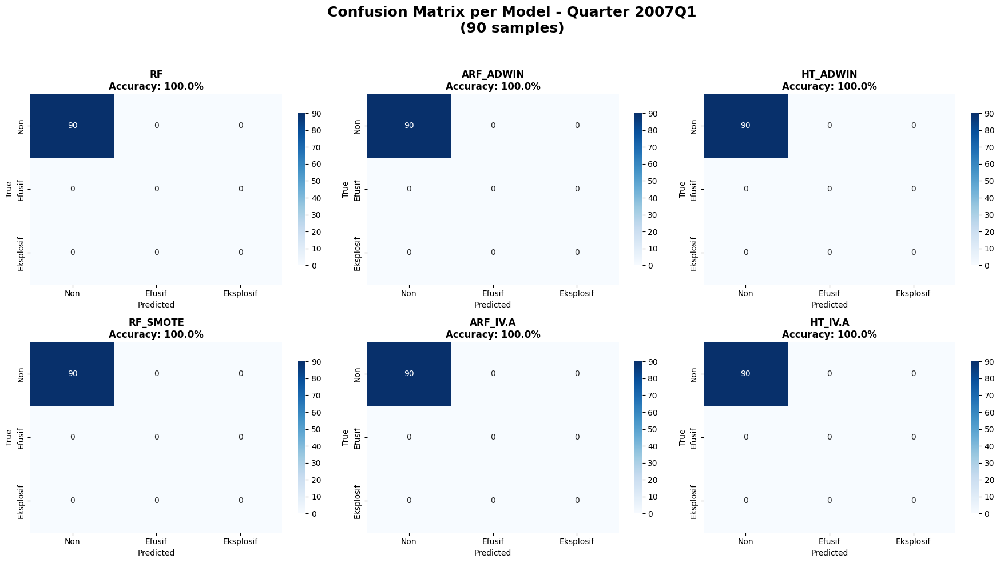

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2007Q1.png


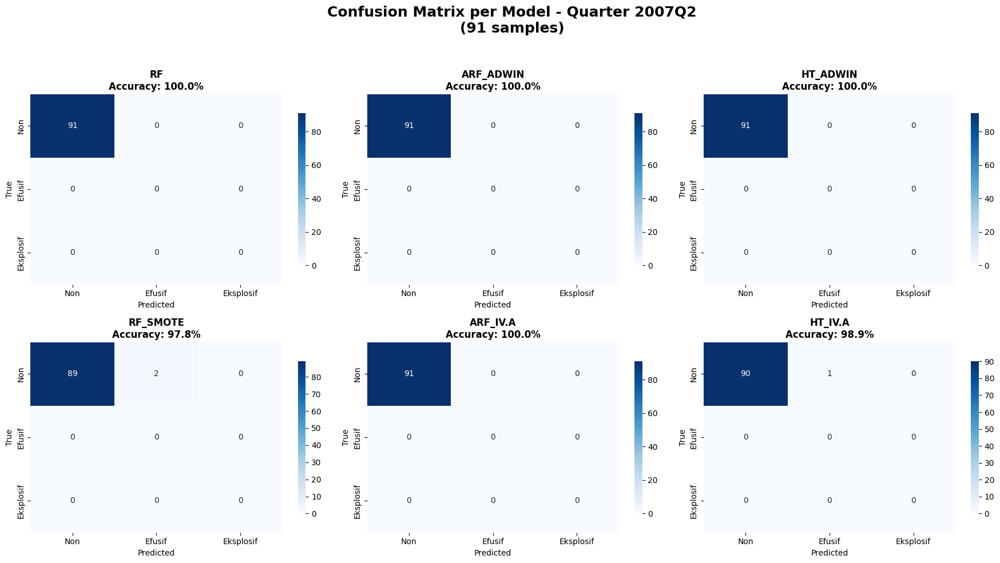

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2007Q2.png


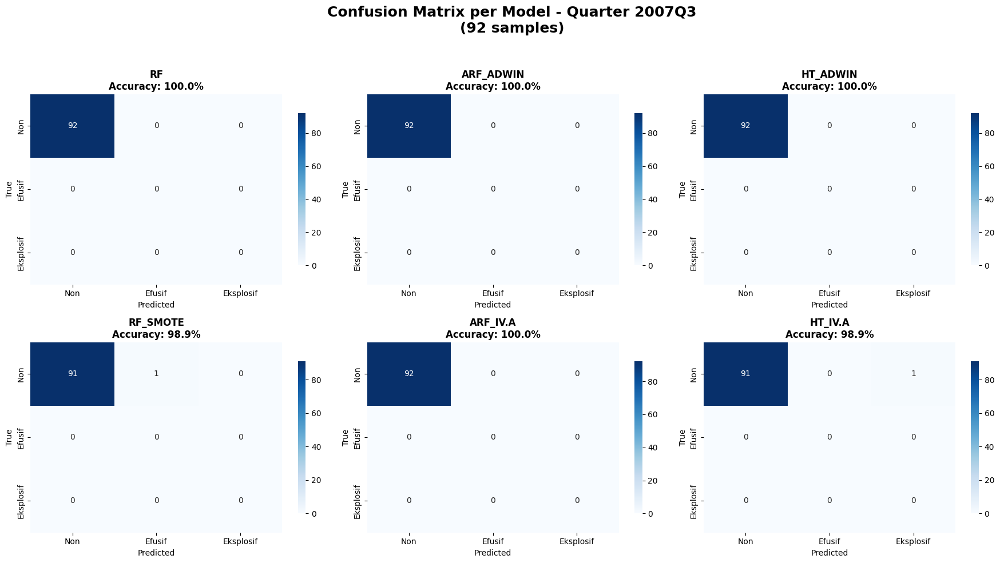

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2007Q3.png


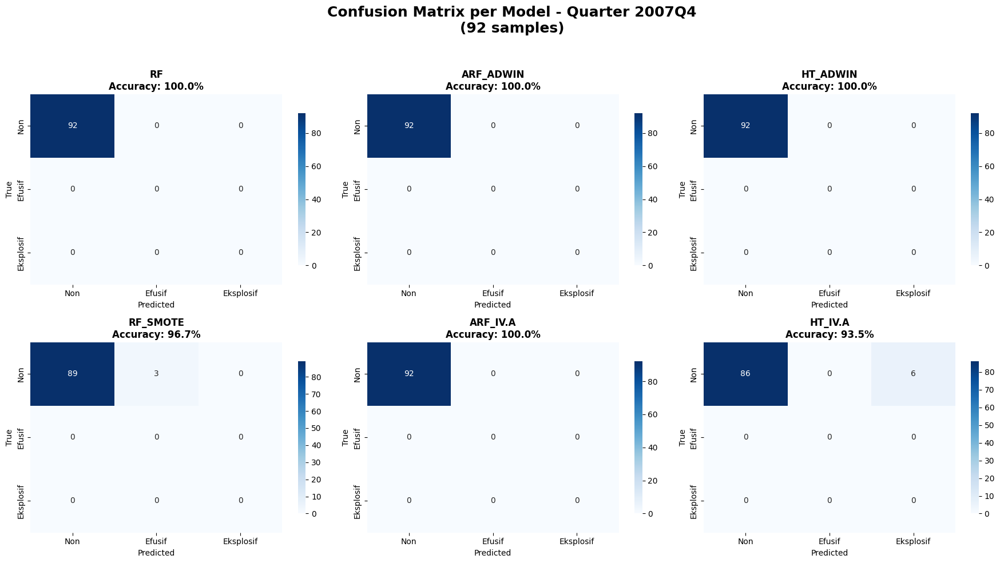

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2007Q4.png


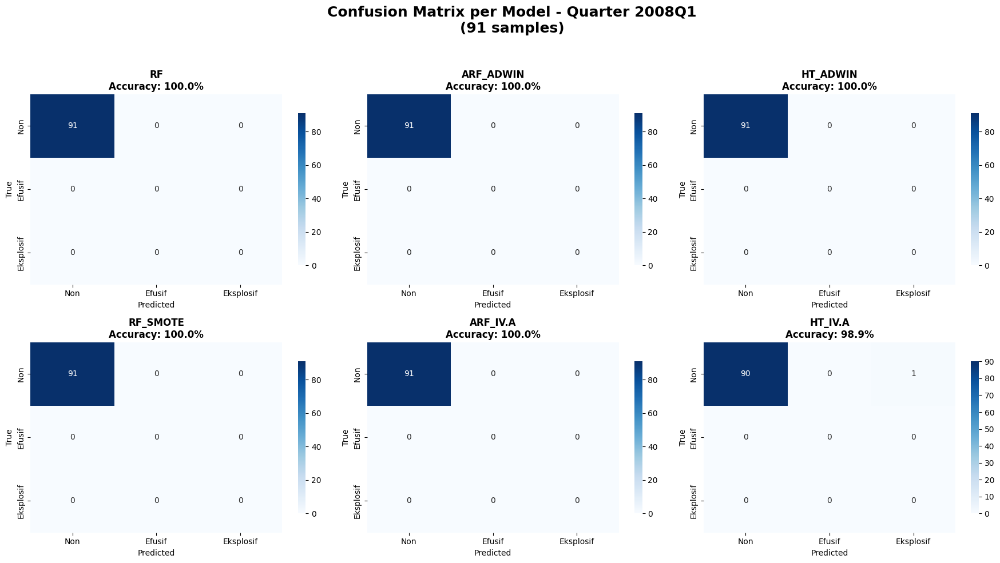

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2008Q1.png


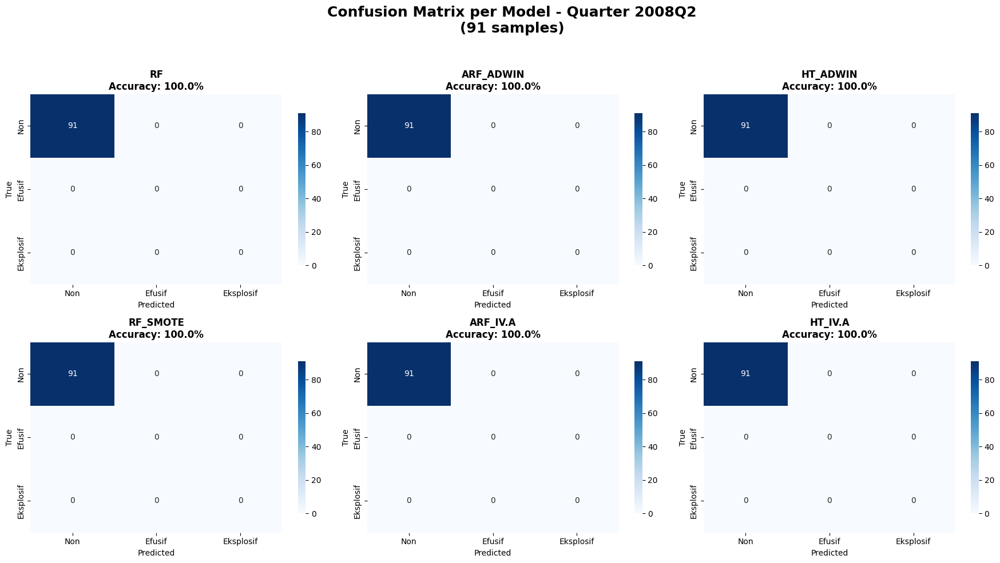

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2008Q2.png


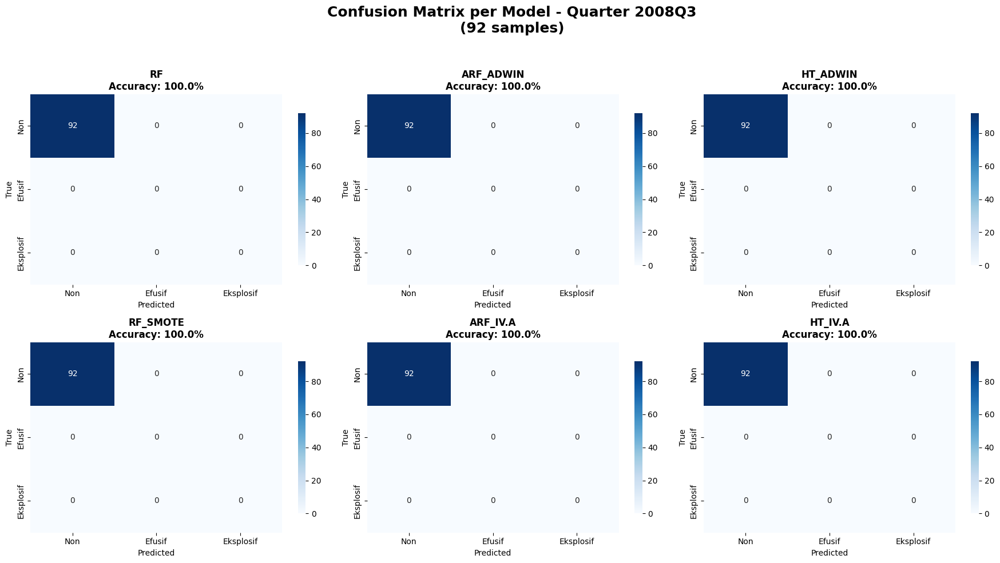

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2008Q3.png


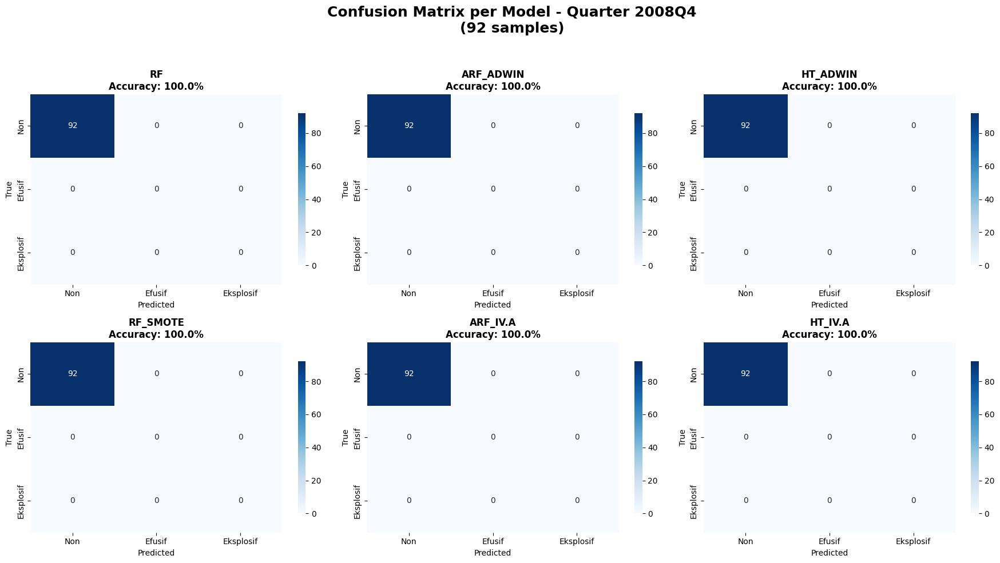

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2008Q4.png


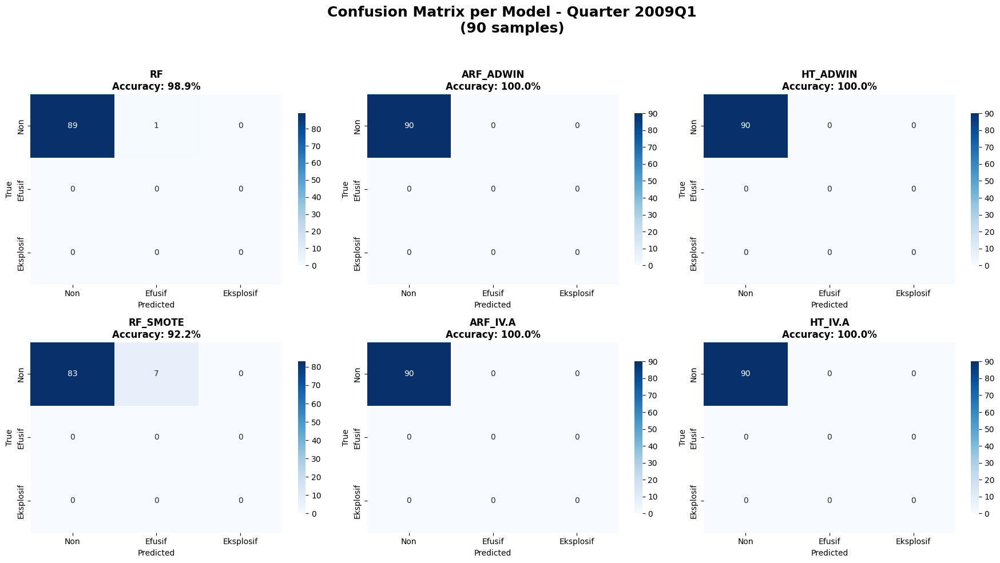

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2009Q1.png


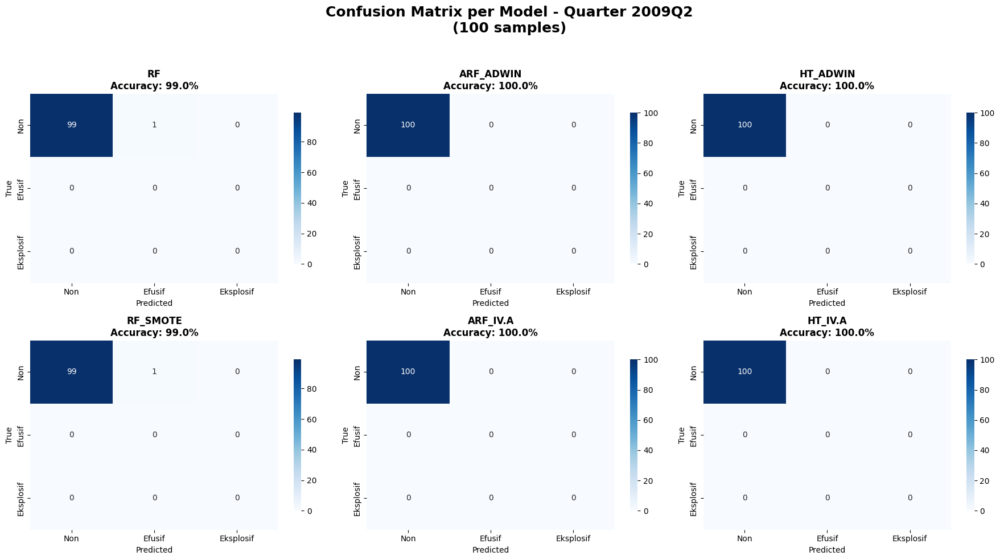

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2009Q2.png


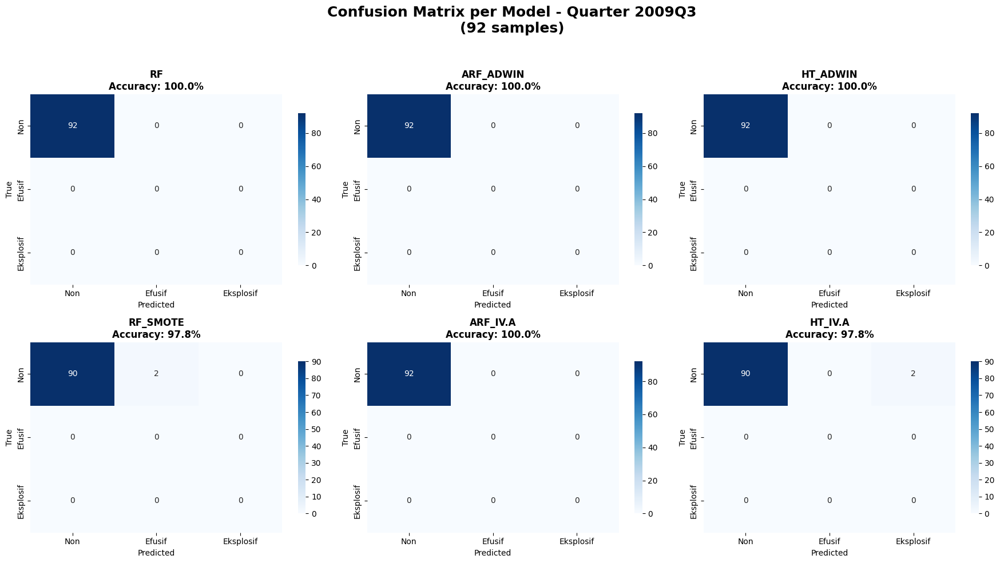

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2009Q3.png


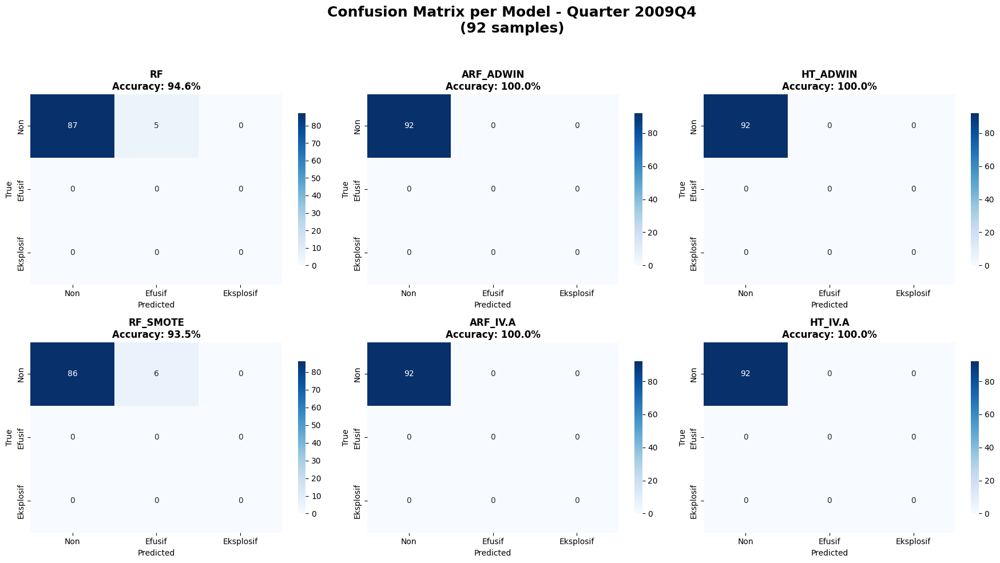

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2009Q4.png


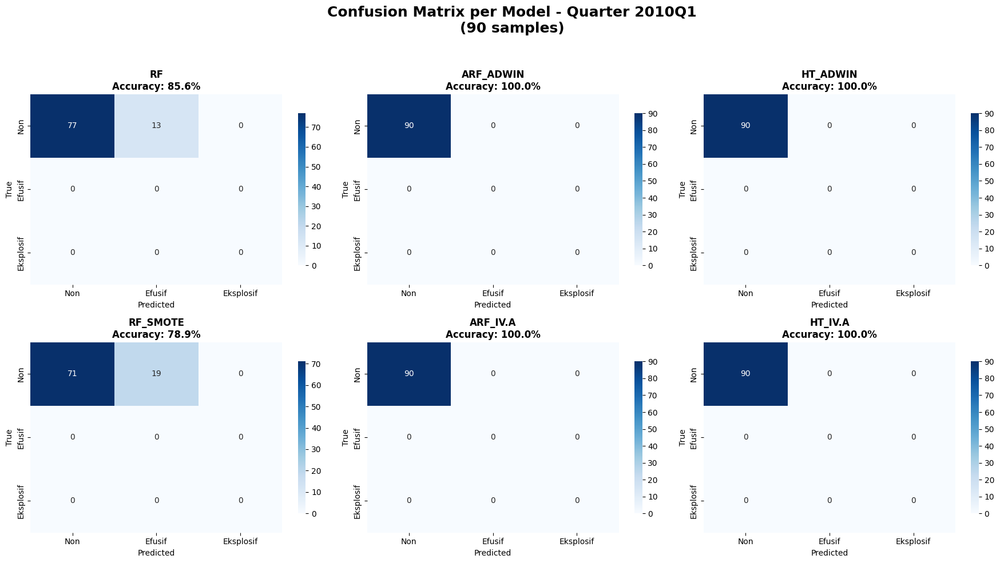

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2010Q1.png


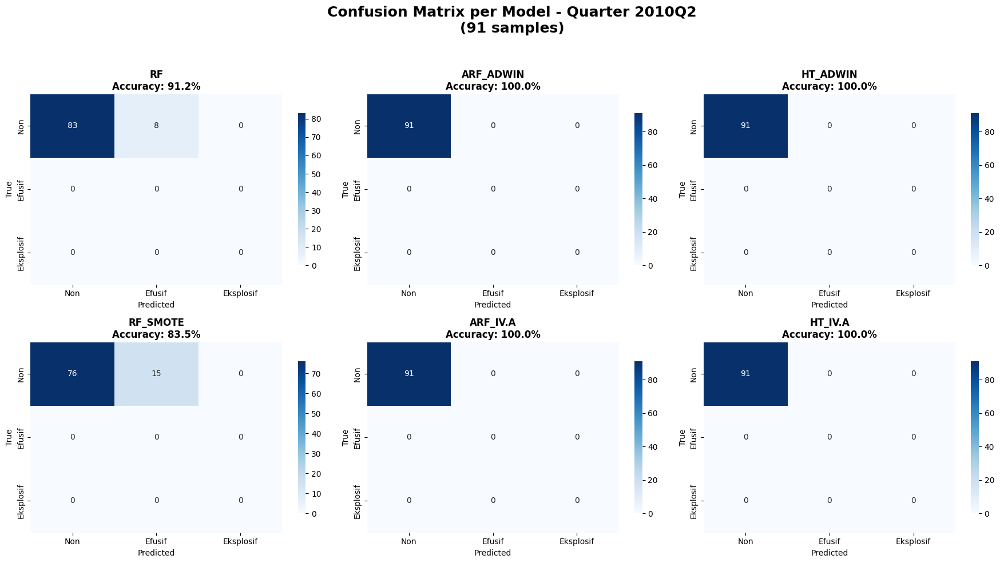

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2010Q2.png


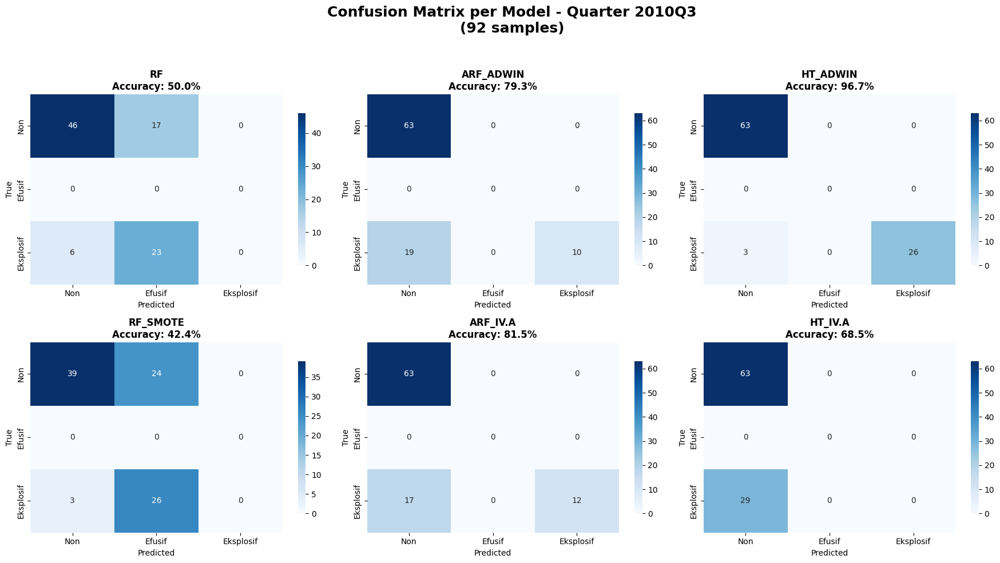

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2010Q3.png


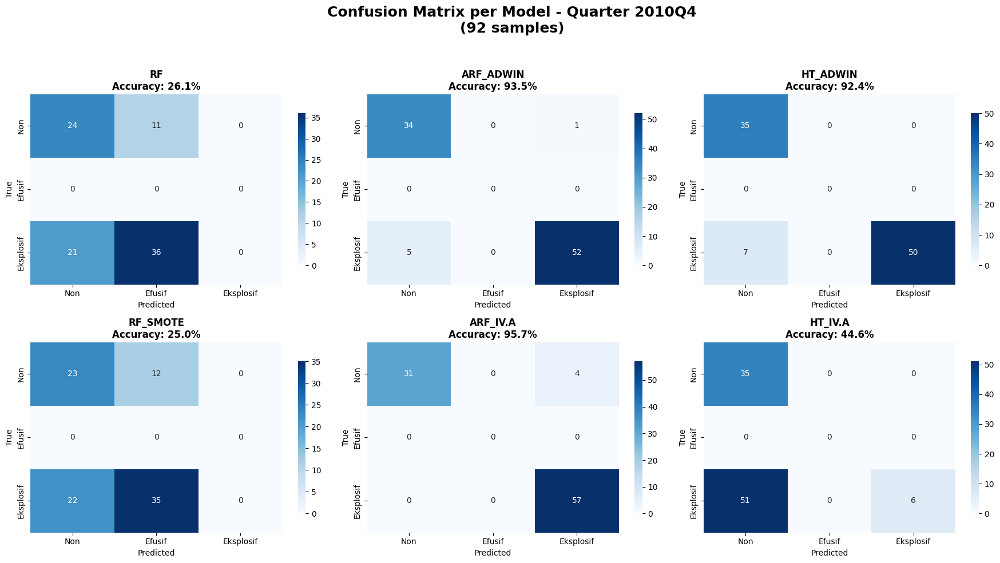

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2010Q4.png


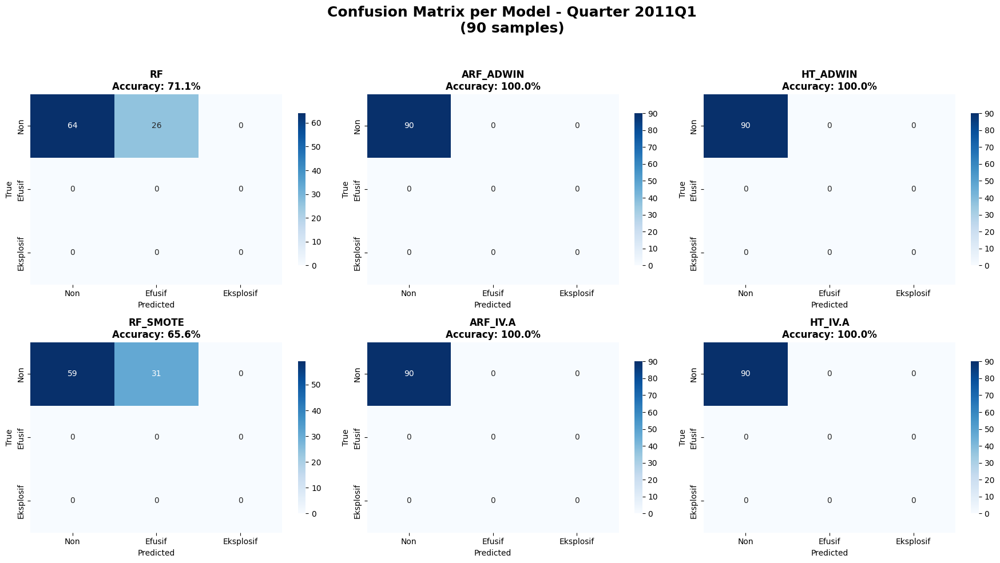

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2011Q1.png


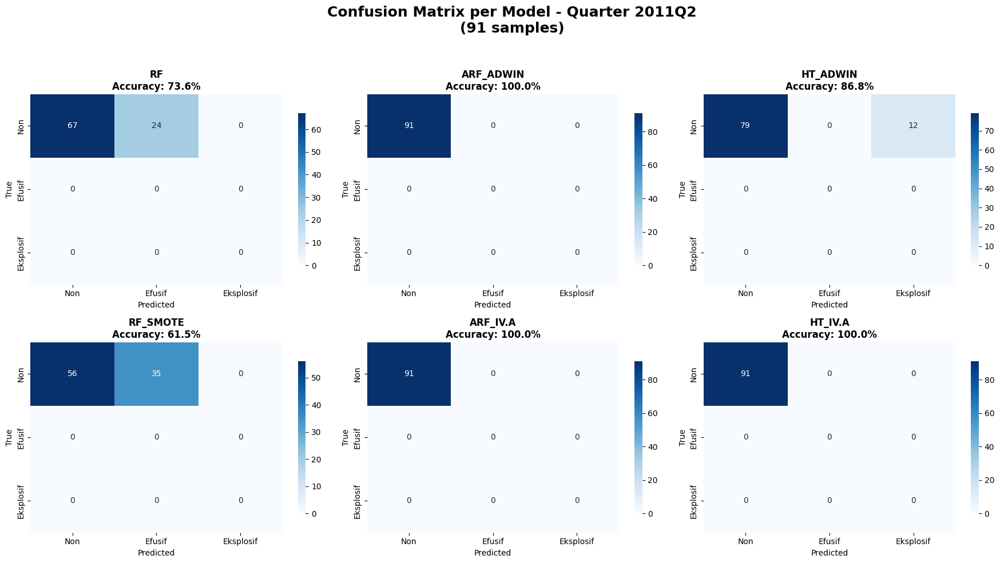

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2011Q2.png


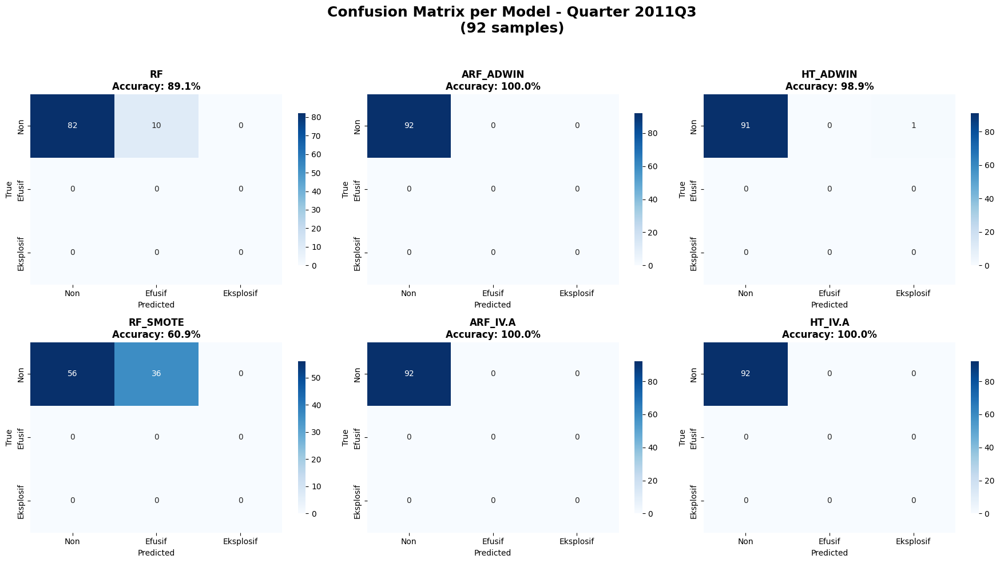

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2011Q3.png


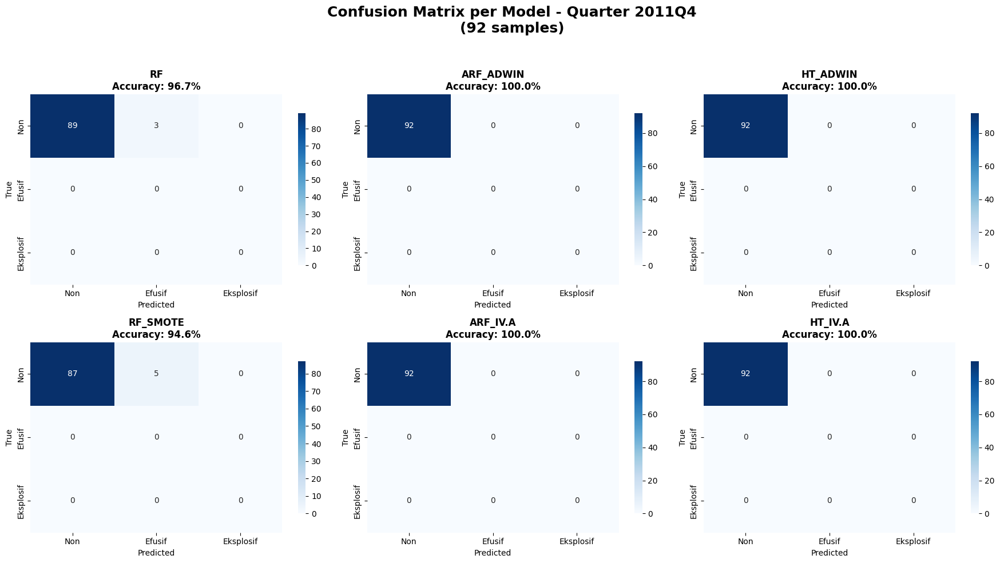

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2011Q4.png


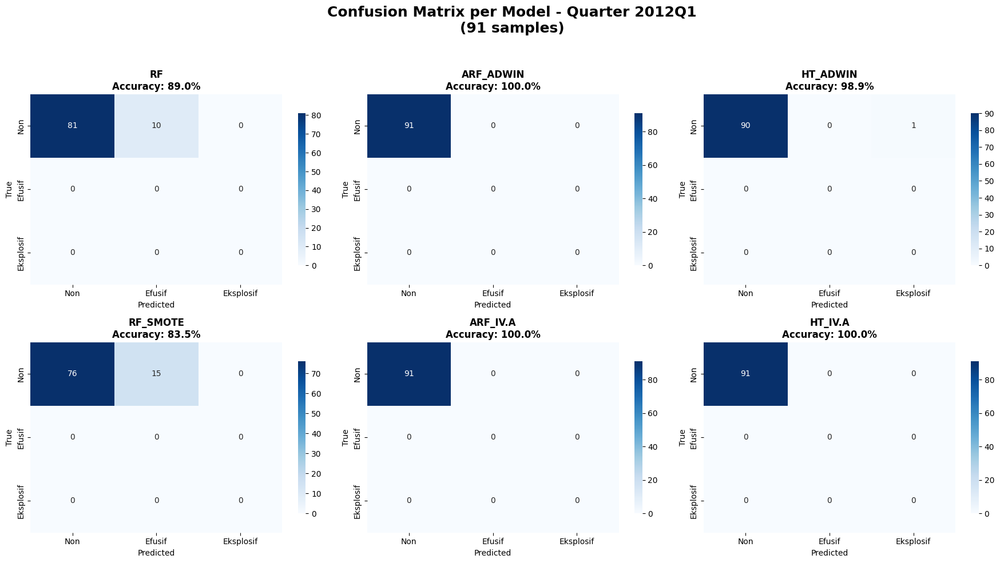

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2012Q1.png


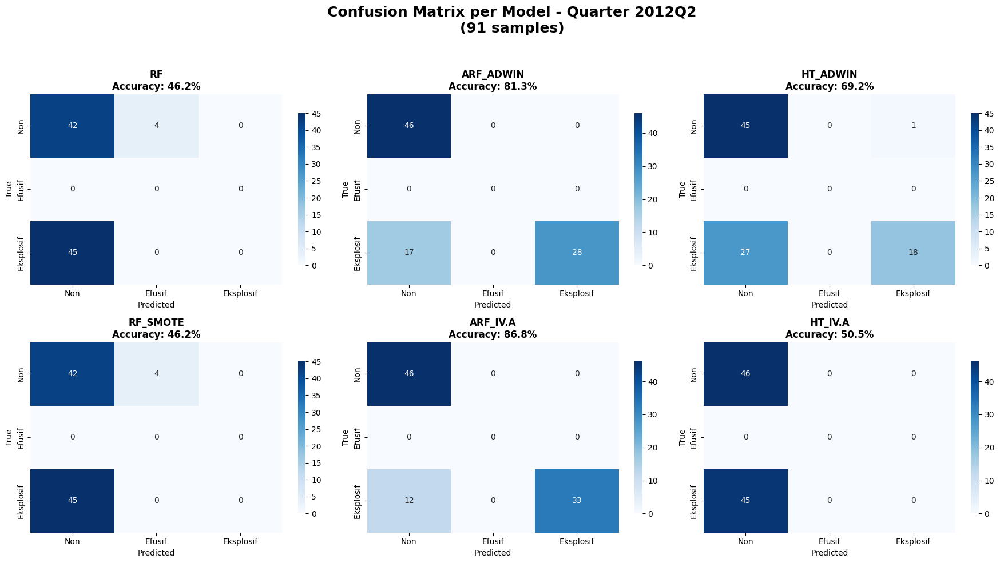

✅ Saved: confusion_matrices_quarterly\confusion_matrix_2012Q2.png


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import os
from sklearn.metrics import confusion_matrix, classification_report

# Create output folder for confusion matrices
output_folder = 'confusion_matrices_quarterly'
os.makedirs(output_folder, exist_ok=True)

# Siapkan dataframe evaluasi
eval_df = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_IV.A': arf_sel_pred,
    'HT_ADWIN': ht_adwin_pred,
    'HT_IV.A': ht_sel_pred
})

# Tambahkan kolom periodik triwulan
eval_df['Period'] = eval_df['Date'].dt.to_period('Q')

# Ambil semua period unik setelah tahun 2000
periods = sorted(eval_df[eval_df['Date'].dt.year >= 2000]['Period'].unique())

# Atur layout model vertikal: atas & bawah per pasangan
models = [
    ['RF', 'RF_SMOTE'],
    ['ARF_ADWIN', 'ARF_IV.A'],
    ['HT_ADWIN', 'HT_IV.A']
]
labels = ['Non', 'Efusif', 'Eksplosif']

# List untuk menyimpan F1 scores
all_f1_scores = []

print(f"📊 Generating confusion matrices for {len(periods)} quarters...")
print(f"💾 Saving plots to folder: {output_folder}")

# Loop tiap periode
for period in periods:
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # Grid 2x3
    quarter_data = eval_df[eval_df['Period'] == period]
    
    # Skip if no data for this quarter
    if quarter_data.empty:
        print(f"⚠️ No data for period {period}, skipping...")
        continue

    # Generate confusion matrices and collect F1 scores
    for col in range(3):
        for row in range(2):
            model = models[col][row]
            ax = axes[row, col]
            
            # Calculate confusion matrix
            cm = confusion_matrix(quarter_data['True'], quarter_data[model], labels=[0, 1, 2])
            
            # Create heatmap
            sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                        xticklabels=labels, yticklabels=labels,
                        cbar_kws={'shrink': 0.8})
            
            # Calculate accuracy for subplot annotation
            accuracy = (cm.diagonal().sum() / cm.sum()) * 100
            
            ax.set_title(f'{model}\nAccuracy: {accuracy:.1f}%', fontweight='bold')
            ax.set_xlabel('Predicted')
            ax.set_ylabel('True')
            
            # === GENERATE F1 SCORES FOR CSV ===
            # Generate classification report for F1 scores
            report = classification_report(
                quarter_data['True'], 
                quarter_data[model], 
                labels=[0, 1, 2], 
                output_dict=True, 
                zero_division=0
            )
            
            # Extract F1 scores for each class
            period_scores = {
                'Period': str(period),
                'Model': model,
                'Samples': len(quarter_data)
            }
            
            # Add F1 scores for each class
            for i, label in enumerate(labels):
                class_key = str(i)
                if class_key in report:
                    period_scores[f'F1_{label}'] = report[class_key]['f1-score']
                else:
                    period_scores[f'F1_{label}'] = 0.0
            
            # Add weighted average F1
            period_scores['F1_Weighted_Avg'] = report.get('weighted avg', {}).get('f1-score', 0.0)
            
            # Add macro average F1
            period_scores['F1_Macro_Avg'] = report.get('macro avg', {}).get('f1-score', 0.0)
            
            # Add accuracy
            period_scores['Accuracy'] = accuracy / 100
            
            all_f1_scores.append(period_scores)

    # Add comprehensive title
    plt.suptitle(f'Confusion Matrix per Model - Quarter {period}\n'
                 f'({len(quarter_data)} samples)', fontsize=18, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    
    # Save the plot
    filename = f'confusion_matrix_{period}.png'
    filepath = os.path.join(output_folder, filename)
    plt.savefig(filepath, dpi=300, bbox_inches='tight')
    
    # Show the plot
    plt.show()
    
    # Close figure to save memory
    plt.close(fig)
    
    # Print confirmation
    print(f"✅ Saved: {filepath}")

# === SAVE F1 SCORES TO CSV ===
f1_df = pd.DataFrame(all_f1_scores)

# Save to CSV
csv_filepath = 'quarterly_f1_scores_detailed.csv'
f1_df.to_csv(csv_filepath, index=False)

print(f"\n📈 F1 SCORES SUMMARY:")
print("=" * 70)
print(f1_df.round(4))

print(f"\n✅ F1 scores saved to: {csv_filepath}")
print(f"📁 Confusion matrices saved to folder: {output_folder}")

# === ADDITIONAL ANALYSIS ===
print(f"\n📊 PERFORMANCE SUMMARY BY MODEL:")
print("-" * 50)

# Calculate average performance per model across all quarters
model_summary = f1_df.groupby('Model').agg({
    'F1_Non': 'mean',
    'F1_Efusif': 'mean', 
    'F1_Eksplosif': 'mean',
    'F1_Weighted_Avg': 'mean',
    'F1_Macro_Avg': 'mean',
    'Accuracy': 'mean',
    'Samples': 'sum'
}).round(4)

print("\nAverage Performance Across All Quarters:")
print(model_summary)

# Save model summary
summary_csv = 'model_performance_summary.csv'
model_summary.to_csv(summary_csv)
print(f"\n✅ Model summary saved to: {summary_csv}")

# === BEST PERFORMING MODEL ANALYSIS ===
print(f"\n🏆 TOP PERFORMING MODELS:")
print("-" * 40)

# Rank by weighted average F1
top_models_f1 = model_summary.sort_values('F1_Weighted_Avg', ascending=False)
print("\nBy Weighted F1-Score:")
for i, (model, scores) in enumerate(top_models_f1.iterrows(), 1):
    print(f"{i}. {model}: {scores['F1_Weighted_Avg']:.4f}")

# Rank by accuracy
top_models_acc = model_summary.sort_values('Accuracy', ascending=False)
print("\nBy Accuracy:")
for i, (model, scores) in enumerate(top_models_acc.iterrows(), 1):
    print(f"{i}. {model}: {scores['Accuracy']:.4f}")

print(f"\n🎯 Analysis complete! Check the generated files:")
print(f"   📊 Confusion matrices: {output_folder}/")
print(f"   📈 Detailed F1 scores: {csv_filepath}")
print(f"   📋 Model summary: {summary_csv}")

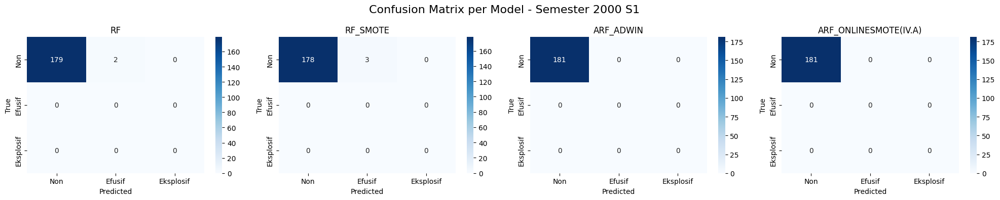

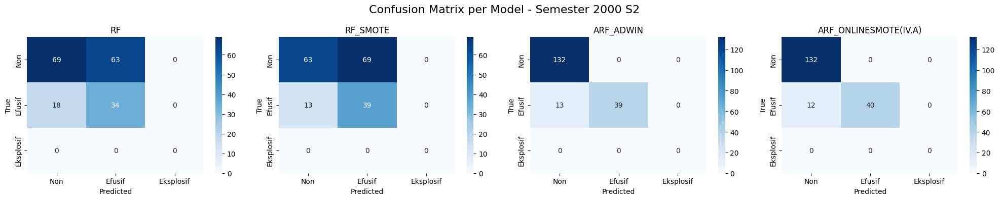

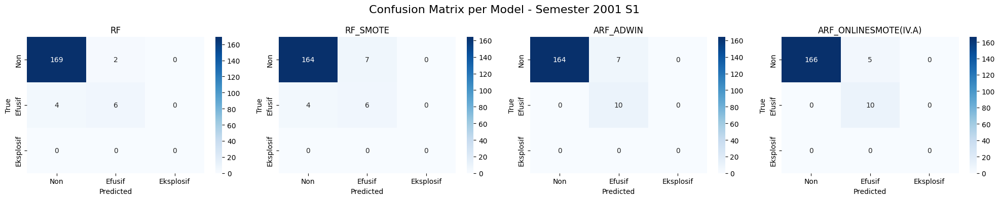

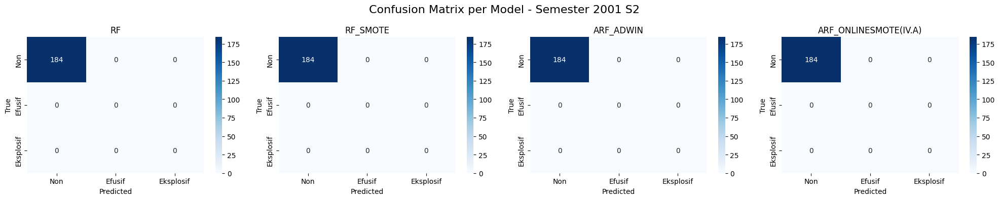

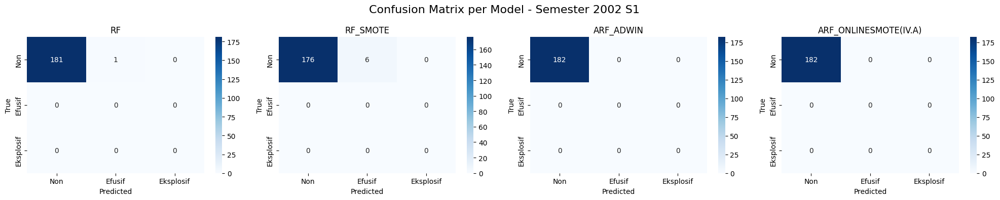

...

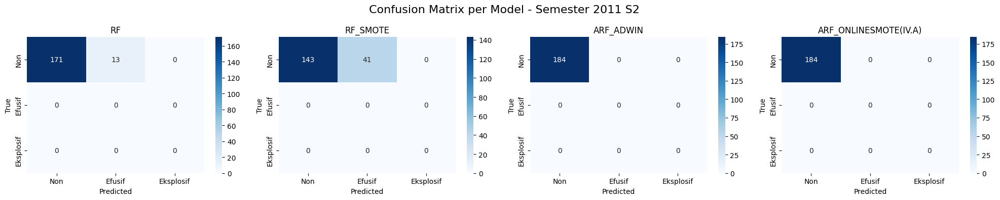

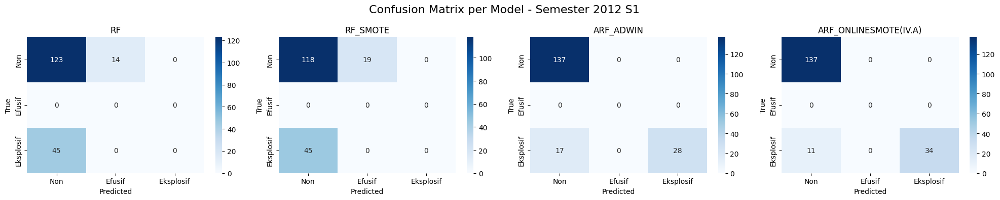

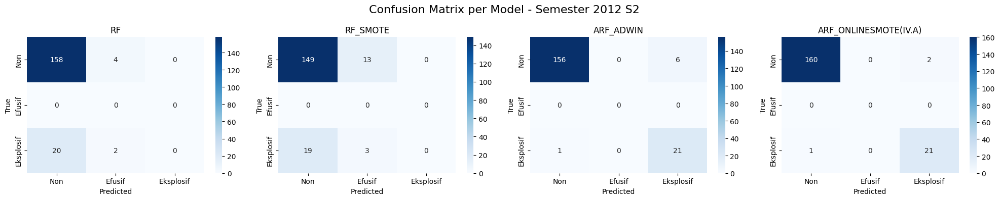

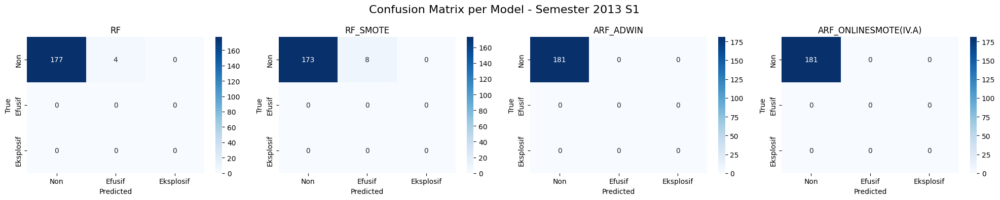

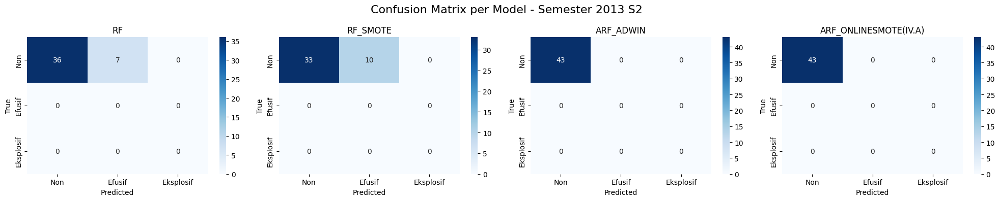

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Pastikan dataframe evaluasi tersedia
eval_df = pd.DataFrame({
    'Date': pd.to_datetime(dates_stream),
    'True': all_true,
    'RF': rf_pred,
    'RF_SMOTE': rf_smote_pred,
    'ARF_ADWIN': arf_adwin_pred,
    'ARF_ONLINESMOTE(IV.A)': arf_sel_pred
})

# Buat kolom semester
eval_df['Semester'] = eval_df['Date'].dt.year.astype(str) + ' S' + ((eval_df['Date'].dt.month - 1) // 6 + 1).astype(str)

# Buat confusion matrix per semester
semesters = sorted(eval_df[eval_df['Date'].dt.year >= 2000]['Semester'].unique())
models = ['RF', 'RF_SMOTE', 'ARF_ADWIN', 'ARF_ONLINESMOTE(IV.A)']
labels = ['Non', 'Efusif', 'Eksplosif']

# Plot 1x4 untuk setiap semester
for sem in semesters:
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))
    sem_data = eval_df[eval_df['Semester'] == sem]

    for i, model in enumerate(models):
        cm = confusion_matrix(sem_data['True'], sem_data[model], labels=[0, 1, 2])
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[i],
                    xticklabels=labels, yticklabels=labels)
        axes[i].set_title(f'{model}')
        axes[i].set_xlabel('Predicted')
        axes[i].set_ylabel('True')

    plt.suptitle(f'Confusion Matrix per Model - Semester {sem}', fontsize=16)
    plt.tight_layout()
    plt.show()


NameError: name 'adwin_drift_point' is not defined

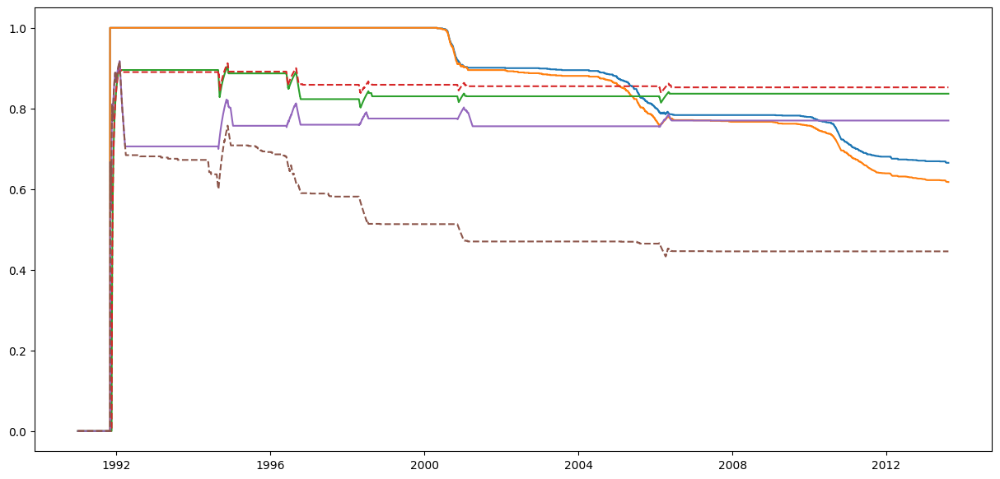

In [ ]:
import datetime

# Ensure your dates are datetime objects; if not, convert them:
threshold_date = datetime.datetime.strptime('1999-12-31', '%Y-%m-%d')

plt.figure(figsize=(15,7))
plt.plot(dates_stream, cum_f1_rf, label='Static RF (train ≤ 2000)')
plt.plot(dates_stream, cum_f1_rf_smote, label='RF + SMOTE')
plt.plot(dates_stream, cum_f1_adwin, label='ARF + ADWIN')
plt.plot(dates_stream, cum_f1_iva, label='ARF IV.A (Online SMOTE)', linestyle='--')
plt.plot(dates_stream, cum_f1_ht_adwin, label='HT + ADWIN')
plt.plot(dates_stream, cum_f1_ht_iva, label='HT IV.A (Online SMOTE)', linestyle='--')

# Plot vertical lines for drift points
for dp in adwin_drift_point:
    if dates[dp] <= threshold_date:  # only mark drift lines within xlim range
        plt.axvline(x=dates[dp], color='red', linestyle=':', alpha=0.2)

plt.xlabel('Date')
plt.ylabel('Cumulative F1-Score')
plt.title('Cumulative F1-Score per Instance Over Time')
plt.ylim(0.75, 1.05)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
